**This notebook won't run in a Windows environment - use Google Colab.**

# 1 - Introduction

## 1.1 - Import packages & librairies

In [ ]:
# run cell below first when restarting runtime in Google Colab
!pip install nlpaug plot_keras_history

In [ ]:
# utilities
import sys
import datetime
from datetime import datetime
import random
import time
import logging
logging.disable(logging.WARNING) # disable WARNING, INFO and DEBUG logging everywhere
import os
import shutil
os.environ["TF_KERAS"]='1'
os.environ["TF_XLA_FLAGS"] = "--tf_xla_enable_xla_devices=false"
os.environ["OMP_NUM_THREADS"] = '1'  # needed to avoid memory leak warning with K-Means in Windows environment
from os import listdir
from glob import glob
from timeit import default_timer as timer

# data cleaning & processing
import pandas as pd
import numpy as np
from sklearn import preprocessing
from sklearn.model_selection import train_test_split

# dataviz
import matplotlib
import matplotlib.pyplot as plt
from matplotlib.image import imread
import seaborn as sns
import plotly.express as px
from matplotlib.ticker import StrMethodFormatter
from matplotlib.ticker import FormatStrFormatter
from plot_keras_history import show_history, plot_history

# text processing
import re
import nltk
from nltk.tokenize import word_tokenize, RegexpTokenizer
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
nltk.download('punkt')
nltk.download('punkt_tab')
nltk.download('stopwords')
nltk.download('wordnet')
from nltk.corpus import stopwords
from collections import defaultdict
from nltk.stem import PorterStemmer, WordNetLemmatizer
from collections import Counter
from wordcloud import WordCloud

# text augmentation
import nlpaug.augmenter.word as naw

# image processing
import cv2
from PIL import Image

# image augmentation
import albumentations as A
from albumentations.pytorch import ToTensorV2

# modelisation
from sklearn import cluster, metrics, manifold, decomposition
from sklearn.cluster import MiniBatchKMeans, KMeans
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV, StratifiedKFold
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
import lightgbm
from lightgbm import LGBMClassifier
import xgboost as xgb
from xgboost import XGBClassifier
import umap
import tensorflow as tf
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.layers import GlobalAveragePooling2D, GlobalAveragePooling1D, Flatten, Dense, Dropout
from tensorflow.keras.layers import Rescaling, RandomFlip, RandomRotation, RandomZoom
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras.applications.vgg16 import preprocess_input
from tensorflow.keras.applications.vgg19 import VGG19
from tensorflow.keras.applications.vgg19 import preprocess_input
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.applications.resnet50 import ResNet50, preprocess_input
from tensorflow.keras.applications import Xception, InceptionV3
from tensorflow.keras.applications.xception import preprocess_input as xception_preprocess
from tensorflow.keras.applications.inception_v3 import preprocess_input as inception_preprocess

# metrics
from sklearn import metrics
from sklearn.metrics import confusion_matrix, accuracy_score, f1_score, make_scorer, fbeta_score, precision_score, recall_score

# set dataframe display options
pd.set_option('max_colwidth', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.float_format', lambda x: '%.4f' % x) # Suppress scientific notation and show only 4 decimals
# pd.set_option('display.float_format', lambda x: '%.f' % x) # Suppress scientific notation and show only integer part

# silence warnings after checking
import warnings
# pd.set_option('future.no_silent_downcasting', False) # introduced in pandas 2.0.0., this notebook uses 1.4.4
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.simplefilter(action='ignore', category=UserWarning)
# warnings.simplefilter(action='ignore', category=pd.errors.SettingWithCopyWarning) # introduced in pandas 2.0.0., this notebook uses 1.4.4
# from PIL import ImageDecompressionBombWarning
warnings.simplefilter('ignore', Image.DecompressionBombWarning)

# extract colors from logo for ppt slideshow
# banana = findColor('banana.png')
# print("banana hex :", banana)
banana = '#fcf7c9'

viridis_sample = ['#481567FF','#453781FF','#39568CFF','#2D708EFF','#238A8DFF','#20A387FF','#3CBB75FF', '#73D055FF','#B8DE29FF']

viridis_palette = ['#440154', '#481e70', '#443982', '#3a528b', '#30678d', '#287b8e', '#20908c', '#20a485', '#35b778', '#5ec961',
                   '#90d643', '#c7e01f', '#fde724']

sunset_palette = ["#FFEB3B", "#FFDA44", "#FFC107", "#FFB300", "#FFA000", "#FF8F00", "#FF6F00", "#FF5722", "#FF3D00", "#FF2D00",
                  "#E53935", "#D32F2F", "#C62828", "#B71C1C", "#FF5252", "#FF1744", "#FF4081", "#F50057", "#D5006D", "#C51162"]

palette = ['#440154', '#481e70', '#443982', '#3a528b', '#30678d', '#287b8e', '#20908c', '#20a485', '#35b778', '#5ec961',
           '#90d643', '#c7e01f', '#fde724', "#FFEB3B", "#FFDA44", "#FFC107", "#FFB300", "#FFA000", "#FF8F00", "#FF6F00",
           "#FF5722", "#FF3D00", "#FF2D00", "#E53935", "#D32F2F", "#C62828", "#B71C1C", "#FF5252", "#FF1744", "#FF4081",
           "#F50057", "#D5006D", "#C51162"]

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


In [ ]:
# run this cell in Google Colab only
from google.colab import drive
drive.mount('/content/drive')
image_path = '/content/drive/My Drive/Colab Notebooks/OCDS_P6/flipkart_images'
image_path_aug = '/content/drive/My Drive/Colab Notebooks/OCDS_P6/augmented_images'
save_path = '/content/drive/My Drive/Colab Notebooks/OCDS_P6'
image_save_path = save_path

Mounted at /content/drive


In [ ]:
# import custom user-defined functions
functions_path = os.path.join(save_path, 'functions.py')

# Check if the path is already in sys.path
if os.path.dirname(functions_path) not in sys.path:
    sys.path.append(os.path.dirname(functions_path))

from functions import *

ModuleNotFoundError: No module named 'functions'

In [ ]:
# import split df with photo names, pre-processed text and product categories
train_df = pd.read_parquet(save_path + '/'+'train_df.gzip')
y_train = train_df['real_clusters']
val_df = pd.read_parquet(save_path + '/'+'val_df.gzip')
y_val = val_df['real_clusters']
test_df = pd.read_parquet(save_path + '/'+'test_df.gzip')
y_test = test_df['real_clusters']
train_val_df = pd.concat([train_df, val_df], axis=0, ignore_index=True)
y_train_val_images = pd.concat([y_train, y_val], axis=0, ignore_index=True)

# import merged text and image features
X_train_aug = pd.read_csv(save_path + '/' + 'X_train_aug.csv')
X_train_no_aug = pd.read_csv(save_path + '/' + 'X_train_no_aug.csv')
X_val_aug = pd.read_csv(save_path + '/' + 'X_val_aug.csv')
X_val_no_aug = pd.read_csv(save_path + '/' + 'X_val_no_aug.csv')
X_test_aug = pd.read_csv(save_path + '/' + 'X_test_aug.csv')
X_test_no_aug = pd.read_csv(save_path + '/' + 'X_test_no_aug.csv')
# create / import datasets for best model re-training
# X_train_val_aug = pd.concat([X_train_aug, X_val_aug], axis=0, ignore_index=True)
# print(X_train_val_aug.shape)
# X_train_val_aug.to_csv(save_path + '/' + 'X_traing_val_aug.csv', index=False)
X_train_val_aug = pd.read_csv(save_path + '/' + 'X_traing_val_aug.csv')
# X_train_val_no_aug = pd.concat([X_train_no_aug, X_val_no_aug], axis=0, ignore_index=True)
# print(X_train_val_no_aug.shape)
# X_train_val_no_aug.to_csv(save_path + '/' + 'X_traing_val_no_aug.csv', index=False)
X_train_val_no_aug = pd.read_csv(save_path + '/' + 'X_traing_val_no_aug.csv')
# y_train_val = pd.concat([y_train, y_val], axis=0, ignore_index=True)
# print(y_train_val.shape)
# y_train_val.to_csv(save_path + '/' + 'y_train_val.csv', index=False)
y_train_val = pd.read_csv(save_path + '/' + 'y_train_val.csv')

# import text features
text_features_train_aug = pd.read_csv(save_path + '/'+ 'text_features_train_aug.csv')
text_features_train_no_aug = pd.read_csv(save_path + '/'+ 'text_features_train_no_aug.csv')
text_features_val_aug = pd.read_csv(save_path + '/'+'text_features_val_aug.csv')
text_features_val_no_aug = pd.read_csv(save_path + '/'+'text_features_val_no_aug.csv')
text_features_test_aug = pd.read_csv(save_path + '/'+'text_features_test_aug.csv')
text_features_test_no_aug = pd.read_csv(save_path + '/'+'text_features_test_no_aug.csv')

# import image features
image_features_train_aug = pd.read_csv(save_path + '/' + 'image_features_train_aug.csv')
image_features_train_no_aug = pd.read_csv(save_path + '/' + 'image_features_train_no_aug.csv')
image_features_val = pd.read_csv(save_path + '/'+ 'image_features_val.csv')
image_features_test = pd.read_csv(save_path + '/'+ 'image_features_test.csv')

FileNotFoundError: [Errno 2] No such file or directory: '/content/drive/My Drive/Colab Notebooks/OCDS_P6/train_df.gzip'

In [ ]:
print(np.__version__, '\n')
print(tf.__file__, '\n')
print(tf.__version__, '\n')
print(hasattr(tf, 'keras'), '\n')
print(type(tf), '\n')
print(tf.__spec__, '\n')
print(dir(tf.keras))  # should list keras submodules

In [ ]:
gpus = tf.config.list_physical_devices('GPU')
if gpus:
    print(f"TensorFlow detected {len(gpus)} GPU(s):")
    for gpu in gpus:
        print(f" - {gpu}")
else:
    print("TensorFlow did NOT detect any GPUs.")

print("Num GPUs Available: ", len(tf.config.experimental.list_physical_devices('GPU')))
print(tf.test.is_built_with_cuda())

TensorFlow detected 1 GPU(s):
 - PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')
Num GPUs Available:  1
True


In [ ]:
gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Not connected to a GPU')
else:
  print(gpu_info)

Sat May 17 14:29:09 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   36C    P8              9W /   70W |       2MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [ ]:
from psutil import virtual_memory
ram_gb = virtual_memory().total / 1e9
print('Your runtime has {:.1f} gigabytes of available RAM\n'.format(ram_gb))

if ram_gb < 20:
  print('Not using a high-RAM runtime')
else:
  print('You are using a high-RAM runtime!')

Your runtime has 54.8 gigabytes of available RAM

You are using a high-RAM runtime!


In [ ]:
# initialise random state for all models and transformers
rs_list = [8, 13, 42]
rs = rs_list[random.randrange(len(rs_list))]
print("Random state =", rs)

Random state = 13


## 1.2 - Define text functions

### 1.2.1 - Text augmentation

In [ ]:
# Initialize augmenters once
synonym_aug = naw.SynonymAug(aug_src='wordnet', aug_p=0.1)  # Replace ~10% words with synonyms
random_insertion_aug = naw.RandomWordAug(action='insert', aug_p=0.1)  # Insert random words
contextual_aug = naw.ContextualWordEmbsAug(model_path='bert-base-uncased', action='insert', aug_p=0.1)
random_word_aug = naw.RandomWordAug(action='swap', aug_p=0.1)  # swap words instead of insert
random_word_aug = naw.RandomWordAug(action='delete', aug_p=0.1)  # delete words instead of insert

def augment_text(text):
    # Apply synonym replacement
    augmented_text = synonym_aug.augment(text)
    # Apply random insertion
    # augmented_text = random_insertion_aug.augment(augmented_text) # nlpaug bug - currently HS
    augmented_text = naw.RandomWordAug(action='swap', aug_p=0.1)
    augmented_text = contextual_aug.augment(augmented_text)
    return augmented_text

def augment_corpus(df, text_column, label_column):
    augmented_texts = []
    labels = []

    for idx, row in df.iterrows():
        original_text = row[text_column]
        label = row[label_column]

        # Augment the text
        augmented_text = augment_text(original_text)

        augmented_texts.append(augmented_text)
        labels.append(label)

    augmented_df = pd.DataFrame({
        'augmented_text': augmented_texts,
        'label': labels
    })
    return augmented_df

C:\Users\celin\DS Projets Python\OCDS-repos-all\OCDS-P6\venv39\lib\site-packages\huggingface_hub\file_download.py:896: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


### 1.2.2 - Text processing

In [ ]:
def tokenize(word_string):
    tokenizer = RegexpTokenizer(r"[a-zA-Z]+")
    word_tokens = tokenizer.tokenize(word_string.lower())
    return word_tokens

def remove_stop_words(word_list):
    stop_words = list(set(stopwords.words('english')))
    filtered_words = [word for word in word_list if not word in stop_words]
    filtered_words_trim = [word for word in filtered_words if len(word) > 2]
    return filtered_words_trim

def lemmatize(word_list):
    lemmatizer = WordNetLemmatizer()
    lem_words = [lemmatizer.lemmatize(word) for word in word_list]
    return lem_words

def stem(word_list):
    stemmer = PorterStemmer()
    stem_words = [stemmer.stem(word) for word in word_list]
    return stem_words

def filter_words(word_list, words_to_trim):
    filtered_words = [word for word in word_list if not word in words_to_trim]
    # filtered_w2 = [w for w in filtered_w if len(w) > 2]
    return filtered_words

In [ ]:
# Sub-function to remove specific words from a list of tokens
def trim_words_fct(tokens, words_to_trim):
    words_to_trim_set = set(words_to_trim)
    return [token for token in tokens if token not in words_to_trim_set]

In [ ]:
# Text prep function for Bag-of-Words, Tf-idf & Word2Vec
def bag_of_words_transfo(word_string):
    word_tokens = tokenize(word_string)
    sw = remove_stop_words(word_tokens)
    trimmed = trim_words_fct(sw, words_to_trim)
    # lem_w = lemmatize(sw)
    transf_desc_text = ' '.join(trimmed)
    return transf_desc_text

# Text prep function for Bag-of-Words with lemmatization
def bag_of_words_transfo_lem(word_string):
    word_tokens = tokenize(word_string)
    sw = remove_stop_words(word_tokens)
    lem_w = lemmatize(sw)
    trimmed = trim_words_fct(lem_w, words_to_trim)
    transf_desc_text = ' '.join(trimmed)
    return transf_desc_text

# Text prep function for deep learning (BERT & USE)
def deep_lean_transfo(word_string) :
    word_tokens = tokenize(word_string)
    # sw = remove_stop_words(word_tokens)
    # trimmed = trim_words_fct(lem_w, words_to_trim)
    # lem_w = lemmatize(sw)
    transf_desc_text = ' '.join(word_tokens)
    return transf_desc_text

### 1.2.3 - Graphing functions

In [ ]:
# recoloring function for wordclouds
def sunset_color_func(word, font_size, position, orientation, random_state=None, **kwargs):
    return random.choice(sunset_palette)

## 1.3 - Define text classification metrics

In [ ]:
def calc_ari(features, perplexity=30, n_components=2):
    time1 = time.time()
    num_labels = len(np.unique(y_cat_num))
    random_state = 42

    # t-SNE embedding
    tsne = manifold.TSNE(
        n_components=n_components,
        perplexity=perplexity,
        n_iter=2000,
        init='random',
        learning_rate=200,
        random_state=random_state
    )
    X_tsne = tsne.fit_transform(features)

    # UMAP embedding
    reducer = umap.UMAP(
        n_components=n_components,
        n_neighbors=15,
        min_dist=0.1,
        random_state=random_state
    )
    X_umap = reducer.fit_transform(features)

    # Clustering on t-SNE embedding
    cls = cluster.KMeans(n_clusters=num_labels, n_init=100, random_state=random_state)
    cls.fit(X_tsne)

    ARI = np.round(metrics.adjusted_rand_score(y_cat_num, cls.labels_), 4)
    fit_time = np.round(time.time() - time1, 2)
    print(f"ARI: {ARI}, Time: {fit_time}s")

    return ARI, X_tsne, X_umap, cls.labels_, fit_time

In [ ]:
def find_optimum_perplexity(features):
    perplexity_range = np.arange(5, 55, 5)
    divergence = []

    for p in perplexity_range:
        model = TSNE(n_components=2, init="pca", perplexity=p, random_state=42)
        _ = model.fit_transform(features)
        divergence.append(model.kl_divergence_)

    # Prepare data for seaborn
    data_plot = pd.DataFrame({'Perplexity': perplexity_range, 'KL Divergence': divergence})
    sns.set(rc={'figure.figsize':(6, 4), 'axes.facecolor':'white', 'figure.facecolor':'gainsboro'})

    sns.lineplot(x='Perplexity', y='KL Divergence', data=data_plot, marker="o", color=banana, linewidth=2)
    plt.title("t-SNE KL Divergence vs Perplexity")
    plt.xlabel("Perplexity Values")
    plt.ylabel("KL Divergence")
    plt.xticks(perplexity_range)

    # Generate timestamp and save plot
    timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
    filename = f"optimum_perplexity_{timestamp}.png"
    plt.savefig(save_path + '/' + filename)

    plt.show()

    # Find perplexity with minimum divergence
    min_index = np.argmin(divergence)
    optimum_perplexity = perplexity_range[min_index]

    print(f"Optimum perplexity: {optimum_perplexity} with divergence {divergence[min_index]:.4f}")
    return optimum_perplexity

In [ ]:
def TSNE_visu_fct(X_tsne, y_cat_num, labels, ARI):
    """
    Visualize t-SNE embeddings colored by true categories and by cluster labels,
    using a custom color palette for both.

    Parameters:
    - X_tsne: np.ndarray of shape (n_samples, 2)
    - y_cat_num: array-like of true category numbers (ints)
    - labels: array-like of cluster numbers (ints)
    - ARI: float, Adjusted Rand Index
    - sunset_palette: list of color hex codes
    - products_trim: DataFrame with column 'real_clusters' (category names)
    """
    # Get unique category names in the order of their numeric encoding
    # (Assume y_cat_num is label-encoded so 0 maps to first unique, etc.)
    category_names = list(y_cat_num.unique())
    n_categories = len(category_names)
    n_clusters = len(np.unique(labels))

    # Ensure palette is long enough
    sunset_palette = ["#FFEB3B", "#FFDA44", "#FFC107", "#FFB300", "#FFA000", "#FF8F00", "#FF6F00", "#FF5722", "#FF3D00", "#FF2D00",
                  "#E53935", "#D32F2F", "#C62828", "#B71C1C", "#FF5252", "#FF1744", "#FF4081", "#F50057", "#D5006D", "#C51162"]
    palette_cat = sunset_palette * ((n_categories // len(sunset_palette)) + 1)
    palette_cluster = sunset_palette * ((n_clusters // len(sunset_palette)) + 1)

    fig = plt.figure(figsize=(15, 6))

    # Left: by true category
    ax1 = fig.add_subplot(121)
    scatter1 = ax1.scatter(
        X_tsne[:, 0], X_tsne[:, 1],
        c=y_cat_num,
        cmap=matplotlib.colors.ListedColormap(palette_cat[:n_categories]),
        s=40, alpha=0.85
    )
    # Custom legend for categories
    handles1 = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=palette_cat[i], markersize=10)
                for i in range(n_categories)]
    ax1.legend(handles1, category_names, loc="best", title="Category")
    ax1.set_title('t-SNE by True Categories')

    # Right: by cluster label
    ax2 = fig.add_subplot(122)
    scatter2 = ax2.scatter(
        X_tsne[:, 0], X_tsne[:, 1],
        c=labels,
        cmap=matplotlib.colors.ListedColormap(palette_cluster[:n_clusters]),
        s=40, alpha=0.85
    )
    # Custom legend for clusters
    cluster_labels = [f'Cluster {i}' for i in range(n_clusters)]
    handles2 = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=palette_cluster[i], markersize=10)
                for i in range(n_clusters)]
    ax2.legend(handles2, cluster_labels, loc="best", title="Cluster")
    ax2.set_title('t-SNE by Clusters')

    plt.suptitle(f"t-SNE Visualization | ARI: {ARI}", fontsize=14, fontweight='bold')
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()
    print("ARI:", ARI)

In [ ]:
def UMAP_visu_fct(X_umap, y_cat_num, labels, ARI):
    """
    Visualize UMAP embeddings colored by true categories and by cluster labels,
    using a custom color palette for both.

    Parameters:
    - X_umap: np.ndarray of shape (n_samples, 2), UMAP embedding
    - y_cat_num: array-like of true category numbers (ints)
    - labels: array-like of cluster numbers (ints)
    - ARI: float, Adjusted Rand Index
    """
    category_names = np.unique(y_cat_num)
    n_categories = len(category_names)
    n_clusters = len(np.unique(labels))

    sunset_palette = [
        "#FFEB3B", "#FFDA44", "#FFC107", "#FFB300", "#FFA000", "#FF8F00", "#FF6F00", "#FF5722", "#FF3D00", "#FF2D00",
        "#E53935", "#D32F2F", "#C62828", "#B71C1C", "#FF5252", "#FF1744", "#FF4081", "#F50057", "#D5006D", "#C51162"
    ]
    palette_cat = sunset_palette * ((n_categories // len(sunset_palette)) + 1)
    palette_cluster = sunset_palette * ((n_clusters // len(sunset_palette)) + 1)

    fig = plt.figure(figsize=(15, 6))

    # Left: by true category
    ax1 = fig.add_subplot(121)
    scatter1 = ax1.scatter(
        X_umap[:, 0], X_umap[:, 1],
        c=y_cat_num,
        cmap=matplotlib.colors.ListedColormap(palette_cat[:n_categories]),
        s=40, alpha=0.85
    )
    handles1 = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=palette_cat[i], markersize=10)
                for i in range(n_categories)]
    ax1.legend(handles1, category_names, loc="best", title="Category")
    ax1.set_title('UMAP by True Categories')

    # Right: by cluster label
    ax2 = fig.add_subplot(122)
    scatter2 = ax2.scatter(
        X_umap[:, 0], X_umap[:, 1],
        c=labels,
        cmap=matplotlib.colors.ListedColormap(palette_cluster[:n_clusters]),
        s=40, alpha=0.85
    )
    cluster_labels = [f'Cluster {i}' for i in range(n_clusters)]
    handles2 = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=palette_cluster[i], markersize=10)
                for i in range(n_clusters)]
    ax2.legend(handles2, cluster_labels, loc="best", title="Cluster")
    ax2.set_title('UMAP by Clusters')

    plt.suptitle(f"UMAP Visualization | ARI: {ARI}", fontsize=14, fontweight='bold')
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()
    print("ARI:", ARI)

## 1.4 - Define image augmentation functions

### 1.4.1 - Image augmentation

In [ ]:
# Define augmentation pipeline
transform = A.Compose([
    A.HorizontalFlip(p=0.5),
    A.Rotate(limit=15, p=0.5),
    # A.RandomResizedCrop(height=224, width=224, scale=(0.8, 1.0), p=0.5), # outdated syntax
    A.RandomResizedCrop(size=(224, 224), scale=(0.8, 1.0), p=0.5), # updated syntax
    A.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1, p=0.5),
    A.GaussianBlur(blur_limit=(3, 7), p=0.3),
    A.CoarseDropout(max_holes=1, max_height=32, max_width=32, p=0.3),
], p=1.0)

def augment_and_save_train_images(image_path, image_save_path, train_df):
    # Create output directory if it doesn't exist
    save_dir = os.path.join(image_save_path, "augmented_images")
    os.makedirs(save_dir, exist_ok=True)

    # Get the list of image filenames from train_df
    train_image_files = set(train_df['image'].tolist())

    print(f"Found {len(train_image_files)} images in training set to augment.")

    for idx, filename in enumerate(train_image_files):
        img_path = os.path.join(image_path, filename)
        image = cv2.imread(img_path)
        if image is None:
            print(f"Warning: Could not load image {img_path}. Skipping.")
            continue

        # Convert BGR to RGB for Albumentations
        image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        # Apply augmentation
        augmented = transform(image=image_rgb)
        aug_image = augmented['image']

        # Convert back RGB to BGR for saving with OpenCV
        aug_image_bgr = cv2.cvtColor(aug_image, cv2.COLOR_RGB2BGR)

        # Add '_aug' suffix before the file extension
        name, ext = os.path.splitext(filename)
        save_filename = f"{name}{ext}"
        save_path = os.path.join(save_dir, save_filename)

        cv2.imwrite(save_path, aug_image_bgr)

        if idx % 100 == 0:
            print(f"Processed {idx}/{len(train_image_files)} images")

    print(f"Augmented training images saved to: {save_dir}")

### 1.4.2 - Image processing

In [ ]:
def extract_features_from_list(model, preprocess_func, list_photos, path, target_size=(299, 299)):
    features = []
    start_time = time.time()
    for i, photo in enumerate(list_photos):
        if i % 100 == 0:
            print(f"Processing image {i}/{len(list_photos)}")
        img_path = path + '/' + photo  # full path to image
        image = load_img(img_path, target_size=target_size)
        image = img_to_array(image)
        image = np.expand_dims(image, axis=0)
        image = preprocess_func(image)
        feat = model.predict(image, verbose=0)
        features.append(feat[0])
    duration = time.time() - start_time
    print(f"Features creation time: {duration:.2f} secs")
    return np.array(features)

In [ ]:
def extract_sift_descriptors(list_photos, path, sift):
    sift_keypoints = []

    for image_num, filename in enumerate(list_photos):
        if image_num % 50 == 0:
           print(f'progress : {image_num / len(list_photos) * 100:.2f} %')

        image_path = os.path.join(path, filename)
        image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)  # Load grayscale

        if image is None:
            print(f"Could not load image: {image_path}")
            sift_keypoints.append(None)  # Keep alignment with input list
            continue

        # Histogram equalization
        equalized = cv2.equalizeHist(image)

        # Detect SIFT keypoints and descriptors
        kp, des = sift.detectAndCompute(equalized, None)

        sift_keypoints.append(des)

    return sift_keypoints

In [ ]:
def list_pix(name) :
    list_image_name = [list_photos[i] for i in range(len(data)) if photo_data["product_category"][i]==name]
    return list_image_name

In [ ]:
def save_image_set(image_path, image_save_path, val_test_df):
    # Create output directory if it doesn't exist
    save_dir = os.path.join(image_save_path)
    os.makedirs(save_dir, exist_ok=True)

    # Get the list of image filenames from train_df
    image_files = set(val_test_df['image'].tolist())

    print(f"Found {len(image_files)} images in set.")

    for idx, filename in enumerate(image_files):
        img_path = os.path.join(image_path, filename)
        image = cv2.imread(img_path)
        if image is None:
            print(f"Warning: Could not load image {img_path}. Skipping.")
            continue

        # Build the full save path for each image:
        save_file_path = os.path.join(image_save_path, filename)

        cv2.imwrite(save_file_path, image)  # Corrected this line

        if idx % 25 == 0:
          print(f"Processed {idx}/{len(image_files)} images")

    print(f"Images saved to: {save_dir}")

In [ ]:
def save_image_subsets(image_path, image_save_path, val_test_df):
    # Ensure the main save directory exists
    os.makedirs(image_save_path, exist_ok=True)

    # Get unique cluster labels
    unique_clusters = val_test_df['real_clusters'].unique()
    print(f"Found {len(val_test_df)} images in set across {len(unique_clusters)} clusters.")

    # Create subdirectories for each cluster
    for cluster in unique_clusters:
        cluster_dir = os.path.join(image_save_path, str(cluster))
        os.makedirs(cluster_dir, exist_ok=True)

    # Iterate over rows and copy images to the appropriate cluster subfolder
    for idx, row in val_test_df.iterrows():
        filename = row['image']
        cluster = row['real_clusters']
        img_path = os.path.join(image_path, filename)
        save_dir = os.path.join(image_save_path, str(cluster))
        save_file_path = os.path.join(save_dir, filename)

        image = cv2.imread(img_path)
        if image is None:
            print(f"Warning: Could not load image {img_path}. Skipping.")
            continue

        cv2.imwrite(save_file_path, image)

        if idx % 25 == 0:
          print(f"Processed {idx}/{len(val_test_df)} images")

    print(f"Images saved to subfolders in: {image_save_path}")

In [ ]:
def merge_subfolders(folder_a_path, folder_b_path, folder_c_path):
    print(f"Merging files from '{folder_a_path}' and '{folder_b_path}' into '{folder_c_path}'...")

    # Ensure the destination parent directory exists
    os.makedirs(folder_c_path, exist_ok=True)

    # Get list of subfolders from folder A (assuming B has the same)
    try:
        subfolders_a = [d for d in os.listdir(folder_a_path) if os.path.isdir(os.path.join(folder_a_path, d))]
        print(f"Found subfolders in '{folder_a_path}': {subfolders_a}")
    except FileNotFoundError:
        print(f"Error: Source folder A not found at '{folder_a_path}'")
        return
    except Exception as e:
        print(f"An error occurred while listing subfolders in '{folder_a_path}': {e}")
        return

    # Iterate through each subfolder found in folder A
    for subfolder_name in subfolders_a:
        subfolder_a_full_path = os.path.join(folder_a_path, subfolder_name)
        subfolder_b_full_path = os.path.join(folder_b_path, subfolder_name)
        subfolder_c_full_path = os.path.join(folder_c_path, subfolder_name)

        # Create the corresponding subfolder in the destination folder C
        os.makedirs(subfolder_c_full_path, exist_ok=True)

        print(f"Processing subfolder '{subfolder_name}'...")

        # Copy files from subfolder A to subfolder C
        if os.path.isdir(subfolder_a_full_path):
            try:
                files_in_a = os.listdir(subfolder_a_full_path)
                print(f"Found {len(files_in_a)} files in '{subfolder_a_full_path}'")
                for item_name in files_in_a:
                    source_item_path = os.path.join(subfolder_a_full_path, item_name)
                    destination_item_path = os.path.join(subfolder_c_full_path, item_name)
                    # Only copy if it's a file and doesn't already exist in the destination
                    if os.path.isfile(source_item_path):
                         # Avoid copying if the file name already exists (in case of duplicates)
                        if not os.path.exists(destination_item_path):
                            shutil.copy2(source_item_path, destination_item_path) # copy2 preserves metadata
            except FileNotFoundError:
                 print(f"Warning: Subfolder A '{subfolder_name}' not found at '{subfolder_a_full_path}'. Skipping.")
                 pass # Skip if the subfolder is missing in A
            except Exception as e:
                print(f"An error occurred while copying files from '{subfolder_a_full_path}': {e}")


        # Copy files from subfolder B to subfolder C
        if os.path.isdir(subfolder_b_full_path):
             try:
                files_in_b = os.listdir(subfolder_b_full_path)
                print(f"Found {len(files_in_b)} files in '{subfolder_b_full_path}'")
                for item_name in files_in_b:
                    source_item_path = os.path.join(subfolder_b_full_path, item_name)
                    destination_item_path = os.path.join(subfolder_c_full_path, item_name)
                     # Only copy if it's a file and doesn't already exist in the destination
                    if os.path.isfile(source_item_path):
                        # Avoid copying if the file name already exists (in case of duplicates)
                        if not os.path.exists(destination_item_path):
                            shutil.copy2(source_item_path, destination_item_path) # copy2 preserves metadata
             except FileNotFoundError:
                 print(f"Warning: Subfolder B '{subfolder_name}' not found at '{subfolder_b_full_path}'. Skipping.")
                 pass # Skip if the subfolder is missing in B
             except Exception as e:
                print(f"An error occurred while copying files from '{subfolder_b_full_path}': {e}")

    print("Merging process completed.")

In [ ]:
def merge_subfolders_w_dups(folder_a_path, folder_b_path, folder_c_path):
    print(f"Merging files from '{folder_a_path}' and '{folder_b_path}' into '{folder_c_path}'...")

    # Ensure the destination parent directory exists
    os.makedirs(folder_c_path, exist_ok=True)

    # Get list of subfolders from folder A (assuming B has the same)
    try:
        subfolders_a = [d for d in os.listdir(folder_a_path) if os.path.isdir(os.path.join(folder_a_path, d))]
        print(f"Found subfolders in '{folder_a_path}': {subfolders_a}")
    except FileNotFoundError:
        print(f"Error: Source folder A not found at '{folder_a_path}'")
        return
    except Exception as e:
        print(f"An error occurred while listing subfolders in '{folder_a_path}': {e}")
        return

    # Iterate through each subfolder found in folder A
    for subfolder_name in subfolders_a:
        subfolder_a_full_path = os.path.join(folder_a_path, subfolder_name)
        subfolder_b_full_path = os.path.join(folder_b_path, subfolder_name)
        subfolder_c_full_path = os.path.join(folder_c_path, subfolder_name)

        # Create the corresponding subfolder in the destination folder C
        os.makedirs(subfolder_c_full_path, exist_ok=True)

        print(f"Processing subfolder '{subfolder_name}'...")

        # Copy files from subfolder A to subfolder C
        if os.path.isdir(subfolder_a_full_path):
            try:
                files_in_a = os.listdir(subfolder_a_full_path)
                print(f"Found {len(files_in_a)} files in '{subfolder_a_full_path}'")
                for item_name in files_in_a:
                    source_item_path = os.path.join(subfolder_a_full_path, item_name)
                    destination_item_path = os.path.join(subfolder_c_full_path, item_name)
                    # Only copy if it's a file
                    if os.path.isfile(source_item_path):
                        # Check if the file name already exists in the destination
                        base, ext = os.path.splitext(item_name)
                        counter = 1
                        while os.path.exists(destination_item_path):
                            destination_item_path = os.path.join(subfolder_c_full_path, f"{base}_{counter}{ext}")
                            counter += 1
                        shutil.copy2(source_item_path, destination_item_path) # copy2 preserves metadata
            except FileNotFoundError:
                 print(f"Warning: Subfolder A '{subfolder_name}' not found at '{subfolder_a_full_path}'. Skipping.")
                 pass # Skip if the subfolder is missing in A
            except Exception as e:
                print(f"An error occurred while copying files from '{subfolder_a_full_path}': {e}")


        # Copy files from subfolder B to subfolder C
        if os.path.isdir(subfolder_b_full_path):
             try:
                files_in_b = os.listdir(subfolder_b_full_path)
                print(f"Found {len(files_in_b)} files in '{subfolder_b_full_path}'")
                for item_name in files_in_b:
                    source_item_path = os.path.join(subfolder_b_full_path, item_name)
                    destination_item_path = os.path.join(subfolder_c_full_path, item_name)
                     # Only copy if it's a file
                    if os.path.isfile(source_item_path):
                        # Check if the file name already exists in the destination
                        base, ext = os.path.splitext(item_name)
                        counter = 1
                        while os.path.exists(destination_item_path):
                            destination_item_path = os.path.join(subfolder_c_full_path, f"{base}_{counter}{ext}")
                            counter += 1
                        shutil.copy2(source_item_path, destination_item_path) # copy2 preserves metadata
             except FileNotFoundError:
                 print(f"Warning: Subfolder B '{subfolder_name}' not found at '{subfolder_b_full_path}'. Skipping.")
                 pass # Skip if the subfolder is missing in B
             except Exception as e:
                print(f"An error occurred while copying files from '{subfolder_b_full_path}': {e}")

    print("Merging process completed.")

### 1.4.3 - Graphing functions

In [ ]:
def plot_pca_scree(explained_variance_ratio, cumulative_variance, components,
                   num_components_99, num_component_threshold,
                   num_component_kaiser, cumulative_variance_kaiser,
                   max_ticks=10,
                   save_path=None):

    sns.set(rc={'figure.figsize': (7, 4), 'axes.facecolor': 'white', 'figure.facecolor': 'gainsboro'})

    step = max(1, len(components) // max_ticks)
    xticks_to_show = components[::step]

    # Define colors
    individual_color = 'cornflowerblue'
    cumulative_color = banana
    line_99_color = 'limegreen'
    line_kaiser_color = 'fuchsia'

    plt.plot(components, explained_variance_ratio * 100,
             linewidth=2, color=individual_color, label='Individual Explained Variance')
    plt.plot(components, cumulative_variance * 100,
             linewidth=2, color=cumulative_color, label='Cumulative Explained Variance')

    plt.axhline(y=99, color=line_99_color, linestyle='--',
                label='99% Variance Threshold', linewidth=0.5)

    plt.axhline(y=cumulative_variance_kaiser, color=line_kaiser_color, linestyle='--',
                label=f'Kaiser Variance {cumulative_variance_kaiser}% ', linewidth=0.5)

    plt.axvline(x=num_components_99, color=line_99_color, linestyle='-.',
                label=f'{num_components_99} Components for 99% Variance', linewidth=0.5)

    plt.axvline(x=num_component_threshold, color=line_kaiser_color, linestyle='-.',
                label=(f"Kaiser's rule ({num_component_kaiser} components)\n"
                       f"{cumulative_variance_kaiser} % explained variance"),
                       linewidth=0.5)

    plt.xlabel('Principal Component', fontsize=10, fontweight='bold')
    plt.ylabel('Explained Variance (%)', fontsize=10, fontweight='bold')
    plt.title('Scree Plot with Variance Thresholds', fontsize=16, fontweight='bold')
    plt.xticks(xticks_to_show)
    plt.legend()
    plt.grid(axis='y', color='gainsboro')
    plt.tight_layout()

    if save_path:
        plt.savefig(save_path)
    plt.show()

In [ ]:
def plot_tsne_clusters(df_tsne, save_path=None):
    sns.set(rc={'figure.figsize': (8, 5), 'axes.facecolor': 'white', 'figure.facecolor': 'gainsboro'})
    sns.scatterplot(x="tsne1", y="tsne2", hue="cat_clusters", data=df_tsne, legend="brief", palette=sns.color_palette('Set2', n_colors=7),
                    s=50, alpha=0.5)
    plt.title('t-SNE - product categories', fontsize=14, fontweight='bold')
    plt.xlabel('t-SNE 1', fontsize=10, fontweight='bold')
    plt.ylabel('t-SNE 2', fontsize=10, fontweight='bold')
    plt.axhline(y=0, color='gainsboro', linewidth=1)
    plt.axvline(x=0, color='gainsboro', linewidth=1)
    plt.legend(prop={'size': 10})
    plt.tight_layout()
    if save_path:
        plt.savefig(save_path)
    plt.show()

In [ ]:
def plot_tsne_kmeans_clusters(df_tsne, save_path=None):
    plt.figure(figsize=(8,5))
    sns.scatterplot(x="tsne1", y="tsne2", hue='cluster_kmeans', palette=sns.color_palette('Set2', n_colors=7), s=50, alpha=0.5,
                    data=df_tsne, legend="brief")
    plt.axhline(y=0, color='gainsboro', linewidth=1)
    plt.axvline(x=0, color='gainsboro', linewidth=1)
    plt.title('t-SNE - K-Means clusters ', fontsize=14, fontweight='bold')
    plt.xlabel('t-SNE 1', fontsize=10, fontweight='bold')
    plt.ylabel('t-SNE 2', fontsize=10, fontweight='bold')
    plt.legend(prop={'size': 9})
    plt.tight_layout()

    if save_path:
        plt.savefig(save_path)
    plt.show()

In [ ]:
def compute_tsne(feat_pca, photo_data, random_state=None):
    tsne = manifold.TSNE(n_components=2, perplexity=30, n_iter=2000,
                        init='random', random_state=random_state)
    X_tsne = tsne.fit_transform(feat_pca)

    df_tsne = pd.DataFrame(X_tsne[:, :2], columns=['tsne1', 'tsne2'])
    df_tsne["real_clusters"] = photo_data['real_clusters'].values
    df_tsne["cat_clusters"] = photo_data['real_clusters'].astype(str) + " - " + photo_data['product_category']

    print(f"t-SNE DataFrame shape: {df_tsne.shape}")
    return df_tsne

## 1.5 - Define image classification metrics

In [ ]:
def pca_analysis(im_features, random_state=None):
    pca = PCA(random_state=random_state)
    pca.fit(im_features)

    explained_variance_ratio = pca.explained_variance_ratio_
    cumulative_variance = np.cumsum(explained_variance_ratio)
    components = np.arange(1, len(explained_variance_ratio) + 1)

    num_components_99 = np.argmax(cumulative_variance >= 0.99) + 1
    threshold = 1 / len(explained_variance_ratio)
    num_component_threshold = np.argmax(explained_variance_ratio < threshold) + 1

    # Kaiser criterion: components with eigenvalue > average eigenvalue (threshold)
    num_component_kaiser = np.argmax(explained_variance_ratio < threshold) + 1
    cumulative_variance_kaiser = round(np.sum(explained_variance_ratio[:num_component_kaiser]) * 100, 2)

    return (explained_variance_ratio, cumulative_variance, components,
            num_components_99, threshold, num_component_threshold,
            num_component_kaiser, cumulative_variance_kaiser)

## 1.6 - Import & split data

In [ ]:
category_mapping = pd.read_csv(save_path + '/' +'category_mapping.csv')
category_mapping

,product_category,category_numeric
0,Baby Care,0
1,Beauty and Personal Care,1
2,Computers,2
3,Home Decor & Festive Needs,3
4,Home Furnishing,4
5,Kitchen & Dining,5
6,Watches,6


In [ ]:
products_trim_final = pd.read_parquet(save_path + '/' +'products_trim_final.parquet.gzip')
# products_trim_final.head(1)

In [ ]:
feat = products_trim_final['corpus_deep_learn']
# y_cat_num = products_trim_final['real_clusters']

In [ ]:
# First split: train (70%) and temp (30%)
train_df, temp_df = train_test_split(products_trim_final, test_size=(350/1050), stratify=products_trim_final['real_clusters'],
                                     random_state=rs)

# Second split: validation (15%) and test (15%) from temp (30%)
val_df, test_df = train_test_split(temp_df, test_size=0.5, stratify=temp_df['real_clusters'], random_state=rs)

In [ ]:
# Check the sizes
print(f"Train size: {len(train_df)}")
print(f"Validation size: {len(val_df)}")
print(f"Test size: {len(test_df)}")

Train size: 700
Validation size: 175
Test size: 175


In [ ]:
print("Train class distribution:")
train_df['real_clusters'].value_counts()

Train class distribution:


real_clusters
5    100
3    100
2    100
4    100
0    100
6    100
1    100
Name: count, dtype: int64

In [ ]:
print("Validation class distribution:")
val_df['real_clusters'].value_counts()

Validation class distribution:


real_clusters
6    25
2    25
1    25
3    25
4    25
0    25
5    25
Name: count, dtype: int64

In [ ]:
print("Test class distribution:")
test_df['real_clusters'].value_counts()

Test class distribution:


real_clusters
2    25
5    25
0    25
4    25
3    25
1    25
6    25
Name: count, dtype: int64

In [ ]:
train_df.to_parquet('train_df.gzip', compression='gzip')
val_df.to_parquet('val_df.gzip', compression='gzip')
test_df.to_parquet('test_df.gzip', compression='gzip')

## 1.7 - Data augmentation

### 1.7.1 - Text data

In [ ]:
# Augment only training data
augmented_train_df = augment_corpus(train_df, 'corpus_bow_lem', 'real_clusters')
print(augmented_train_df.shape)
augmented_train_df.head()

(700, 2)


,augmented_text,label
0,[weirdo sticker wrap design mint grey bottle p...,5
1,[bergner kadhai aluminum non stick get strong ...,5
2,[exotic india adi gautama vajrasattva showpiec...,3
3,[linkup dsl],2
4,[aroma comfort polyester brown printed eyelet ...,4


In [ ]:
augmented_train_df.to_parquet('augmented_text_train_df.gzip', compression='gzip')

### 1.7.2 - Images

#### 1.7.2.1 - Training images

In [ ]:
# train_df = pd.read_parquet(save_path + '/'+'train_df.gzip')

In [ ]:
# !!!Empty directory before regenerating!!!
# augment_and_save_train_images(image_path, image_save_path, train_df)

Found 700 images in training set to augment.
Processed 0/700 images
Processed 100/700 images
Processed 200/700 images
Processed 300/700 images
Processed 400/700 images
Processed 500/700 images
Processed 600/700 images
Augmented training images saved to: /content/drive/My Drive/Colab Notebooks/OCDS_P6/augmented_images


#### 1.7.2.2 - Training + validation images

In [ ]:
# !!!Empty directory before regenerating!!!
# augment_and_save_train_images(image_path, image_save_path, train_val_df)

Found 875 images in training set to augment.
Processed 0/875 images
Processed 100/875 images
Processed 200/875 images
Processed 300/875 images
Processed 400/875 images
Processed 500/875 images
Processed 600/875 images
Processed 700/875 images
Processed 800/875 images
Augmented training images saved to: /content/drive/My Drive/Colab Notebooks/OCDS_P6/augmented_images


In [ ]:
# Generate subsets only once - remove folder before re-generating
# save_image_subsets(image_save_path + '/' +'augmented_images_train_val', image_save_path + '/' + 'train_val_images_subsets_aug', val_test_df=train_val_df)

Found 875 images in set across 7 clusters.
Processed 0/875 images
Processed 25/875 images
Processed 50/875 images
Processed 75/875 images
Processed 100/875 images
Processed 125/875 images
Processed 150/875 images
Processed 175/875 images
Processed 200/875 images
Processed 225/875 images
Processed 250/875 images
Processed 275/875 images
Processed 300/875 images
Processed 325/875 images
Processed 350/875 images
Processed 375/875 images
Processed 400/875 images
Processed 425/875 images
Processed 450/875 images
Processed 475/875 images
Processed 500/875 images
Processed 525/875 images
Processed 550/875 images
Processed 575/875 images
Processed 600/875 images
Processed 625/875 images
Processed 650/875 images
Processed 675/875 images
Processed 700/875 images
Processed 725/875 images
Processed 750/875 images
Processed 775/875 images
Processed 800/875 images
Processed 825/875 images
Processed 850/875 images
Images saved to subfolders in: /content/drive/My Drive/Colab Notebooks/OCDS_P6/train_va

### 1.7.3 - Create grouped subfolders for ResNet50 re-training

In [ ]:
# Create grouped subfolders for train + val images
# source_folder_1 = image_save_path + '/' + 'train_images_subsets'
# source_folder_2 = image_save_path + '/' + 'val_images_subsets'
# destination_folder_1 = image_save_path + '/' + 'train_val_images_subsets'
# merge_subfolders(source_folder_1, source_folder_2, destination_folder_1)

Merging files from '/content/drive/My Drive/Colab Notebooks/OCDS_P6/train_images_subsets' and '/content/drive/My Drive/Colab Notebooks/OCDS_P6/val_images_subsets' into '/content/drive/My Drive/Colab Notebooks/OCDS_P6/train_val_images_subsets'...
Found subfolders in '/content/drive/My Drive/Colab Notebooks/OCDS_P6/train_images_subsets': ['5', '3', '2', '4', '0', '6', '1']
Processing subfolder '5'...
Found 100 files in '/content/drive/My Drive/Colab Notebooks/OCDS_P6/train_images_subsets/5'
Found 25 files in '/content/drive/My Drive/Colab Notebooks/OCDS_P6/val_images_subsets/5'
Processing subfolder '3'...
Found 100 files in '/content/drive/My Drive/Colab Notebooks/OCDS_P6/train_images_subsets/3'
Found 25 files in '/content/drive/My Drive/Colab Notebooks/OCDS_P6/val_images_subsets/3'
Processing subfolder '2'...
Found 100 files in '/content/drive/My Drive/Colab Notebooks/OCDS_P6/train_images_subsets/2'
Found 25 files in '/content/drive/My Drive/Colab Notebooks/OCDS_P6/val_images_subsets/2'

In [ ]:
# Create grouped subfolders for (train + val images) + (train + val images) augmented
# source_folder_3 = image_save_path + '/' + 'train_val_images_subsets'
# source_folder_4 = image_save_path + '/' + 'train_val_images_subsets_aug'
# destination_folder_2 = image_save_path + '/' + 'train_val_images_subsets_ALL'
# merge_subfolders_w_dups(source_folder_3, source_folder_4, destination_folder_2)

Merging files from '/content/drive/My Drive/Colab Notebooks/OCDS_P6/train_val_images_subsets' and '/content/drive/My Drive/Colab Notebooks/OCDS_P6/train_val_images_subsets_aug' into '/content/drive/My Drive/Colab Notebooks/OCDS_P6/train_val_images_subsets_ALL'...
Found subfolders in '/content/drive/My Drive/Colab Notebooks/OCDS_P6/train_val_images_subsets': ['5', '3', '2', '4', '0', '6', '1']
Processing subfolder '5'...
Found 125 files in '/content/drive/My Drive/Colab Notebooks/OCDS_P6/train_val_images_subsets/5'
Found 125 files in '/content/drive/My Drive/Colab Notebooks/OCDS_P6/train_val_images_subsets_aug/5'
Processing subfolder '3'...
Found 125 files in '/content/drive/My Drive/Colab Notebooks/OCDS_P6/train_val_images_subsets/3'
Found 125 files in '/content/drive/My Drive/Colab Notebooks/OCDS_P6/train_val_images_subsets_aug/3'
Processing subfolder '2'...
Found 125 files in '/content/drive/My Drive/Colab Notebooks/OCDS_P6/train_val_images_subsets/2'
Found 125 files in '/content/dri

## 1.8 - Generate features

### 1.8.1 - Text data - using Tf-idf

#### 1.8.1.1 - Training text data

#### 1.8.1.1-a - With data augmentation

In [ ]:
augmented_train_df = pd.read_parquet(save_path + '/'+ 'augmented_train_df.gzip')

In [ ]:
ctf = TfidfVectorizer(stop_words='english', max_df=0.95, min_df=1)

In [ ]:
augmented_train_df['augmented_text_str'] = augmented_train_df['augmented_text'].apply(lambda x: ' '.join(x) if isinstance(x, list) else str(x))
ctf_fit = ctf.fit(augmented_train_df['augmented_text_str'])

In [ ]:
ctf_transform = ctf.transform(augmented_train_df['augmented_text_str'])

In [ ]:
voc_ctf = ctf.get_feature_names_out()
voc_ctf_df = pd.DataFrame(ctf_transform.todense(), columns=voc_ctf)
print(voc_ctf_df.shape)
voc_ctf_df.head()

(700, 3559)


60     79  aapno   aari  ability  abject   abkl  abode  abroad  \
0 0.0000 0.0000 0.0000 0.0000   0.0000  0.0000 0.0000 0.0000  0.0000   
1 0.0000 0.0000 0.0000 0.0000   0.1049  0.0000 0.0000 0.0000  0.0000   
2 0.0000 0.0000 0.0000 0.0000   0.0000  0.0000 0.0000 0.0000  0.0000   
3 0.0000 0.0000 0.0000 0.0000   0.0000  0.0000 0.0000 0.0000  0.0000   
4 0.0000 0.0000 0.0000 0.0000   0.0000  0.0000 0.0000 0.0000  0.0000   

   absorbency  absorbent  absorber  absorbing  abstract  abstraction  \
0      0.0000     0.0000    0.0000     0.0000    0.0000       0.0000   
1      0.0000     0.0000    0.0000     0.0000    0.0000       0.0000   
2      0.0000     0.0000    0.0000     0.0000    0.0000       0.0000   
3      0.0000     0.0000    0.0000     0.0000    0.0000       0.0000   
4      0.0000     0.0000    0.0000     0.0000    0.0000       0.0000   

   abstractionist  abstruse  accent  access  accessory  accident  accidental  \
0          0.0000    0.0000  0.0000  0.0000     0.0000    0.0000      0.0000   
1          0.0000    0.0000  0.0000  0.0000     0.0000    0.0000      0.0000   
2          0.0000    0.0000  0.0000  0.0000     0.0000    0.0000      0.0000   
3          0.0000    0.0000  0.0000  0.0000     0.0000    0.0000      0.0000   
4          0.0000    0.0000  0.0000  0.0000     0.0000    0.0000      0.0000   

   according    ace   ache    aci   acid  acquaintance  action  activity  \
0     0.0000 0.0000 0.0000 0.0000 0.0000        0.0000  0.0000    0.0000   
1     0.0000 0.0000 0.0000 0.0000 0.0000        0.0000  0.0000    0.0000   
2     0.0000 0.0000 0.0000 0.0000 0.0000        0.0000  0.0000    0.0000   
3     0.0000 0.0000 0.0000 0.0000 0.0000        0.0000  0.0000    0.0000   
4     0.0000 0.0000 0.0000 0.0000 0.0000        0.0000  0.0000    0.0000   

   actual   adaa  adapter  adaptor    add  adding  addition  adhesive    adi  \
0  0.0000 0.0000   0.0000   0.0000 0.0000  0.0000    0.0000    0.0000 0.0000   
1  0.0000 0.0000   0.0000   0.0000 0.0000  0.0000    0.0000    0.0000 0.0000   
2  0.0000 0.0000   0.0000   0.0000 0.0000  0.0000    0.0000    0.0000 0.5260   
3  0.0000 0.0000   0.0000   0.0000 0.0000  0.0000    0.0000    0.0000 0.0000   
4  0.0000 0.0000   0.0000   0.0000 0.0000  0.0000    0.0000    0.0000 0.0000   

   adidas  adjust  adjustable  admiration  admired  admirer  adorable  adorn  \
0  0.0000  0.0000      0.0000      0.0000   0.0000   0.0000    0.0000 0.0000   
1  0.0000  0.0000      0.0000      0.0000   0.0000   0.0000    0.0000 0.0000   
2  0.0000  0.0000      0.0000      0.0000   0.0000   0.0000    0.0000 0.0000   
3  0.0000  0.0000      0.0000      0.0000   0.0000   0.0000    0.0000 0.0000   
4  0.0000  0.0000      0.0000      0.0000   0.0000   0.0000    0.0000 0.0000   

   adorning   adsl   aero  affordable  afternoon    age  agency  agent  \
0    0.0000 0.0000 0.0000      0.0000     0.0000 0.0000  0.0000 0.0000   
1    0.0000 0.0000 0.0000      0.0000     0.0000 0.0000  0.0000 0.0000   
2    0.0000 0.0000 0.0000      0.0000     0.0000 0.0000  0.0000 0.0000   
3    0.0000 0.0000 0.0000      0.0000     0.0000 0.0000  0.0000 0.0000   
4    0.0000 0.0000 0.0000      0.0000     0.0000 0.0000  0.0000 0.0000   

   aggregation   agio  agrasen  agromech    aid    aim    air  airstream  \
0       0.0000 0.0000   0.0000    0.0000 0.0000 0.0000 0.0000     0.0000   
1       0.0000 0.0000   0.0000    0.0000 0.0000 0.0000 0.0000     0.0000   
2       0.0000 0.0000   0.0000    0.0000 0.0000 0.0000 0.0000     0.0000   
3       0.0000 0.0000   0.0000    0.0000 0.0000 0.0000 0.0000     0.0000   
4       0.0000 0.0000   0.0000    0.0000 0.0000 0.0000 0.0000     0.0000   

   airtex  airtight  akada  akshaj   akup     al  alarm   aleo  alike  alkali  \
0  0.0000    0.0000 0.0000  0.0000 0.0000 0.0000 0.0000 0.0000 0.0000  0.0000   
1  0.0000    0.0000 0.0000  0.0000 0.0000 0.0000 0.0000 0.0000 0.0000  0.0000   
2  0.0000    0.0000 0.0000  0.0000 0.0000 0.0000 0.0000 0.0000 0.0000  0.0000   
3  0.0000    0

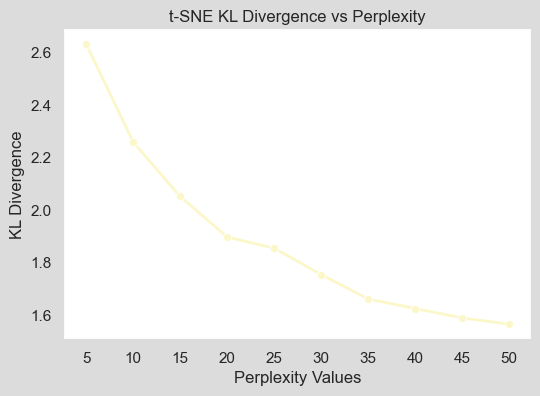

Optimum perplexity: 50 with divergence 1.5653


In [ ]:
opt_perplexity_ctf = find_optimum_perplexity(voc_ctf_df)

In [ ]:
y_cat_num = train_df['real_clusters']
# ARI_ctf, X_tsne_ctf, labels_ctf, fit_time_ctf  = calc_ari(ctf_transform, opt_perplexity_ctf) # ARI: 0.4532, Time: 6.02s for both random and pca inits
ARI_ctf, X_tsne_ctf, X_umap_ctf, labels_ctf, fit_time_ctf  = calc_ari(voc_ctf_df, opt_perplexity_ctf)
# model_results.append({'Model': 'Tf-idf', 'ARI': ARI_ctf, 'Fitting Time (s)': fit_time_ctf})
print('ARI :', ARI_ctf, 'Fitting Time (s):', fit_time_ctf)

ARI: 0.3963, Time: 14.03s
ARI : 0.3963 Fitting Time (s): 14.03


In [ ]:
voc_ctf_df.to_csv(save_path + '/'+ 'text_features_train_aug.csv')

#### 1.8.1.1-b - Without data augmentation

In [ ]:
ctf_no_aug = TfidfVectorizer(stop_words='english', max_df=0.95, min_df=1)

In [ ]:
train_df['text_str'] = train_df['corpus_bow_lem'].apply(lambda x: ' '.join(x) if isinstance(x, list) else str(x))
ctf_fit_no_aug = ctf_no_aug.fit(train_df['text_str'])

In [ ]:
ctf_transform_no_aug = ctf_no_aug.transform(train_df['text_str'])

In [ ]:
voc_ctf_no_aug = ctf_no_aug.get_feature_names_out()
voc_ctf_df_no_aug = pd.DataFrame(ctf_transform_no_aug.todense(), columns=voc_ctf_no_aug)
print(voc_ctf_df_no_aug.shape)
voc_ctf_df_no_aug.head()

(700, 2631)


aapno   aari  ability   abkl  abode  abroad  absorbency  absorbent  \
0 0.0000 0.0000   0.0000 0.0000 0.0000  0.0000      0.0000     0.0000   
1 0.0000 0.0000   0.2389 0.0000 0.0000  0.0000      0.0000     0.0000   
2 0.0000 0.0000   0.0000 0.0000 0.0000  0.0000      0.0000     0.0000   
3 0.0000 0.0000   0.0000 0.0000 0.0000  0.0000      0.0000     0.0000   
4 0.0000 0.0000   0.0000 0.0000 0.0000  0.0000      0.0000     0.0000   

   absorbing  abstract  accent  access  accessory  accident  accidental  \
0     0.0000    0.0000  0.0000  0.0000     0.0000    0.0000      0.0000   
1     0.0000    0.0000  0.0000  0.0000     0.0000    0.0000      0.0000   
2     0.0000    0.0000  0.0000  0.0000     0.0000    0.0000      0.0000   
3     0.0000    0.0000  0.0000  0.0000     0.0000    0.0000      0.0000   
4     0.0000    0.0000  0.0000  0.0000     0.0000    0.0000      0.0000   

   according   ache    aci   acid  actual   adaa  adapter  adaptor    add  \
0     0.0000 0.0000 0.0000 0.0000  0.0000 0.0000   0.0000   0.0000 0.0000   
1     0.0000 0.0000 0.0000 0.0000  0.0000 0.0000   0.0000   0.0000 0.0000   
2     0.0000 0.0000 0.0000 0.0000  0.0000 0.0000   0.0000   0.0000 0.0000   
3     0.0000 0.0000 0.0000 0.0000  0.0000 0.0000   0.0000   0.0000 0.0000   
4     0.0000 0.0000 0.0000 0.0000  0.0000 0.0000   0.0000   0.0000 0.0000   

   adding  addition  adhesive    adi  adidas  adjustable  admiration  admired  \
0  0.0000    0.0000    0.0000 0.0000  0.0000      0.0000      0.0000   0.0000   
1  0.0000    0.0000    0.0000 0.0000  0.0000      0.0000      0.0000   0.0000   
2  0.0000    0.0000    0.0000 0.5067  0.0000      0.0000      0.0000   0.0000   
3  0.0000    0.0000    0.0000 0.0000  0.0000      0.0000      0.0000   0.0000   
4  0.0000    0.0000    0.0000 0.0000  0.0000      0.0000      0.0000   0.0000   

   adorable  adorn  adorning   adsl   aero  affordable    age  agrasen  \
0    0.0000 0.0000    0.0000 0.0000 0.0000      0.0000 0.0000   0.0000   
1    0.0000 0.0000    0.0000 0.0000 0.0000      0.0000 0.0000   0.0000   
2    0.0000 0.0000    0.0000 0.0000 0.0000      0.0000 0.0000   0.0000   
3    0.0000 0.0000    0.0000 0.0000 0.0000      0.0000 0.0000   0.0000   
4    0.0000 0.0000    0.0000 0.0000 0.0000      0.0000 0.0000   0.0000   

   agromech    air  airtex  airtight  akada  akshaj   akup  alarm   aleo  \
0    0.0000 0.0000  0.0000    0.0000 0.0000  0.0000 0.0000 0.0000 0.0000   
1    0.0000 0.0000  0.0000    0.0000 0.0000  0.0000 0.0000 0.0000 0.0000   
2    0.0000 0.0000  0.0000    0.0000 0.0000  0.0000 0.0000 0.0000 0.0000   
3    0.0000 0.0000  0.0000    0.0000 0.0000  0.0000 0.0000 0.0000 0.0000   
4    0.0000 0.0000  0.0000    0.0000 0.0000  0.0000 0.0000 0.0000 0.0000   

   allin  allow  allowed  allowing  allows  alloy  alluring   ally  almond  \
0 0.0000 0.0000   0.0000    0.0000  0.0000 0.0000    0.0000 0.0000  0.0000   
1 0.0000 0.0000   0.0000    0.0000  0.0000 0.0000    0.0000 0.0000  0.0000   
2 0.0000 0.0000   0.0000    0.0000  0.0000 0.0000    0.0000 0.0000  0.0000   
3 0.0000 0.0000   0.0000    0.0000  0.0000 0.0000    0.0000 0.0000  0.0000   
4 0.0000 0.0000   0.0000    0.0000  0.0000 0.0000    0.0000 0.0000  0.0000   

   aloevera  alternative  alternatively  aluminium  amaze  amazed  amazing  \
0    0.0000       0.0000         0.0000     0.1618 0.0000  0.0000   0.0000   
1    0.0000       0.0000         0.0000     0.0933 0.0000  0.0000   0.0000   
2    0.0000       0.0000         0.0000     0.0000 0.0000  0.0000   0.0000   
3    0.0000       0.0000         0.0000     0.0000 0.0000  0.0000   0.0000   
4    0.0000       0.0000         0.0000     0.0000 0.0000  0.0000   0.0000   

   amazwh  america   amit  ammonia    amp  analog  andre  andriod  android  \
0  0.0000   0.0000 0.0000   0.0000 0.0000  0.0000 0.0000   0.0000   0.0000   
1  0.0000   0.0000 0.0000   0.0000 0.0000  0.0000 0.0000   0.0000   0.0000   
2  0.0000   0.0000 0.0000   0.0000 0.0000  0.0000 0.0000   0.0000   0.0000   
3  0.0000  

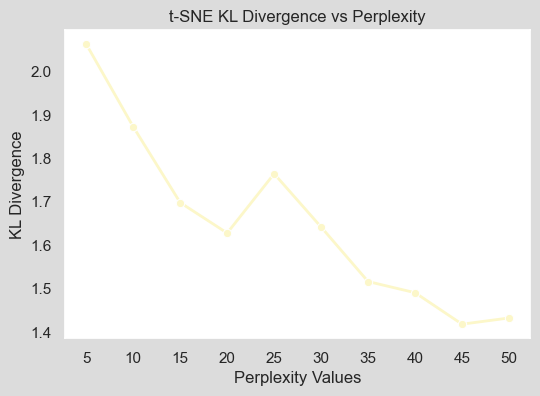

Optimum perplexity: 45 with divergence 1.4182


In [ ]:
opt_perplexity_ctf_no_aug = find_optimum_perplexity(voc_ctf_df_no_aug)

In [ ]:
y_cat_num = train_df['real_clusters']
# ARI_ctf, X_tsne_ctf, labels_ctf, fit_time_ctf  = calc_ari(ctf_transform, opt_perplexity_ctf) # ARI: 0.4532, Time: 6.02s for both random and pca inits
ARI_ctf_no_aug, X_tsne_ctf_no_aug, X_umap_ctf_no_aug, labels_ctf_no_aug, fit_time_ctf_no_aug  = calc_ari(voc_ctf_df_no_aug, opt_perplexity_ctf_no_aug)
# model_results.append({'Model': 'Tf-idf', 'ARI': ARI_ctf, 'Fitting Time (s)': fit_time_ctf})
print('ARI :', ARI_ctf_no_aug, 'Fitting Time (s):', fit_time_ctf_no_aug)

ARI: 0.3777, Time: 5.93s
ARI : 0.3777 Fitting Time (s): 5.93


In [ ]:
voc_ctf_df_no_aug.to_csv(save_path + '/'+ 'text_features_train_no_aug.csv')

#### 1.8.1.2 - Validation text data

#### 1.8.1.2-a - With data augmentation

In [ ]:
# use vectorizer fitted on augmented training data to ensure same number of features
ctf_val_transform = ctf_fit.transform(val_df['corpus_bow_lem'])
voc_ctf_val = ctf_fit.get_feature_names_out() # Use ctf_fit, not just ctf
voc_ctf_val_df = pd.DataFrame(ctf_val_transform.todense(), columns=voc_ctf_val, index=val_df.index)
print(voc_ctf_val_df.shape)
voc_ctf_val_df.head()

(175, 3559)


60     79  aapno   aari  ability  abject   abkl  abode  abroad  \
502 0.0000 0.0000 0.0000 0.0000   0.0000  0.0000 0.0000 0.0000  0.0000   
343 0.0000 0.0000 0.0000 0.0000   0.0000  0.0000 0.0000 0.0000  0.0000   
688 0.0000 0.0000 0.0000 0.0000   0.0000  0.0000 0.0000 0.0000  0.0000   
263 0.0000 0.0000 0.0000 0.0000   0.0000  0.0000 0.0000 0.0000  0.0000   
756 0.0000 0.0000 0.0000 0.0000   0.0000  0.0000 0.0000 0.0000  0.0000   

     absorbency  absorbent  absorber  absorbing  abstract  abstraction  \
502      0.0000     0.0000    0.0000     0.0000    0.0000       0.0000   
343      0.0000     0.0000    0.0000     0.0000    0.0000       0.0000   
688      0.0000     0.0000    0.0000     0.0000    0.0000       0.0000   
263      0.0000     0.0000    0.0000     0.0000    0.0000       0.0000   
756      0.0000     0.0000    0.0000     0.0000    0.0000       0.0000   

     abstractionist  abstruse  accent  access  accessory  accident  \
502          0.0000    0.0000  0.0000  0.0000     0.0000    0.0000   
343          0.0000    0.0000  0.0000  0.0000     0.0000    0.0000   
688          0.0000    0.0000  0.0000  0.0000     0.0000    0.0000   
263          0.0000    0.0000  0.0000  0.0000     0.0000    0.0000   
756          0.0000    0.0000  0.0000  0.0000     0.0000    0.0000   

     accidental  according    ace   ache    aci   acid  acquaintance  action  \
502      0.0000     0.0000 0.0000 0.0000 0.0000 0.0000        0.0000  0.0000   
343      0.0000     0.0000 0.0000 0.0000 0.0000 0.0000        0.0000  0.0000   
688      0.0000     0.0000 0.0000 0.0000 0.0000 0.0000        0.0000  0.0000   
263      0.0000     0.0000 0.0000 0.0000 0.0000 0.0000        0.0000  0.0000   
756      0.0000     0.0000 0.0000 0.0000 0.0000 0.0000        0.0000  0.0000   

     activity  actual   adaa  adapter  adaptor    add  adding  addition  \
502    0.0000  0.0000 0.0000   0.0000   0.0000 0.0000  0.0000    0.0000   
343    0.0000  0.0000 0.0000   0.0000   0.0000 0.0000  0.0000    0.0000   
688    0.0000  0.0000 0.0000   0.0000   0.0000 0.0000  0.0000    0.0000   
263    0.0000  0.0000 0.0000   0.0000   0.0000 0.0000  0.0000    0.0000   
756    0.0000  0.0000 0.0000   0.0000   0.0000 0.0000  0.0000    0.0000   

     adhesive    adi  adidas  adjust  adjustable  admiration  admired  \
502    0.0000 0.0000  0.0000  0.0000      0.0000      0.0000   0.0000   
343    0.0000 0.0000  0.0000  0.0000      0.0000      0.0000   0.0000   
688    0.0000 0.0000  0.0000  0.0000      0.0000      0.0000   0.0000   
263    0.0000 0.0000  0.0000  0.0000      0.0000      0.0000   0.0000   
756    0.0000 0.0000  0.0000  0.0000      0.0000      0.0000   0.0000   

     admirer  adorable  adorn  adorning   adsl   aero  affordable  afternoon  \
502   0.0000    0.0000 0.0000    0.0000 0.0000 0.0000      0.0000     0.0000   
343   0.0000    0.0000 0.0000    0.0000 0.0000 0.0000      0.0000     0.0000   
688   0.0000    0.0000 0.0000    0.0000 0.0000 0.0000      0.0000     0.0000   
263   0.0000    0.0000 0.0000    0.0000 0.0000 0.0000      0.0000     0.0000   
756   0.0000    0.0000 0.0000    0.0000 0.0000 0.0000      0.0000     0.0000   

       age  agency  agent  aggregation   agio  agrasen  agromech    aid  \
502 0.0000  0.0000 0.0000       0.0000 0.0000   0.0000    0.0000 0.0000   
343 0.0000  0.0000 0.0000       0.0000 0.0000   0.0000    0.0000 0.0000   
688 0.0000  0.0000 0.0000       0.0000 0.0000   0.0000    0.0000 0.0000   
263 0.0000  0.0000 0.0000       0.0000 0.0000   0.0000    0.0000 0.0000   
756 0.0000  0.0000 0.0000       0.0000 0.0000   0.0000    0.0000 0.0000   

       aim    air  airstream  airtex  airtight  akada  akshaj   akup     al  \
502 0.0000 0.0000     0.0000  0.0000    0.0000 0.0000  0.0000 0.0000 0.0000   
343 0.0000 0.0000     0.0000  0.0000    0.0000 0.0000  0.0000 0.0000 0.0000   
688 0.0000 0.0000     0.0000  0.0000    0.0000 0.0000  0.0000 0.0000 0.0000   
263 0.0000 0.0000     0.0000  0.0000    0.0000 0.0000  0.0000 0.0000 0.0000   

In [ ]:
voc_ctf_val_df.to_csv(save_path + '/'+'text_features_val_aug.csv')

#### 1.8.1.2-b - Without data augmentation

In [ ]:
# use vectorizer fitted on training data to ensure same number of features
ctf_val_transform_no_aug = ctf_fit_no_aug.transform(val_df['corpus_bow_lem'])
voc_ctf_val_no_aug = ctf_fit_no_aug.get_feature_names_out() # Use ctf_fit, not just ctf
voc_ctf_val_df_no_aug = pd.DataFrame(ctf_val_transform_no_aug.todense(), columns=voc_ctf_val_no_aug, index=val_df.index)
print(voc_ctf_val_df_no_aug.shape)
voc_ctf_val_df_no_aug.head()

(175, 2631)


aapno   aari  ability   abkl  abode  abroad  absorbency  absorbent  \
502 0.0000 0.0000   0.0000 0.0000 0.0000  0.0000      0.0000     0.0000   
343 0.0000 0.0000   0.0000 0.0000 0.0000  0.0000      0.0000     0.0000   
688 0.0000 0.0000   0.0000 0.0000 0.0000  0.0000      0.0000     0.0000   
263 0.0000 0.0000   0.0000 0.0000 0.0000  0.0000      0.0000     0.0000   
756 0.0000 0.0000   0.0000 0.0000 0.0000  0.0000      0.0000     0.0000   

     absorbing  abstract  accent  access  accessory  accident  accidental  \
502     0.0000    0.0000  0.0000  0.0000     0.0000    0.0000      0.0000   
343     0.0000    0.0000  0.0000  0.0000     0.0000    0.0000      0.0000   
688     0.0000    0.0000  0.0000  0.0000     0.0000    0.0000      0.0000   
263     0.0000    0.0000  0.0000  0.0000     0.0000    0.0000      0.0000   
756     0.0000    0.0000  0.0000  0.0000     0.0000    0.0000      0.0000   

     according   ache    aci   acid  actual   adaa  adapter  adaptor    add  \
502     0.0000 0.0000 0.0000 0.0000  0.0000 0.0000   0.0000   0.0000 0.0000   
343     0.0000 0.0000 0.0000 0.0000  0.0000 0.0000   0.0000   0.0000 0.0000   
688     0.0000 0.0000 0.0000 0.0000  0.0000 0.0000   0.0000   0.0000 0.0000   
263     0.0000 0.0000 0.0000 0.0000  0.0000 0.0000   0.0000   0.0000 0.0000   
756     0.0000 0.0000 0.0000 0.0000  0.0000 0.0000   0.0000   0.0000 0.0000   

     adding  addition  adhesive    adi  adidas  adjustable  admiration  \
502  0.0000    0.0000    0.0000 0.0000  0.0000      0.0000      0.0000   
343  0.0000    0.0000    0.0000 0.0000  0.0000      0.0000      0.0000   
688  0.0000    0.0000    0.0000 0.0000  0.0000      0.0000      0.0000   
263  0.0000    0.0000    0.0000 0.0000  0.0000      0.0000      0.0000   
756  0.0000    0.0000    0.0000 0.0000  0.0000      0.0000      0.0000   

     admired  adorable  adorn  adorning   adsl   aero  affordable    age  \
502   0.0000    0.0000 0.0000    0.0000 0.0000 0.0000      0.0000 0.0000   
343   0.0000    0.0000 0.0000    0.0000 0.0000 0.0000      0.0000 0.0000   
688   0.0000    0.0000 0.0000    0.0000 0.0000 0.0000      0.0000 0.0000   
263   0.0000    0.0000 0.0000    0.0000 0.0000 0.0000      0.0000 0.0000   
756   0.0000    0.0000 0.0000    0.0000 0.0000 0.0000      0.0000 0.0000   

     agrasen  agromech    air  airtex  airtight  akada  akshaj   akup  alarm  \
502   0.0000    0.0000 0.0000  0.0000    0.0000 0.0000  0.0000 0.0000 0.0000   
343   0.0000    0.0000 0.0000  0.0000    0.0000 0.0000  0.0000 0.0000 0.0000   
688   0.0000    0.0000 0.0000  0.0000    0.0000 0.0000  0.0000 0.0000 0.0000   
263   0.0000    0.0000 0.0000  0.0000    0.0000 0.0000  0.0000 0.0000 0.0000   
756   0.0000    0.0000 0.0000  0.0000    0.0000 0.0000  0.0000 0.0000 0.0000   

      aleo  allin  allow  allowed  allowing  allows  alloy  alluring   ally  \
502 0.0000 0.0000 0.0000   0.0000    0.0000  0.0000 0.0000    0.0000 0.0000   
343 0.0000 0.0000 0.0000   0.0000    0.0000  0.0000 0.0000    0.0000 0.0000   
688 0.0000 0.0000 0.0000   0.0000    0.0000  0.0000 0.0000    0.0000 0.0000   
263 0.0000 0.0000 0.0000   0.0000    0.0000  0.0000 0.0000    0.0000 0.0000   
756 0.0000 0.0000 0.0000   0.0000    0.0000  0.0000 0.0000    0.0000 0.0000   

     almond  aloevera  alternative  alternatively  aluminium  amaze  amazed  \
502  0.0000    0.0000       0.0000         0.0000     0.0000 0.0000  0.0000   
343  0.0000    0.0000       0.0000         0.0000     0.0000 0.0000  0.0000   
688  0.0000    0.0000       0.0000         0.0000     0.0000 0.0000  0.0000   
263  0.0000    0.0000       0.0000         0.0000     0.0000 0.0000  0.0000   
756  0.0000    0.0000       0.0000         0.0000     0.0000 0.0000  0.0000   

     amazing  amazwh  america   amit  ammonia    amp  analog  andre  andriod  \
502   0.0000  0.0000   0.0000 0.0000   0.0000 0.0000  0.2160 0.0000   0.0000   
343   0.0000  0.0000   0.0000 0.0000   0.0000 0.0000  0.0000 0.0000   0.0000   
688   0.0000  0.0000   0.0000 0.0000   0.00

In [ ]:
voc_ctf_val_df_no_aug.to_csv(save_path + '/'+'text_features_val_no_aug.csv')

#### 1.8.1.3 - Test text data

#### 1.8.1.3-a - With data augmentation

In [ ]:
# use vectorizer fitted on augmented training data to ensure same number of features
ctf_test_transform = ctf_fit.transform(test_df['corpus_bow_lem'])
voc_ctf_test = ctf_fit.get_feature_names_out()
voc_ctf_test_df = pd.DataFrame(ctf_test_transform.todense(), columns=voc_ctf_test, index=test_df.index)
print(voc_ctf_test_df.shape)
voc_ctf_test_df.head()

(175, 3559)


60     79  aapno   aari  ability  abject   abkl  abode  abroad  \
1028 0.0000 0.0000 0.0000 0.0000   0.0000  0.0000 0.0000 0.0000  0.0000   
628  0.0000 0.0000 0.0000 0.0000   0.0000  0.0000 0.0000 0.0000  0.0000   
465  0.0000 0.0000 0.0000 0.0000   0.0000  0.0000 0.0000 0.0000  0.0000   
1022 0.0000 0.0000 0.0000 0.0000   0.0000  0.0000 0.0000 0.0000  0.0000   
650  0.0000 0.0000 0.0000 0.0000   0.0000  0.0000 0.0000 0.0000  0.0000   

      absorbency  absorbent  absorber  absorbing  abstract  abstraction  \
1028      0.0000     0.0000    0.0000     0.0000    0.0000       0.0000   
628       0.0000     0.0000    0.0000     0.0000    0.0000       0.0000   
465       0.0000     0.0000    0.0000     0.0000    0.0000       0.0000   
1022      0.0000     0.0000    0.0000     0.0000    0.0000       0.0000   
650       0.0000     0.0000    0.0000     0.0000    0.0000       0.0000   

      abstractionist  abstruse  accent  access  accessory  accident  \
1028          0.0000    0.0000  0.0000  0.0000     0.0000    0.0000   
628           0.0000    0.0000  0.0000  0.0000     0.0000    0.0000   
465           0.0000    0.0000  0.0000  0.0000     0.0000    0.0000   
1022          0.0000    0.0000  0.0000  0.0000     0.0000    0.0000   
650           0.0000    0.0000  0.0000  0.0000     0.0000    0.0000   

      accidental  according    ace   ache    aci   acid  acquaintance  action  \
1028      0.0000     0.0000 0.0000 0.0000 0.0000 0.0000        0.0000  0.0000   
628       0.0000     0.0000 0.0000 0.0000 0.0000 0.0000        0.0000  0.0000   
465       0.0000     0.0000 0.0000 0.0000 0.0000 0.0000        0.0000  0.0000   
1022      0.0000     0.0000 0.0000 0.0000 0.0000 0.0000        0.0000  0.0000   
650       0.0000     0.0000 0.0000 0.0000 0.0000 0.0000        0.0000  0.0000   

      activity  actual   adaa  adapter  adaptor    add  adding  addition  \
1028    0.0000  0.0000 0.0000   0.0000   0.0000 0.0000  0.0000    0.0000   
628     0.0000  0.0000 0.0000   0.0000   0.0000 0.0688  0.0000    0.0000   
465     0.0000  0.0000 0.0000   0.0000   0.0000 0.0000  0.0000    0.0000   
1022    0.0000  0.0000 0.0000   0.0000   0.0000 0.0000  0.0000    0.0000   
650     0.0000  0.0000 0.0000   0.0000   0.0000 0.0000  0.0000    0.0000   

      adhesive    adi  adidas  adjust  adjustable  admiration  admired  \
1028    0.0000 0.0000  0.0000  0.0000      0.0000      0.0000   0.0000   
628     0.0000 0.0000  0.0000  0.0000      0.0000      0.0000   0.0000   
465     0.0000 0.0000  0.0000  0.0000      0.0000      0.0000   0.0000   
1022    0.0000 0.0000  0.0000  0.0000      0.0000      0.0000   0.0000   
650     0.0000 0.0000  0.0000  0.0000      0.0000      0.0000   0.0000   

      admirer  adorable  adorn  adorning   adsl   aero  affordable  afternoon  \
1028   0.0000    0.0000 0.0000    0.0000 0.0000 0.0000      0.0000     0.0000   
628    0.0000    0.0000 0.0000    0.0000 0.0000 0.0000      0.0000     0.0000   
465    0.0000    0.0000 0.0000    0.0000 0.0000 0.0000      0.0000     0.0000   
1022   0.0000    0.0000 0.0000    0.0000 0.0000 0.0000      0.0000     0.0000   
650    0.0000    0.0000 0.0000    0.0000 0.0000 0.0000      0.0000     0.0000   

        age  agency  agent  aggregation   agio  agrasen  agromech    aid  \
1028 0.0000  0.0000 0.0000       0.0000 0.0000   0.0000    0.0000 0.0000   
628  0.0000  0.0000 0.0000       0.0000 0.0000   0.0000    0.0000 0.0000   
465  0.0000  0.0000 0.0000       0.0000 0.0000   0.0000    0.0000 0.0000   
1022 0.0000  0.0000 0.0000       0.0000 0.0000   0.0000    0.0000 0.0000   
650  0.0000  0.0000 0.0000       0.0000 0.0000   0.0000    0.0000 0.0000   

        aim    air  airstream  airtex  airtight  akada  akshaj   akup     al  \
1028 0.0000 0.0000     0.0000  0.0000    0.0000 0.0000  0.0000 0.0000 0.0000   
628  0.0000 0.0000     0.0000  0.0000    0.0000 0.0000  0.0000 0.0000 0.0000   
465  0.0000 0.0000     0.0000  0.0000    0.0000 0.0000  0.0000 0.0000 0.0000   
1022 0.0000 0.0000     0.00

In [ ]:
voc_ctf_test_df.to_csv(save_path + '/'+'text_features_test_aug.csv')

#### 1.8.1.3-a - Without data augmentation

In [ ]:
# use vectorizer fitted on augmented training data to ensure same number of features
ctf_test_transform_no_aug = ctf_fit_no_aug.transform(test_df['corpus_bow_lem'])
voc_ctf_test_no_aug = ctf_fit_no_aug.get_feature_names_out()
voc_ctf_test_df_no_aug = pd.DataFrame(ctf_test_transform_no_aug.todense(), columns=voc_ctf_test_no_aug, index=test_df.index)
print(voc_ctf_test_df_no_aug.shape)
voc_ctf_test_df_no_aug.head()

(175, 2631)


aapno   aari  ability   abkl  abode  abroad  absorbency  absorbent  \
1028 0.0000 0.0000   0.0000 0.0000 0.0000  0.0000      0.0000     0.0000   
628  0.0000 0.0000   0.0000 0.0000 0.0000  0.0000      0.0000     0.0000   
465  0.0000 0.0000   0.0000 0.0000 0.0000  0.0000      0.0000     0.0000   
1022 0.0000 0.0000   0.0000 0.0000 0.0000  0.0000      0.0000     0.0000   
650  0.0000 0.0000   0.0000 0.0000 0.0000  0.0000      0.0000     0.0000   

      absorbing  abstract  accent  access  accessory  accident  accidental  \
1028     0.0000    0.0000  0.0000  0.0000     0.0000    0.0000      0.0000   
628      0.0000    0.0000  0.0000  0.0000     0.0000    0.0000      0.0000   
465      0.0000    0.0000  0.0000  0.0000     0.0000    0.0000      0.0000   
1022     0.0000    0.0000  0.0000  0.0000     0.0000    0.0000      0.0000   
650      0.0000    0.0000  0.0000  0.0000     0.0000    0.0000      0.0000   

      according   ache    aci   acid  actual   adaa  adapter  adaptor    add  \
1028     0.0000 0.0000 0.0000 0.0000  0.0000 0.0000   0.0000   0.0000 0.0000   
628      0.0000 0.0000 0.0000 0.0000  0.0000 0.0000   0.0000   0.0000 0.0690   
465      0.0000 0.0000 0.0000 0.0000  0.0000 0.0000   0.0000   0.0000 0.0000   
1022     0.0000 0.0000 0.0000 0.0000  0.0000 0.0000   0.0000   0.0000 0.0000   
650      0.0000 0.0000 0.0000 0.0000  0.0000 0.0000   0.0000   0.0000 0.0000   

      adding  addition  adhesive    adi  adidas  adjustable  admiration  \
1028  0.0000    0.0000    0.0000 0.0000  0.0000      0.0000      0.0000   
628   0.0000    0.0000    0.0000 0.0000  0.0000      0.0000      0.0000   
465   0.0000    0.0000    0.0000 0.0000  0.0000      0.0000      0.0000   
1022  0.0000    0.0000    0.0000 0.0000  0.0000      0.0000      0.0000   
650   0.0000    0.0000    0.0000 0.0000  0.0000      0.0000      0.0000   

      admired  adorable  adorn  adorning   adsl   aero  affordable    age  \
1028   0.0000    0.0000 0.0000    0.0000 0.0000 0.0000      0.0000 0.0000   
628    0.0000    0.0000 0.0000    0.0000 0.0000 0.0000      0.0000 0.0000   
465    0.0000    0.0000 0.0000    0.0000 0.0000 0.0000      0.0000 0.0000   
1022   0.0000    0.0000 0.0000    0.0000 0.0000 0.0000      0.0000 0.0000   
650    0.0000    0.0000 0.0000    0.0000 0.0000 0.0000      0.0000 0.0000   

      agrasen  agromech    air  airtex  airtight  akada  akshaj   akup  alarm  \
1028   0.0000    0.0000 0.0000  0.0000    0.0000 0.0000  0.0000 0.0000 0.0000   
628    0.0000    0.0000 0.0000  0.0000    0.0000 0.0000  0.0000 0.0000 0.0000   
465    0.0000    0.0000 0.0000  0.0000    0.0000 0.0000  0.0000 0.0000 0.0000   
1022   0.0000    0.0000 0.0000  0.0000    0.0000 0.0000  0.0000 0.0000 0.0000   
650    0.0000    0.0000 0.0000  0.0000    0.0000 0.0000  0.0000 0.0000 0.0000   

       aleo  allin  allow  allowed  allowing  allows  alloy  alluring   ally  \
1028 0.0000 0.0000 0.0000   0.0000    0.0000  0.0000 0.0000    0.0000 0.0000   
628  0.0000 0.0000 0.0000   0.0000    0.1061  0.0000 0.0000    0.0000 0.0000   
465  0.0000 0.0000 0.0000   0.0000    0.0000  0.0000 0.0000    0.0000 0.0000   
1022 0.0000 0.0000 0.0000   0.0000    0.0000  0.0000 0.0000    0.0000 0.0000   
650  0.0000 0.0000 0.0000   0.0000    0.0000  0.0000 0.0000    0.0000 0.0000   

      almond  aloevera  alternative  alternatively  aluminium  amaze  amazed  \
1028  0.0000    0.0000       0.0000         0.0000     0.0000 0.0000  0.0000   
628   0.0000    0.0000       0.0000         0.0000     0.3314 0.0000  0.0000   
465   0.0000    0.0000       0.0000         0.0000     0.0000 0.0000  0.0000   
1022  0.0000    0.0000       0.0000         0.0000     0.0000 0.0000  0.0000   
650   0.0000    0.0000       0.0000         0.0000     0.0000 0.0000  0.0000   

      amazing  amazwh  america   amit  ammonia    amp  analog  andre  andriod  \
1028   0.0000  0.0000   0.0000 0.0000   0.0000 0.0000  0.0000 0.0000   0.0000   
628    0.0000  0.0000   0.0000 0.0000   0.0000 0.0000  0.0000 0.0000   0.0

In [ ]:
voc_ctf_test_df_no_aug.to_csv(save_path + '/'+'text_features_test_no_aug.csv')

### 1.8.2 - Images - using ResNet50

#### 1.8.2.1 - Training image data

##### 1.8.2.1-a - Training image data with augmentation

In [ ]:
# Generate subsets only once - remove folder before re-generating
# save_image_subsets(image_path_aug, image_save_path + '/' + 'train_images_subsets_aug', val_test_df=train_df)

Found 700 images in set across 7 clusters.
Processed 450/700 images
Processed 225/700 images
Processed 175/700 images
Processed 800/700 images
Processed 1025/700 images
Processed 775/700 images
Processed 350/700 images
Processed 975/700 images
Processed 875/700 images
Processed 375/700 images
Processed 600/700 images
Processed 425/700 images
Processed 925/700 images
Processed 125/700 images
Processed 250/700 images
Processed 200/700 images
Processed 550/700 images
Processed 500/700 images
Processed 1000/700 images
Processed 950/700 images
Processed 100/700 images
Processed 50/700 images
Processed 750/700 images
Processed 700/700 images
Processed 900/700 images
Processed 725/700 images
Processed 825/700 images
Processed 75/700 images
Images saved to subfolders in: /content/drive/My Drive/Colab Notebooks/OCDS_P6/train_images_subsets_aug


In [ ]:
list_photos = [file for file in listdir(image_path_aug)]
print(len(list_photos))

700


In [ ]:
# Load ResNet50 pretrained on ImageNet, exclude top classification layer, use global average pooling
base_model_50 = ResNet50(weights='imagenet', include_top=False, pooling='avg')

# The model outputs a 2048-dimensional feature vector per image
model_50 = base_model_50

# print(model_50.summary())

94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 4s 0us/step


In [ ]:
temps_3 = time.time()

images_features_50 = []
i=0
for image_num in range(len(list_photos)) :
    if i%100 == 0 :
      print(f'progress : {i / len(list_photos) * 100:.2f} %')
    i +=1
    image = load_img(image_path_aug+'/'+list_photos[image_num], target_size=(224, 224))
    image = img_to_array(image)
    image = np.expand_dims(image, axis=0)

    image = preprocess_input(image)
    images_features_50.append(model_50.predict(image, verbose=0)[0])

    duration_3 = time.time() - temps_3
print("Features creation time with RN50 : ", "%15.2f" % duration_3, "secs")

images_features_50 = np.asarray(images_features_50)
images_features_50.shape

progress : 0.00 %
progress : 14.29 %
progress : 28.57 %
progress : 42.86 %
progress : 57.14 %
progress : 71.43 %
progress : 85.71 %
Features creation time with RN50 :            66.05 secs


(700, 2048)

In [ ]:
images_features_50 = pd.DataFrame(images_features_50)
images_features_50.to_csv(save_path +'/'+'image_features_train_aug.csv', index=False)

##### 1.8.2.1-b - Training image data without augmentation

In [ ]:
# Generate subsets only once - remove folder before re-generating
# save_image_subsets(image_path, image_save_path + '/' + 'train_images_subsets', val_test_df=train_df)

Found 700 images in set across 7 clusters.
Processed 450/700 images
Processed 225/700 images
Processed 175/700 images
Processed 800/700 images
Processed 1025/700 images
Processed 775/700 images
Processed 350/700 images
Processed 975/700 images
Processed 875/700 images
Processed 375/700 images
Processed 600/700 images
Processed 425/700 images
Processed 925/700 images
Processed 125/700 images
Processed 250/700 images
Processed 200/700 images
Processed 550/700 images
Processed 500/700 images
Processed 1000/700 images
Processed 950/700 images
Processed 100/700 images
Processed 50/700 images
Processed 750/700 images
Processed 700/700 images
Processed 900/700 images
Processed 725/700 images
Processed 825/700 images
Processed 75/700 images
Images saved to subfolders in: /content/drive/My Drive/Colab Notebooks/OCDS_P6/train_images_subsets


In [ ]:
train_df = pd.read_parquet(save_path + '/'+ 'train_df.gzip')
save_image_set(image_path, image_save_path + '/' + 'train_images', val_test_df=train_df)

Found 700 images in set.
Processed 0/700 images
Processed 25/700 images
Processed 50/700 images
Processed 75/700 images
Processed 100/700 images
Processed 125/700 images
Processed 150/700 images
Processed 175/700 images
Processed 200/700 images
Processed 225/700 images
Processed 250/700 images
Processed 275/700 images
Processed 300/700 images
Processed 325/700 images
Processed 350/700 images
Processed 375/700 images
Processed 400/700 images
Processed 425/700 images
Processed 450/700 images
Processed 475/700 images
Processed 500/700 images
Processed 525/700 images
Processed 550/700 images
Processed 575/700 images
Processed 600/700 images
Processed 625/700 images
Processed 650/700 images
Processed 675/700 images
Images saved to: /content/drive/My Drive/Colab Notebooks/OCDS_P6/train_images


In [ ]:
train_list_photos = [file for file in listdir(image_save_path + '/' + 'train_images')]
print(len(train_list_photos))

700


In [ ]:
# Load ResNet50 pretrained on ImageNet, exclude top classification layer, use global average pooling
base_model_50_train = ResNet50(weights='imagenet', include_top=False, pooling='avg')

# The model outputs a 2048-dimensional feature vector per image
model_50_train = base_model_50_train

# print(model_50_train.summary())

In [ ]:
temps_9 = time.time()

images_features_50_train = []
i=0
for image_num in range(len(train_list_photos)) :
    if i%25 == 0 :
      print(f'progress : {i / len(train_list_photos) * 100:.2f} %')
    i +=1
    image_train = load_img(image_save_path + '/' + 'train_images'+'/'+train_list_photos[image_num], target_size=(224, 224))
    image_train = img_to_array(image_train)
    image_train = np.expand_dims(image_train, axis=0)

    image_train = preprocess_input(image_train)
    images_features_50_train.append(model_50_train.predict(image_train, verbose=0)[0])

    duration_9 = time.time() - temps_9
print("train features creation time with RN50 : ", "%15.2f" % duration_9, "secs")

images_features_50_train = np.asarray(images_features_50_train)
images_features_50_train.shape

progress : 0.00 %
progress : 3.57 %
progress : 7.14 %
progress : 10.71 %
progress : 14.29 %
progress : 17.86 %
progress : 21.43 %
progress : 25.00 %
progress : 28.57 %
progress : 32.14 %
progress : 35.71 %
progress : 39.29 %
progress : 42.86 %
progress : 46.43 %
progress : 50.00 %
progress : 53.57 %
progress : 57.14 %
progress : 60.71 %
progress : 64.29 %
progress : 67.86 %
progress : 71.43 %
progress : 75.00 %
progress : 78.57 %
progress : 82.14 %
progress : 85.71 %
progress : 89.29 %
progress : 92.86 %
progress : 96.43 %
train features creation time with RN50 :            66.63 secs


(700, 2048)

In [ ]:
image_features_train = pd.DataFrame(images_features_50_train)
image_features_train.to_csv(save_path +'/'+'image_features_train_no_aug.csv', index=False)

#### 1.8.2.2 - Validation image data

In [ ]:
# Generate subsets only once - remove folder before re-generating
# save_image_subsets(save_path +'/' + 'val_images', save_path + '/' + 'val_images_subsets', val_test_df=val_df)

Found 175 images in set across 7 clusters.
Processed 275/175 images
Processed 475/175 images
Processed 575/175 images
Processed 400/175 images
Processed 300/175 images
Processed 25/175 images
Processed 675/175 images
Processed 850/175 images
Images saved to subfolders in: /content/drive/My Drive/Colab Notebooks/OCDS_P6/val_images_subsets


In [ ]:
# val_df = pd.read_parquet(save_path + '/'+'val_df.gzip')
save_image_set(image_path, image_save_path + '/' + 'val_images', val_test_df=val_df)

Found 175 images in set.
Processed 0/175 images
Processed 25/175 images
Processed 50/175 images
Processed 75/175 images
Processed 100/175 images
Processed 125/175 images
Processed 150/175 images
Images saved to: /content/drive/My Drive/Colab Notebooks/OCDS_P6/val_images


In [ ]:
val_list_photos = [file for file in listdir(image_save_path + '/' + 'val_images')]
print(len(val_list_photos))

175


In [ ]:
# Load ResNet50 pretrained on ImageNet, exclude top classification layer, use global average pooling
base_model_50_val = ResNet50(weights='imagenet', include_top=False, pooling='avg')

# The model outputs a 2048-dimensional feature vector per image
model_50_val = base_model_50_val

# print(model_50.summary())

In [ ]:
temps_5 = time.time()

images_features_50_val = []
i=0
for image_num in range(len(val_list_photos)) :
    if i%25 == 0 :
      print(f'progress : {i / len(val_list_photos) * 100:.2f} %')
    i +=1
    image_val = load_img(image_save_path + '/' + 'val_images'+'/'+val_list_photos[image_num], target_size=(224, 224))
    image_val = img_to_array(image_val)
    image_val = np.expand_dims(image_val, axis=0)

    image_val = preprocess_input(image_val)
    images_features_50_val.append(model_50_val.predict(image_val, verbose=0)[0])

    duration_5 = time.time() - temps_5
print("Val features creation time with RN50 : ", "%15.2f" % duration_5, "secs")

images_features_50_val = np.asarray(images_features_50_val)
images_features_50_val.shape

progress : 0.00 %
progress : 14.29 %
progress : 28.57 %
progress : 42.86 %
progress : 57.14 %
progress : 71.43 %
progress : 85.71 %
Val features creation time with RN50 :            17.95 secs


(175, 2048)

In [ ]:
image_features_val = pd.DataFrame(images_features_50_val)
image_features_val.to_csv(save_path +'/'+'image_features_val.csv', index=False)

#### 1.8.2.3 - Test image data

In [ ]:
# Generate subsets only once - remove folder before re-generating
# save_image_subsets(save_path +'/' + 'test_images', save_path + '/' + 'test_images_subsets', val_test_df=test_df)

Found 175 images in set across 7 clusters.
Processed 650/175 images
Processed 150/175 images
Processed 625/175 images
Processed 525/175 images
Processed 325/175 images
Processed 0/175 images
Images saved to subfolders in: /content/drive/My Drive/Colab Notebooks/OCDS_P6/test_images_subsets


In [ ]:
test_df = pd.read_parquet(save_path + '/'+'test_df.gzip')
save_image_set(image_path, image_save_path + '/' + 'test_images', val_test_df=test_df)

Found 175 images in set.
Processed 0/175 images
Processed 25/175 images
Processed 50/175 images
Processed 75/175 images
Processed 100/175 images
Processed 125/175 images
Processed 150/175 images
Images saved to: /content/drive/My Drive/Colab Notebooks/OCDS_P6/test_images


In [ ]:
test_list_photos = [file for file in listdir(image_save_path + '/' + 'test_images')]
print(len(test_list_photos))

175


In [ ]:
# Load ResNet50 pretrained on ImageNet, exclude top classification layer, use global average pooling
base_model_50_test = ResNet50(weights='imagenet', include_top=False, pooling='avg')

# The model outputs a 2048-dimensional feature vector per image
model_50_test = base_model_50_test

# print(model_50.summary())

In [ ]:
temps_7 = time.time()

images_features_50_test = []
i=0
for image_num in range(len(test_list_photos)) :
    if i%25 == 0 :
      print(f'progress : {i / len(test_list_photos) * 100:.2f} %')
    i +=1
    image_test = load_img(image_save_path + '/' + 'test_images'+'/'+test_list_photos[image_num], target_size=(224, 224))
    image_test = img_to_array(image_test)
    image_test = np.expand_dims(image_test, axis=0)

    image_test = preprocess_input(image_test)
    images_features_50_test.append(model_50_test.predict(image_test, verbose=0)[0])

    duration_7 = time.time() - temps_7
print("Test features creation time with RN50 : ", "%15.2f" % duration_7, "secs")

images_features_50_test = np.asarray(images_features_50_test)
images_features_50_test.shape

progress : 0.00 %
progress : 14.29 %
progress : 28.57 %
progress : 42.86 %
progress : 57.14 %
progress : 71.43 %
progress : 85.71 %
Test features creation time with RN50 :            17.95 secs


(175, 2048)

In [ ]:
image_features_test = pd.DataFrame(images_features_50_test)
image_features_test.to_csv(save_path +'/'+'image_features_test.csv', index=False)

### 1.8.3 - Merge text and image features

#### 1.8.3.1 - Training data

#### 1.8.3.1-a - With data augmentation

In [ ]:
train_df = pd.read_parquet(save_path + '/'+'train_df.gzip')
y_train = train_df['real_clusters']

In [ ]:
text_features_aug = pd.read_csv(save_path +'/' + 'text_features_train_aug.csv').drop(columns=['Unnamed: 0'])
print(text_features_aug.shape)
text_features_aug.head(1)

(700, 3559)


,60,79,aapno,aari,ability,abject,abkl,abode,abroad,absorbency,absorbent,absorber,absorbing,abstract,abstraction,abstractionist,abstruse,accent,access,accessory,accident,accidental,according,ace,ache,aci,acid,acquaintance,action,activity,actual,adaa,adapter,adaptor,add,adding,addition,adhesive,adi,adidas,adjust,adjustable,admiration,admired,admirer,adorable,adorn,adorning,adsl,aero,affordable,afternoon,age,agency,agent,aggregation,agio,agrasen,agromech,aid,aim,air,airstream,airtex,airtight,akada,akshaj,akup,al,alarm,aleo,alike,alkali,alleviate,allin,allow,allowed,allowing,allows,alloy,alluring,ally,almond,aloevera,alternative,alternatively,aluminium,aluminum,amaze,amazed,amazing,amazwh,ambit,america,amerind,amit,ammonia,amp,analog,analogue,ancestry,andre,andriod,android,angel,animal,anise,anjalika,anna,anniversary,anodised,anodize,answer,ant,antenna,anthill,anti,antique,antiqueshop,antrum,anymore,anyplace,apart,apartment,apex,apl,aplomb,apollo,app,apparel,appeal,appealing,appearance,appears,apple,application,applied,applique,apply,appreciate,approach,approx,approximate,arabian,arabic,arb,arbitrager,archies,area,aries,aristocratical,armani,army,arnavs,aroma,arranged,arrangement,arranger,arrant,array,arrest,arsalan,art,arthritis,artifact,artificial,artisan,artist,artistic,artpiece,arts,artwork,arugula,ascendance,ash,ashen,asia,aspect,assault,assemble,assembled,assembly,assistant,assorted,assure,assured,assuredness,ast,aster,asthma,astonishing,asus,atm,atmosphere,atomic,attach,attain,attend,attention,attire,attitude,attivo,attractive,attractively,attribute,au,audio,australia,australian,authentication,authenticity,auto,automated,automatic,avail,availability,avenue,average,avocado,avoid,awakened,away,awesome,babe,baby,babyoye,babywear,background,backing,backlight,backpack,backward,backwards,bacteria,bag,bain,balaji,balanced,ball,balm,balsam,band,bang,bangle,bank,bankura,bar,barbie,barcode,barrage,barrier,base,baseball,based,basic,basra,batch,bath,bathing,bathroom,bathtub,battery,bazaar,bazar,bdblue,bdoa,beaded,bean,bear,bearer,beat,beatify,beaut,beautiful,beautifull,beautifully,beautify,beauty,bed,bedchamber,bedroom,bedsheet,bedsheets,bee,beebay,beerbohm,behemoth,beige,bela,believe,believer,bell,bella,belly,belonging,belt,bendable,benefit,bengal,bergner,berlin,berry,berth,bestway,better,beverly,beyoutiful,bft,bhagavan,bhalaria,bharat,bharatcraft,bib,bible,big,bigkik,billfold,bird,birthday,bit,bite,bivalent,black,blackened,blackled,blackred,blade,blanching,blank,blanket,blast,bleach,bleached,bleak,blend,blk,block,blonde,bloom,blow,blue,blueprint,bluetooth,blush,bmli,bmly,bmw,board,bob,body,bodyguard,bodysuit,bodysuits,bold,boldness,bolster,bomber,bone,bong,bonk,bonsai,book,bootie,booty,border,bore,born,botanical,bottle,bottleful,bought,bowl,bowling,box,boxful,boxwood,boy,bpa,brain,brand,branded,branding,brass,bread,break,breakage,breathlessness,breeze,brick,bright,brightness,brilliance,brilliant,bring,brings,bristle,broadcast,broken,bronchitis,broom,brought,brown,browned,brownish,brush,bsf,btp,bubble,bucket,buckle,buddha,buddhism,buddhist,build,bulb,bully,bulwark,burn,burnt,burst,burt,business,businessman,butter,button,ca,cable,cactus,cadaver,caffeine,calamitous,calendered,calf,calfskin,caliber,called,caller,calm,camera,camerii,camp,cannon,canon,canonic,canvas,canvass,cap,capacitance,capacity,caper,capital,capri,car,carat,card,cardboard,care,cargo,carnal,carpentry,carpet,carry,carrying,cart,cartier,cartoon,cartridge,carve,carved,carving,case,casing,casotec,casserole,cast,casual,catarrh,catch,catchy,category,cater,catering,cause,caused,cavity,cedar,celebrated,cell,cellular,center,centimeter,centre,century,ceramic,ceremony,certain,certification,certified,cervix,chair,chakra,champaign,change,changer,changing,chaparral,chappin,char,character,characteristic,charge,charger,charles,charwoman,check,checker,checkered,checkout,cheeky,cheer,chef,chemical,chequer,cherry,chest,chhote,chicken,child,chinese,chinmay,chlorine,chocolate,choice,chomper

In [ ]:
image_features_aug = pd.read_csv(save_path +'/'+'image_features_train_aug.csv')
print(image_features_aug.shape)
image_features_aug.head(1)

(700, 2048)


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,318,319,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,358,359,360,361,362,363,364,365,366,367,368,369,370,371,372,373,374,375,376,377,378,379,380,381,382,383,384,385,386,387,388,389,390,391,392,393,394,395,396,397,398,399,400,401,402,403,404,405,406,407,408,409,410,411,412,413,414,415,416,417,418,419,420,421,422,423,424,425,426,427,428,429,430,431,432,433,434,435,436,437,438,439,440,441,442,443,444,445,446,447,448,449,450,451,452,453,454,455,456,457,458,459,460,461,462,463,464,465,466,467,468,469,470,471,472,473,474,475,476,477,478,479,480,481,482,483,484,485,486,487,488,489,490,491,492,493,494,495,496,497,498,499,500,501,502,503,504,505,506,507,508,509,510,511,512,513,514,515,516,517,518,519,520,521,522,523,524,525,526,527,528,529,530,531,532,533,534,535,536,537,538,539,540,541,542,543,544,545,546,547,548,549,550,551,552,553,554,555,556,557,558,559,560,561,562,563,564,565,566,567,568,569,570,571,572,573,574,575,576,577,578,579,580,581,582,583,584,585,586,587,588,589,590,591,592,593,594,595,596,597,598,599,600,601,602,603,604,605,606,607,608,609,610,611,612,613,614,615,616,617,618,619,620,621,622,623,624,625,626,627,628,629,630,631,632,633,634,635,636,637,638,639,640,641,642,643,644,645,646,647,648,649,650,651,652,653,654,655,656,657,658,659,660,661,662,663,664,665,666,667,668,669,670,671,672,673,674,675,676,677,678,679,680,681,682,683,684,685,686,687,688,689,690,691,692,693,694,695,696,697,698,699,700,701,702,703,704,705,706,707,708,709,710,711,712,713,714,715,716,717,718,719,720,721,722,723,724,725,726,727,728,729,730,731,732,733,734,735,736,737,738,739,740,741,742,743,744,745,746,747,748,749,750,751,752,753,754,755,756,757,758,759,760,761,762,763,764,765,766,767,768,769,770,771,772,773,774,775,776,777,778,779,780,781,782,783,784,785,786,787,788,789,790,791,792,793,794,795,796,797,798,799,800,801,802,803,804,805,806,807,808,809,810,811,812,813,814,815,816,817,818,819,820,821,822,823,824,825,826,827,828,829,830,831,832,833,834,835,836,837,838,839,840,841,842,843,844,845,846,847,848,849,850,851,852,853,854,855,856,857,858,859,860,861,862,863,864,865,866,867,868,869,870,871,872,873,874,875,876,877,878,879,880,881,882,883,884,885,886,887,888,889,890,891,892,893,894,895,896,897,898,899,900,901,902,903,904,905,906,907,908,909,910,911,912,913,914,915,916,917,918,919,920,921,922,923,924,925,926,927,928,929,930,931,932,933,934,935,936,937,938,939,940,941,942,943,944,945,946,947,948,949,950,951,952,953,954,955,956,957,958,959,960,961,962,963,964,965,966,967,968,969,970,971,972,973,974,975,976,977,978,979,980,981,982,983,984,985,986,987,988,989,990,991,992,993,994,995,996,997,998,999,1000,1001,1002,1003,1004,1005,1006,1007,1008,1009,1010,1011,1012,1013,1014,1015,1016,1017,1018,1019,1020,1021

In [ ]:
text_features_aug = text_features_aug.reset_index(drop=True)
image_features_aug = image_features_aug.reset_index(drop=True)

X_train_aug = pd.concat([text_features_aug, image_features_aug], axis=1)
print(X_train_aug.shape)
X_train_aug.to_csv(save_path +'/' + 'X_train_aug.csv', index=False)
X_train_aug.head(1)

(700, 5607)


60     79  aapno   aari  ability  abject   abkl  abode  abroad  \
0 0.0000 0.0000 0.0000 0.0000   0.0000  0.0000 0.0000 0.0000  0.0000   

   absorbency  absorbent  absorber  absorbing  abstract  abstraction  \
0      0.0000     0.0000    0.0000     0.0000    0.0000       0.0000   

   abstractionist  abstruse  accent  access  accessory  accident  accidental  \
0          0.0000    0.0000  0.0000  0.0000     0.0000    0.0000      0.0000   

   according    ace   ache    aci   acid  acquaintance  action  activity  \
0     0.0000 0.0000 0.0000 0.0000 0.0000        0.0000  0.0000    0.0000   

   actual   adaa  adapter  adaptor    add  adding  addition  adhesive    adi  \
0  0.0000 0.0000   0.0000   0.0000 0.0000  0.0000    0.0000    0.0000 0.0000   

   adidas  adjust  adjustable  admiration  admired  admirer  adorable  adorn  \
0  0.0000  0.0000      0.0000      0.0000   0.0000   0.0000    0.0000 0.0000   

   adorning   adsl   aero  affordable  afternoon    age  agency  agent  \
0    0.0000 0.0000 0.0000      0.0000     0.0000 0.0000  0.0000 0.0000   

   aggregation   agio  agrasen  agromech    aid    aim    air  airstream  \
0       0.0000 0.0000   0.0000    0.0000 0.0000 0.0000 0.0000     0.0000   

   airtex  airtight  akada  akshaj   akup     al  alarm   aleo  alike  alkali  \
0  0.0000    0.0000 0.0000  0.0000 0.0000 0.0000 0.0000 0.0000 0.0000  0.0000   

   alleviate  allin  allow  allowed  allowing  allows  alloy  alluring   ally  \
0     0.0000 0.0000 0.0000   0.0000    0.0000  0.0000 0.0000    0.0000 0.0000   

   almond  aloevera  alternative  alternatively  aluminium  aluminum  amaze  \
0  0.0000    0.0000       0.0000         0.0000     0.1698    0.0000 0.0000   

   amazed  amazing  amazwh  ambit  america  amerind   amit  ammonia    amp  \
0  0.0000   0.0000  0.0000 0.0000   0.0000   0.0000 0.0000   0.0000 0.0000   

   analog  analogue  ancestry  andre  andriod  android  angel  animal  anise  \
0  0.0000    0.0000    0.0000 0.0000   0.0000   0.0000 0.0000  0.0000 0.0000   

   anjalika   anna  anniversary  anodised  anodize  answer    ant  antenna  \
0    0.0000 0.0000       0.0000    0.0000   0.0000  0.0000 0.0000   0.0000   

   anthill   anti  antique  antiqueshop  antrum  anymore  anyplace  apart  \
0   0.0000 0.0000   0.0000       0.0000  0.0000   0.0000    0.0000 0.0000   

   apartment   apex    apl  aplomb  apollo    app  apparel  appeal  appealing  \
0     0.0000 0.0000 0.0000  0.0000  0.0000 0.0000   0.0000  0.0000     0.0000   

   appearance  appears  apple  application  applied  applique  apply  \
0      0.0000   0.0000 0.0000       0.0000   0.0000    0.0000 0.0000   

   appreciate  approach  approx  approximate  arabian  arabic    arb  \
0      0.0000    0.0000  0.0000       0.0000   0.0000  0.0000 0.0000   

   arbitrager  archies   area  aries  aristocratical  armani   army  arnavs  \
0      0.0000   0.0000 0.0000 0.0000          0.0000  0.0000 0.0000  0.0000   

   aroma  arranged  arrangement  arranger  arrant  array  arrest  arsalan  \
0 0.0000    0.0000       0.0000    0.0000  0.0000 0.0000  0.0000   0.0000   

     art  arthritis  artifact  artificial  artisan  artist  artistic  \
0 0.0000     0.0000    0.0000      0.0000   0.0000  0.0000    0.0000   

   artpiece   arts  artwork  arugula  ascendance    ash  ashen   asia  aspect  \
0    0.0000 0.0000   0.0000   0.0000      0.0000 0.0000 0.0000 0.0000  0.0000   

   assault  assemble  assembled  assembly  assistant  assorted  assure  \
0   0.0000    0.0000     0.0000    0.0000     0.0000    0.0000  0.0000   

   assured  assuredness    ast  aster  asthma  astonishing   asus    atm  \
0   0.0000       0.0000 0.0000 0.0000  0.0000       0.0000 0.0000 0.0000   

   atmosphere  atomic  attach  attain  attend  attention  attire  attitude  \
0      0.0000  0.0000  0.0000  0.0000  0.0000     0.0000  0.0000    0.1913   

   attivo  attractive  attractively  attribute     au  audio  australia  \
0  0.0000      0.0000        0.0000     0.0000 0.0000 

#### 1.8.3.1-b - Without data augmentation

In [ ]:
train_df = pd.read_parquet(save_path + '/'+'train_df.gzip')
y_train = train_df['real_clusters']

In [ ]:
text_features_no_aug = pd.read_csv(save_path +'/' + 'text_features_train_no_aug.csv').drop(columns=['Unnamed: 0'])
print(text_features_no_aug.shape)
text_features_no_aug.head(1)

(700, 2631)


,aapno,aari,ability,abkl,abode,abroad,absorbency,absorbent,absorbing,abstract,accent,access,accessory,accident,accidental,according,ache,aci,acid,actual,adaa,adapter,adaptor,add,adding,addition,adhesive,adi,adidas,adjustable,admiration,admired,adorable,adorn,adorning,adsl,aero,affordable,age,agrasen,agromech,air,airtex,airtight,akada,akshaj,akup,alarm,aleo,allin,allow,allowed,allowing,allows,alloy,alluring,ally,almond,aloevera,alternative,alternatively,aluminium,amaze,amazed,amazing,amazwh,america,amit,ammonia,amp,analog,andre,andriod,android,angel,animal,anise,anjalika,anna,anniversary,anodised,ant,antenna,anthill,anti,antique,antiqueshop,antrum,anymore,apart,apex,apl,apollo,app,apparel,appeal,appealing,appearance,appears,apple,application,applied,applique,apply,appreciate,approach,approx,arabian,arabic,arb,archies,area,aries,armani,arnavs,aroma,arranged,array,arsalan,art,arthritis,artifact,artificial,artisan,artist,artistic,artpiece,artwork,asia,aspect,assembled,assembly,assorted,assure,assured,ast,aster,asthma,astonishing,asus,atm,attach,attention,attitude,attivo,attractive,audio,australia,australian,authentication,authenticity,auto,automatic,availability,avenue,avocado,avoid,awakened,away,awesome,baby,babyoye,babywear,background,backing,backlight,backpack,bacteria,bag,bain,balaji,balanced,ball,balm,balsam,band,bangle,bank,bankura,bar,barbie,barcode,barrier,base,based,basic,basra,batch,bath,bathing,bathroom,battery,bazaar,bdblue,bdoa,beaded,bean,bear,beat,beautiful,beautifull,beautifully,beautify,beauty,bed,bedroom,bedsheet,bedsheets,bee,beebay,beige,bela,believe,believer,bell,bella,belonging,belt,bendable,benefit,bengal,bergner,berlin,bestway,better,beverage,beverly,beyoutiful,bft,bhagavan,bhalaria,bharatcraft,bib,big,bigkik,bird,birthday,bit,black,blackled,blackred,blade,blanket,blast,bleach,bleached,blend,blk,block,blonde,blue,bluetooth,blush,bmli,bmly,bmw,board,bob,body,bodysuit,bodysuits,bold,bolster,bomber,bone,bong,bonsai,book,bootie,booty,border,born,botanical,bottle,bought,bow,bowl,box,boy,bpa,branded,branding,brass,bread,break,breathlessness,breeze,brick,bright,brightness,brilliance,brilliant,bring,brings,bristle,broadcast,broken,bronchitis,broom,brought,brown,brush,bsf,btp,bubble,bucket,buckle,buddha,buddhism,buddhist,bulb,burn,burt,business,butter,button,cable,cactus,caffeine,calf,caliber,called,calm,camera,camerii,cannon,canon,canvas,cap,capacity,capri,car,carat,card,cardboard,care,cargo,carpentry,carpet,carry,carrying,cartier,cartoon,carved,carving,case,casing,casotec,casserole,cast,casual,catarrh,catchy,category,catering,caused,cedar,cell,center,century,ceramic,ceremony,certain,certification,certified,chair,chakra,change,changer,changing,chappin,character,characteristic,charge,charger,check,checkered,cheeky,cheer,chef,chemical,chest,chhote,chicken,child,chinese,chinmay,chlorine,choice,chompers,choose,chopra,chowkidar,christmas,chronograph,circuit,circulation,city,civil,claim,clasp,class,classic,classical,classification,classy,clay,clean,cleaned,cleaner,cleaning,cleansing,clear,clip,clock,closure,cloth,clothes,club,clublaptop,cm,cmgy,cmly,cmw,cmx,cnl,coast,coaster,coated,coating,cocoa,code,coffee,coffeebean,coin,cold,collagen,collar,collected,collection,colored,colorful,coloured,colourful,colouring,colur,combination,combo,comfort,comfortable,comfortably,comforter,comforting,common,compact,company,comparable,compare,compared,compartment,compatibility,compatibity,compatible,competitive,complement,complete,completely,compliance,compliment,component,composition,compromise,computer,concrete,condensing,condition,conditioner,conditioning,confidence,confirms,conform,conforms,confuse,connect,connectivity,connector,connects,conscious,consider,consistent,constitutes,construction,consultation,consumption,contact,contain,container,contains,contamination,contemporary,contender,content,continue,control,convenience,convenient,cook,cookart,cooker,cooking,cookware,cool,copper,cor,coral,cord,corded,core,corkscrew,corner,corporat

In [ ]:
image_features_train_no_aug = pd.read_csv(save_path +'/'+'image_features_train_no_aug.csv')
print(image_features_train_no_aug.shape)
image_features_train_no_aug.head(1)

(700, 2048)


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,318,319,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,358,359,360,361,362,363,364,365,366,367,368,369,370,371,372,373,374,375,376,377,378,379,380,381,382,383,384,385,386,387,388,389,390,391,392,393,394,395,396,397,398,399,400,401,402,403,404,405,406,407,408,409,410,411,412,413,414,415,416,417,418,419,420,421,422,423,424,425,426,427,428,429,430,431,432,433,434,435,436,437,438,439,440,441,442,443,444,445,446,447,448,449,450,451,452,453,454,455,456,457,458,459,460,461,462,463,464,465,466,467,468,469,470,471,472,473,474,475,476,477,478,479,480,481,482,483,484,485,486,487,488,489,490,491,492,493,494,495,496,497,498,499,500,501,502,503,504,505,506,507,508,509,510,511,512,513,514,515,516,517,518,519,520,521,522,523,524,525,526,527,528,529,530,531,532,533,534,535,536,537,538,539,540,541,542,543,544,545,546,547,548,549,550,551,552,553,554,555,556,557,558,559,560,561,562,563,564,565,566,567,568,569,570,571,572,573,574,575,576,577,578,579,580,581,582,583,584,585,586,587,588,589,590,591,592,593,594,595,596,597,598,599,600,601,602,603,604,605,606,607,608,609,610,611,612,613,614,615,616,617,618,619,620,621,622,623,624,625,626,627,628,629,630,631,632,633,634,635,636,637,638,639,640,641,642,643,644,645,646,647,648,649,650,651,652,653,654,655,656,657,658,659,660,661,662,663,664,665,666,667,668,669,670,671,672,673,674,675,676,677,678,679,680,681,682,683,684,685,686,687,688,689,690,691,692,693,694,695,696,697,698,699,700,701,702,703,704,705,706,707,708,709,710,711,712,713,714,715,716,717,718,719,720,721,722,723,724,725,726,727,728,729,730,731,732,733,734,735,736,737,738,739,740,741,742,743,744,745,746,747,748,749,750,751,752,753,754,755,756,757,758,759,760,761,762,763,764,765,766,767,768,769,770,771,772,773,774,775,776,777,778,779,780,781,782,783,784,785,786,787,788,789,790,791,792,793,794,795,796,797,798,799,800,801,802,803,804,805,806,807,808,809,810,811,812,813,814,815,816,817,818,819,820,821,822,823,824,825,826,827,828,829,830,831,832,833,834,835,836,837,838,839,840,841,842,843,844,845,846,847,848,849,850,851,852,853,854,855,856,857,858,859,860,861,862,863,864,865,866,867,868,869,870,871,872,873,874,875,876,877,878,879,880,881,882,883,884,885,886,887,888,889,890,891,892,893,894,895,896,897,898,899,900,901,902,903,904,905,906,907,908,909,910,911,912,913,914,915,916,917,918,919,920,921,922,923,924,925,926,927,928,929,930,931,932,933,934,935,936,937,938,939,940,941,942,943,944,945,946,947,948,949,950,951,952,953,954,955,956,957,958,959,960,961,962,963,964,965,966,967,968,969,970,971,972,973,974,975,976,977,978,979,980,981,982,983,984,985,986,987,988,989,990,991,992,993,994,995,996,997,998,999,1000,1001,1002,1003,1004,1005,1006,1007,1008,1009,1010,1011,1012,1013,1014,1015,1016,1017,1018,1019,1020,1021

In [ ]:
text_features_no_aug = text_features_no_aug.reset_index(drop=True)
image_features_no_aug = image_features_train_no_aug.reset_index(drop=True)

X_train_no_aug = pd.concat([text_features_no_aug, image_features_no_aug], axis=1)
print(X_train_no_aug.shape)
X_train_no_aug.to_csv(save_path +'/' + 'X_train_no_aug.csv', index=False)
X_train_no_aug.head(1)

(700, 4679)


aapno   aari  ability   abkl  abode  abroad  absorbency  absorbent  \
0 0.0000 0.0000   0.0000 0.0000 0.0000  0.0000      0.0000     0.0000   

   absorbing  abstract  accent  access  accessory  accident  accidental  \
0     0.0000    0.0000  0.0000  0.0000     0.0000    0.0000      0.0000   

   according   ache    aci   acid  actual   adaa  adapter  adaptor    add  \
0     0.0000 0.0000 0.0000 0.0000  0.0000 0.0000   0.0000   0.0000 0.0000   

   adding  addition  adhesive    adi  adidas  adjustable  admiration  admired  \
0  0.0000    0.0000    0.0000 0.0000  0.0000      0.0000      0.0000   0.0000   

   adorable  adorn  adorning   adsl   aero  affordable    age  agrasen  \
0    0.0000 0.0000    0.0000 0.0000 0.0000      0.0000 0.0000   0.0000   

   agromech    air  airtex  airtight  akada  akshaj   akup  alarm   aleo  \
0    0.0000 0.0000  0.0000    0.0000 0.0000  0.0000 0.0000 0.0000 0.0000   

   allin  allow  allowed  allowing  allows  alloy  alluring   ally  almond  \
0 0.0000 0.0000   0.0000    0.0000  0.0000 0.0000    0.0000 0.0000  0.0000   

   aloevera  alternative  alternatively  aluminium  amaze  amazed  amazing  \
0    0.0000       0.0000         0.0000     0.1618 0.0000  0.0000   0.0000   

   amazwh  america   amit  ammonia    amp  analog  andre  andriod  android  \
0  0.0000   0.0000 0.0000   0.0000 0.0000  0.0000 0.0000   0.0000   0.0000   

   angel  animal  anise  anjalika   anna  anniversary  anodised    ant  \
0 0.0000  0.0000 0.0000    0.0000 0.0000       0.0000    0.0000 0.0000   

   antenna  anthill   anti  antique  antiqueshop  antrum  anymore  apart  \
0   0.0000   0.0000 0.0000   0.0000       0.0000  0.0000   0.0000 0.0000   

    apex    apl  apollo    app  apparel  appeal  appealing  appearance  \
0 0.0000 0.0000  0.0000 0.0000   0.0000  0.0000     0.0000      0.0000   

   appears  apple  application  applied  applique  apply  appreciate  \
0   0.0000 0.0000       0.0000   0.0000    0.0000 0.0000      0.0000   

   approach  approx  arabian  arabic    arb  archies   area  aries  armani  \
0    0.0000  0.0000   0.0000  0.0000 0.0000   0.0000 0.0000 0.0000  0.0000   

   arnavs  aroma  arranged  array  arsalan    art  arthritis  artifact  \
0  0.0000 0.0000    0.0000 0.0000   0.0000 0.0000     0.0000    0.0000   

   artificial  artisan  artist  artistic  artpiece  artwork   asia  aspect  \
0      0.0000   0.0000  0.0000    0.0000    0.0000   0.0000 0.0000  0.0000   

   assembled  assembly  assorted  assure  assured    ast  aster  asthma  \
0     0.0000    0.0000    0.0000  0.0000   0.0000 0.0000 0.0000  0.0000   

   astonishing   asus    atm  attach  attention  attitude  attivo  attractive  \
0       0.0000 0.0000 0.0000  0.0000     0.0000    0.1863  0.0000      0.0000   

   audio  australia  australian  authentication  authenticity   auto  \
0 0.0000     0.0000      0.0000          0.0000        0.0000 0.0000   

   automatic  availability  avenue  avocado  avoid  awakened   away  awesome  \
0     0.0000        0.0000  0.0000   0.0000 0.0000    0.0000 0.0000   0.0000   

    baby  babyoye  babywear  background  backing  backlight  backpack  \
0 0.0000   0.0000    0.0000      0.0000   0.0000     0.0000    0.0000   

   bacteria    bag   bain  balaji  balanced   ball   balm  balsam   band  \
0    0.0000 0.0000 0.0000  0.0000    0.0000 0.0000 0.0000  0.0000 0.0000   

   bangle   bank  bankura    bar  barbie  barcode  barrier   base  based  \
0  0.0000 0.0000   0.0000 0.0000  0.0000   0.0000   0.0000 0.0000 0.0000   

   basic  basra  batch   bath  bathing  bathroom  battery  bazaar  bdblue  \
0 0.0000 0.0000 0.0000 0.0000   0.0000    0.0000   0.0000  0.0000  0.0000   

    bdoa  beaded   bean   bear   beat  beautiful  beautifull  beautifully  \
0 0.0000  0.0000 0.0000 0.0000 0.0000     0.0000      0.0000       0.0000   

   beautify  beauty    bed  bedroom  bedsheet  bedsheets    bee  beebay  \
0    0.0000  0.0000 0.0000   0.0000    0.0000     0.0000 0.0000  0.0000   

   beige   bela  beli

In [ ]:
train_df = pd.read_parquet(save_path + '/'+'train_df.gzip')
y_train = train_df['real_clusters']

#### 1.8.3.2 - Validation data

#### 1.8.3.2-a - With data augmentation

In [ ]:
val_df=pd.read_parquet(save_path + '/'+'val_df.gzip')
y_val = val_df['real_clusters']

In [ ]:
val_text_features_aug = pd.read_csv(save_path +'/' + 'text_features_val_aug.csv').drop(columns=['Unnamed: 0'])
print(val_text_features_aug.shape)
val_text_features_aug.head(1)

(175, 3559)


,60,79,aapno,aari,ability,abject,abkl,abode,abroad,absorbency,absorbent,absorber,absorbing,abstract,abstraction,abstractionist,abstruse,accent,access,accessory,accident,accidental,according,ace,ache,aci,acid,acquaintance,action,activity,actual,adaa,adapter,adaptor,add,adding,addition,adhesive,adi,adidas,adjust,adjustable,admiration,admired,admirer,adorable,adorn,adorning,adsl,aero,affordable,afternoon,age,agency,agent,aggregation,agio,agrasen,agromech,aid,aim,air,airstream,airtex,airtight,akada,akshaj,akup,al,alarm,aleo,alike,alkali,alleviate,allin,allow,allowed,allowing,allows,alloy,alluring,ally,almond,aloevera,alternative,alternatively,aluminium,aluminum,amaze,amazed,amazing,amazwh,ambit,america,amerind,amit,ammonia,amp,analog,analogue,ancestry,andre,andriod,android,angel,animal,anise,anjalika,anna,anniversary,anodised,anodize,answer,ant,antenna,anthill,anti,antique,antiqueshop,antrum,anymore,anyplace,apart,apartment,apex,apl,aplomb,apollo,app,apparel,appeal,appealing,appearance,appears,apple,application,applied,applique,apply,appreciate,approach,approx,approximate,arabian,arabic,arb,arbitrager,archies,area,aries,aristocratical,armani,army,arnavs,aroma,arranged,arrangement,arranger,arrant,array,arrest,arsalan,art,arthritis,artifact,artificial,artisan,artist,artistic,artpiece,arts,artwork,arugula,ascendance,ash,ashen,asia,aspect,assault,assemble,assembled,assembly,assistant,assorted,assure,assured,assuredness,ast,aster,asthma,astonishing,asus,atm,atmosphere,atomic,attach,attain,attend,attention,attire,attitude,attivo,attractive,attractively,attribute,au,audio,australia,australian,authentication,authenticity,auto,automated,automatic,avail,availability,avenue,average,avocado,avoid,awakened,away,awesome,babe,baby,babyoye,babywear,background,backing,backlight,backpack,backward,backwards,bacteria,bag,bain,balaji,balanced,ball,balm,balsam,band,bang,bangle,bank,bankura,bar,barbie,barcode,barrage,barrier,base,baseball,based,basic,basra,batch,bath,bathing,bathroom,bathtub,battery,bazaar,bazar,bdblue,bdoa,beaded,bean,bear,bearer,beat,beatify,beaut,beautiful,beautifull,beautifully,beautify,beauty,bed,bedchamber,bedroom,bedsheet,bedsheets,bee,beebay,beerbohm,behemoth,beige,bela,believe,believer,bell,bella,belly,belonging,belt,bendable,benefit,bengal,bergner,berlin,berry,berth,bestway,better,beverly,beyoutiful,bft,bhagavan,bhalaria,bharat,bharatcraft,bib,bible,big,bigkik,billfold,bird,birthday,bit,bite,bivalent,black,blackened,blackled,blackred,blade,blanching,blank,blanket,blast,bleach,bleached,bleak,blend,blk,block,blonde,bloom,blow,blue,blueprint,bluetooth,blush,bmli,bmly,bmw,board,bob,body,bodyguard,bodysuit,bodysuits,bold,boldness,bolster,bomber,bone,bong,bonk,bonsai,book,bootie,booty,border,bore,born,botanical,bottle,bottleful,bought,bowl,bowling,box,boxful,boxwood,boy,bpa,brain,brand,branded,branding,brass,bread,break,breakage,breathlessness,breeze,brick,bright,brightness,brilliance,brilliant,bring,brings,bristle,broadcast,broken,bronchitis,broom,brought,brown,browned,brownish,brush,bsf,btp,bubble,bucket,buckle,buddha,buddhism,buddhist,build,bulb,bully,bulwark,burn,burnt,burst,burt,business,businessman,butter,button,ca,cable,cactus,cadaver,caffeine,calamitous,calendered,calf,calfskin,caliber,called,caller,calm,camera,camerii,camp,cannon,canon,canonic,canvas,canvass,cap,capacitance,capacity,caper,capital,capri,car,carat,card,cardboard,care,cargo,carnal,carpentry,carpet,carry,carrying,cart,cartier,cartoon,cartridge,carve,carved,carving,case,casing,casotec,casserole,cast,casual,catarrh,catch,catchy,category,cater,catering,cause,caused,cavity,cedar,celebrated,cell,cellular,center,centimeter,centre,century,ceramic,ceremony,certain,certification,certified,cervix,chair,chakra,champaign,change,changer,changing,chaparral,chappin,char,character,characteristic,charge,charger,charles,charwoman,check,checker,checkered,checkout,cheeky,cheer,chef,chemical,chequer,cherry,chest,chhote,chicken,child,chinese,chinmay,chlorine,chocolate,choice,chomper

In [ ]:
image_features_val_aug = pd.read_csv(save_path +'/' + 'image_features_val.csv')
print(image_features_val.shape)
image_features_val.head(1)

(175, 2048)


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,318,319,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,358,359,360,361,362,363,364,365,366,367,368,369,370,371,372,373,374,375,376,377,378,379,380,381,382,383,384,385,386,387,388,389,390,391,392,393,394,395,396,397,398,399,400,401,402,403,404,405,406,407,408,409,410,411,412,413,414,415,416,417,418,419,420,421,422,423,424,425,426,427,428,429,430,431,432,433,434,435,436,437,438,439,440,441,442,443,444,445,446,447,448,449,450,451,452,453,454,455,456,457,458,459,460,461,462,463,464,465,466,467,468,469,470,471,472,473,474,475,476,477,478,479,480,481,482,483,484,485,486,487,488,489,490,491,492,493,494,495,496,497,498,499,500,501,502,503,504,505,506,507,508,509,510,511,512,513,514,515,516,517,518,519,520,521,522,523,524,525,526,527,528,529,530,531,532,533,534,535,536,537,538,539,540,541,542,543,544,545,546,547,548,549,550,551,552,553,554,555,556,557,558,559,560,561,562,563,564,565,566,567,568,569,570,571,572,573,574,575,576,577,578,579,580,581,582,583,584,585,586,587,588,589,590,591,592,593,594,595,596,597,598,599,600,601,602,603,604,605,606,607,608,609,610,611,612,613,614,615,616,617,618,619,620,621,622,623,624,625,626,627,628,629,630,631,632,633,634,635,636,637,638,639,640,641,642,643,644,645,646,647,648,649,650,651,652,653,654,655,656,657,658,659,660,661,662,663,664,665,666,667,668,669,670,671,672,673,674,675,676,677,678,679,680,681,682,683,684,685,686,687,688,689,690,691,692,693,694,695,696,697,698,699,700,701,702,703,704,705,706,707,708,709,710,711,712,713,714,715,716,717,718,719,720,721,722,723,724,725,726,727,728,729,730,731,732,733,734,735,736,737,738,739,740,741,742,743,744,745,746,747,748,749,750,751,752,753,754,755,756,757,758,759,760,761,762,763,764,765,766,767,768,769,770,771,772,773,774,775,776,777,778,779,780,781,782,783,784,785,786,787,788,789,790,791,792,793,794,795,796,797,798,799,800,801,802,803,804,805,806,807,808,809,810,811,812,813,814,815,816,817,818,819,820,821,822,823,824,825,826,827,828,829,830,831,832,833,834,835,836,837,838,839,840,841,842,843,844,845,846,847,848,849,850,851,852,853,854,855,856,857,858,859,860,861,862,863,864,865,866,867,868,869,870,871,872,873,874,875,876,877,878,879,880,881,882,883,884,885,886,887,888,889,890,891,892,893,894,895,896,897,898,899,900,901,902,903,904,905,906,907,908,909,910,911,912,913,914,915,916,917,918,919,920,921,922,923,924,925,926,927,928,929,930,931,932,933,934,935,936,937,938,939,940,941,942,943,944,945,946,947,948,949,950,951,952,953,954,955,956,957,958,959,960,961,962,963,964,965,966,967,968,969,970,971,972,973,974,975,976,977,978,979,980,981,982,983,984,985,986,987,988,989,990,991,992,993,994,995,996,997,998,999,1000,1001,1002,1003,1004,1005,1006,1007,1008,1009,1010,1011,1012,1013,1014,1015,1016,1017,1018,1019,1020,1021

In [ ]:
X_val_aug = pd.concat([val_text_features_aug, image_features_val], axis=1)
print(X_val_aug.shape)
X_val_aug.to_csv(save_path +'/' + 'X_val_aug.csv', index=False)

(175, 5607)


#### 1.8.3.2-b - Without data augmentation

In [ ]:
val_text_features_no_aug = pd.read_csv(save_path +'/' + 'text_features_val_no_aug.csv').drop(columns=['Unnamed: 0'])
print(val_text_features_no_aug.shape)
val_text_features_no_aug.head(1)

(175, 2631)


,aapno,aari,ability,abkl,abode,abroad,absorbency,absorbent,absorbing,abstract,accent,access,accessory,accident,accidental,according,ache,aci,acid,actual,adaa,adapter,adaptor,add,adding,addition,adhesive,adi,adidas,adjustable,admiration,admired,adorable,adorn,adorning,adsl,aero,affordable,age,agrasen,agromech,air,airtex,airtight,akada,akshaj,akup,alarm,aleo,allin,allow,allowed,allowing,allows,alloy,alluring,ally,almond,aloevera,alternative,alternatively,aluminium,amaze,amazed,amazing,amazwh,america,amit,ammonia,amp,analog,andre,andriod,android,angel,animal,anise,anjalika,anna,anniversary,anodised,ant,antenna,anthill,anti,antique,antiqueshop,antrum,anymore,apart,apex,apl,apollo,app,apparel,appeal,appealing,appearance,appears,apple,application,applied,applique,apply,appreciate,approach,approx,arabian,arabic,arb,archies,area,aries,armani,arnavs,aroma,arranged,array,arsalan,art,arthritis,artifact,artificial,artisan,artist,artistic,artpiece,artwork,asia,aspect,assembled,assembly,assorted,assure,assured,ast,aster,asthma,astonishing,asus,atm,attach,attention,attitude,attivo,attractive,audio,australia,australian,authentication,authenticity,auto,automatic,availability,avenue,avocado,avoid,awakened,away,awesome,baby,babyoye,babywear,background,backing,backlight,backpack,bacteria,bag,bain,balaji,balanced,ball,balm,balsam,band,bangle,bank,bankura,bar,barbie,barcode,barrier,base,based,basic,basra,batch,bath,bathing,bathroom,battery,bazaar,bdblue,bdoa,beaded,bean,bear,beat,beautiful,beautifull,beautifully,beautify,beauty,bed,bedroom,bedsheet,bedsheets,bee,beebay,beige,bela,believe,believer,bell,bella,belonging,belt,bendable,benefit,bengal,bergner,berlin,bestway,better,beverage,beverly,beyoutiful,bft,bhagavan,bhalaria,bharatcraft,bib,big,bigkik,bird,birthday,bit,black,blackled,blackred,blade,blanket,blast,bleach,bleached,blend,blk,block,blonde,blue,bluetooth,blush,bmli,bmly,bmw,board,bob,body,bodysuit,bodysuits,bold,bolster,bomber,bone,bong,bonsai,book,bootie,booty,border,born,botanical,bottle,bought,bow,bowl,box,boy,bpa,branded,branding,brass,bread,break,breathlessness,breeze,brick,bright,brightness,brilliance,brilliant,bring,brings,bristle,broadcast,broken,bronchitis,broom,brought,brown,brush,bsf,btp,bubble,bucket,buckle,buddha,buddhism,buddhist,bulb,burn,burt,business,butter,button,cable,cactus,caffeine,calf,caliber,called,calm,camera,camerii,cannon,canon,canvas,cap,capacity,capri,car,carat,card,cardboard,care,cargo,carpentry,carpet,carry,carrying,cartier,cartoon,carved,carving,case,casing,casotec,casserole,cast,casual,catarrh,catchy,category,catering,caused,cedar,cell,center,century,ceramic,ceremony,certain,certification,certified,chair,chakra,change,changer,changing,chappin,character,characteristic,charge,charger,check,checkered,cheeky,cheer,chef,chemical,chest,chhote,chicken,child,chinese,chinmay,chlorine,choice,chompers,choose,chopra,chowkidar,christmas,chronograph,circuit,circulation,city,civil,claim,clasp,class,classic,classical,classification,classy,clay,clean,cleaned,cleaner,cleaning,cleansing,clear,clip,clock,closure,cloth,clothes,club,clublaptop,cm,cmgy,cmly,cmw,cmx,cnl,coast,coaster,coated,coating,cocoa,code,coffee,coffeebean,coin,cold,collagen,collar,collected,collection,colored,colorful,coloured,colourful,colouring,colur,combination,combo,comfort,comfortable,comfortably,comforter,comforting,common,compact,company,comparable,compare,compared,compartment,compatibility,compatibity,compatible,competitive,complement,complete,completely,compliance,compliment,component,composition,compromise,computer,concrete,condensing,condition,conditioner,conditioning,confidence,confirms,conform,conforms,confuse,connect,connectivity,connector,connects,conscious,consider,consistent,constitutes,construction,consultation,consumption,contact,contain,container,contains,contamination,contemporary,contender,content,continue,control,convenience,convenient,cook,cookart,cooker,cooking,cookware,cool,copper,cor,coral,cord,corded,core,corkscrew,corner,corporat

In [ ]:
image_features_val_aug = pd.read_csv(save_path +'/' + 'image_features_val.csv')
print(image_features_val.shape)
image_features_val.head(1)

(175, 2048)


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,318,319,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,358,359,360,361,362,363,364,365,366,367,368,369,370,371,372,373,374,375,376,377,378,379,380,381,382,383,384,385,386,387,388,389,390,391,392,393,394,395,396,397,398,399,400,401,402,403,404,405,406,407,408,409,410,411,412,413,414,415,416,417,418,419,420,421,422,423,424,425,426,427,428,429,430,431,432,433,434,435,436,437,438,439,440,441,442,443,444,445,446,447,448,449,450,451,452,453,454,455,456,457,458,459,460,461,462,463,464,465,466,467,468,469,470,471,472,473,474,475,476,477,478,479,480,481,482,483,484,485,486,487,488,489,490,491,492,493,494,495,496,497,498,499,500,501,502,503,504,505,506,507,508,509,510,511,512,513,514,515,516,517,518,519,520,521,522,523,524,525,526,527,528,529,530,531,532,533,534,535,536,537,538,539,540,541,542,543,544,545,546,547,548,549,550,551,552,553,554,555,556,557,558,559,560,561,562,563,564,565,566,567,568,569,570,571,572,573,574,575,576,577,578,579,580,581,582,583,584,585,586,587,588,589,590,591,592,593,594,595,596,597,598,599,600,601,602,603,604,605,606,607,608,609,610,611,612,613,614,615,616,617,618,619,620,621,622,623,624,625,626,627,628,629,630,631,632,633,634,635,636,637,638,639,640,641,642,643,644,645,646,647,648,649,650,651,652,653,654,655,656,657,658,659,660,661,662,663,664,665,666,667,668,669,670,671,672,673,674,675,676,677,678,679,680,681,682,683,684,685,686,687,688,689,690,691,692,693,694,695,696,697,698,699,700,701,702,703,704,705,706,707,708,709,710,711,712,713,714,715,716,717,718,719,720,721,722,723,724,725,726,727,728,729,730,731,732,733,734,735,736,737,738,739,740,741,742,743,744,745,746,747,748,749,750,751,752,753,754,755,756,757,758,759,760,761,762,763,764,765,766,767,768,769,770,771,772,773,774,775,776,777,778,779,780,781,782,783,784,785,786,787,788,789,790,791,792,793,794,795,796,797,798,799,800,801,802,803,804,805,806,807,808,809,810,811,812,813,814,815,816,817,818,819,820,821,822,823,824,825,826,827,828,829,830,831,832,833,834,835,836,837,838,839,840,841,842,843,844,845,846,847,848,849,850,851,852,853,854,855,856,857,858,859,860,861,862,863,864,865,866,867,868,869,870,871,872,873,874,875,876,877,878,879,880,881,882,883,884,885,886,887,888,889,890,891,892,893,894,895,896,897,898,899,900,901,902,903,904,905,906,907,908,909,910,911,912,913,914,915,916,917,918,919,920,921,922,923,924,925,926,927,928,929,930,931,932,933,934,935,936,937,938,939,940,941,942,943,944,945,946,947,948,949,950,951,952,953,954,955,956,957,958,959,960,961,962,963,964,965,966,967,968,969,970,971,972,973,974,975,976,977,978,979,980,981,982,983,984,985,986,987,988,989,990,991,992,993,994,995,996,997,998,999,1000,1001,1002,1003,1004,1005,1006,1007,1008,1009,1010,1011,1012,1013,1014,1015,1016,1017,1018,1019,1020,1021

In [ ]:
X_val_no_aug = pd.concat([val_text_features_no_aug, image_features_val], axis=1)
print(X_val_no_aug.shape)
X_val_no_aug.to_csv(save_path +'/' + 'X_val_no_aug.csv', index=False)

(175, 4679)


#### 1.8.3.3 - Test data

#### 1.8.3.3-a - With data augmentation

In [ ]:
test_df=pd.read_parquet(save_path + '/'+'test_df.gzip')
y_test = test_df['real_clusters']

In [ ]:
test_text_features_aug = pd.read_csv(save_path +'/' + 'text_features_test_aug.csv').drop(columns=['Unnamed: 0'])
print(test_text_features_aug.shape)
test_text_features_aug.head(1)

(175, 3559)


,60,79,aapno,aari,ability,abject,abkl,abode,abroad,absorbency,absorbent,absorber,absorbing,abstract,abstraction,abstractionist,abstruse,accent,access,accessory,accident,accidental,according,ace,ache,aci,acid,acquaintance,action,activity,actual,adaa,adapter,adaptor,add,adding,addition,adhesive,adi,adidas,adjust,adjustable,admiration,admired,admirer,adorable,adorn,adorning,adsl,aero,affordable,afternoon,age,agency,agent,aggregation,agio,agrasen,agromech,aid,aim,air,airstream,airtex,airtight,akada,akshaj,akup,al,alarm,aleo,alike,alkali,alleviate,allin,allow,allowed,allowing,allows,alloy,alluring,ally,almond,aloevera,alternative,alternatively,aluminium,aluminum,amaze,amazed,amazing,amazwh,ambit,america,amerind,amit,ammonia,amp,analog,analogue,ancestry,andre,andriod,android,angel,animal,anise,anjalika,anna,anniversary,anodised,anodize,answer,ant,antenna,anthill,anti,antique,antiqueshop,antrum,anymore,anyplace,apart,apartment,apex,apl,aplomb,apollo,app,apparel,appeal,appealing,appearance,appears,apple,application,applied,applique,apply,appreciate,approach,approx,approximate,arabian,arabic,arb,arbitrager,archies,area,aries,aristocratical,armani,army,arnavs,aroma,arranged,arrangement,arranger,arrant,array,arrest,arsalan,art,arthritis,artifact,artificial,artisan,artist,artistic,artpiece,arts,artwork,arugula,ascendance,ash,ashen,asia,aspect,assault,assemble,assembled,assembly,assistant,assorted,assure,assured,assuredness,ast,aster,asthma,astonishing,asus,atm,atmosphere,atomic,attach,attain,attend,attention,attire,attitude,attivo,attractive,attractively,attribute,au,audio,australia,australian,authentication,authenticity,auto,automated,automatic,avail,availability,avenue,average,avocado,avoid,awakened,away,awesome,babe,baby,babyoye,babywear,background,backing,backlight,backpack,backward,backwards,bacteria,bag,bain,balaji,balanced,ball,balm,balsam,band,bang,bangle,bank,bankura,bar,barbie,barcode,barrage,barrier,base,baseball,based,basic,basra,batch,bath,bathing,bathroom,bathtub,battery,bazaar,bazar,bdblue,bdoa,beaded,bean,bear,bearer,beat,beatify,beaut,beautiful,beautifull,beautifully,beautify,beauty,bed,bedchamber,bedroom,bedsheet,bedsheets,bee,beebay,beerbohm,behemoth,beige,bela,believe,believer,bell,bella,belly,belonging,belt,bendable,benefit,bengal,bergner,berlin,berry,berth,bestway,better,beverly,beyoutiful,bft,bhagavan,bhalaria,bharat,bharatcraft,bib,bible,big,bigkik,billfold,bird,birthday,bit,bite,bivalent,black,blackened,blackled,blackred,blade,blanching,blank,blanket,blast,bleach,bleached,bleak,blend,blk,block,blonde,bloom,blow,blue,blueprint,bluetooth,blush,bmli,bmly,bmw,board,bob,body,bodyguard,bodysuit,bodysuits,bold,boldness,bolster,bomber,bone,bong,bonk,bonsai,book,bootie,booty,border,bore,born,botanical,bottle,bottleful,bought,bowl,bowling,box,boxful,boxwood,boy,bpa,brain,brand,branded,branding,brass,bread,break,breakage,breathlessness,breeze,brick,bright,brightness,brilliance,brilliant,bring,brings,bristle,broadcast,broken,bronchitis,broom,brought,brown,browned,brownish,brush,bsf,btp,bubble,bucket,buckle,buddha,buddhism,buddhist,build,bulb,bully,bulwark,burn,burnt,burst,burt,business,businessman,butter,button,ca,cable,cactus,cadaver,caffeine,calamitous,calendered,calf,calfskin,caliber,called,caller,calm,camera,camerii,camp,cannon,canon,canonic,canvas,canvass,cap,capacitance,capacity,caper,capital,capri,car,carat,card,cardboard,care,cargo,carnal,carpentry,carpet,carry,carrying,cart,cartier,cartoon,cartridge,carve,carved,carving,case,casing,casotec,casserole,cast,casual,catarrh,catch,catchy,category,cater,catering,cause,caused,cavity,cedar,celebrated,cell,cellular,center,centimeter,centre,century,ceramic,ceremony,certain,certification,certified,cervix,chair,chakra,champaign,change,changer,changing,chaparral,chappin,char,character,characteristic,charge,charger,charles,charwoman,check,checker,checkered,checkout,cheeky,cheer,chef,chemical,chequer,cherry,chest,chhote,chicken,child,chinese,chinmay,chlorine,chocolate,choice,chomper

In [ ]:
image_features_test = pd.read_csv(save_path +'/' + 'image_features_test.csv')
print(image_features_test.shape)
image_features_test.head(1)

(175, 2048)


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,318,319,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,358,359,360,361,362,363,364,365,366,367,368,369,370,371,372,373,374,375,376,377,378,379,380,381,382,383,384,385,386,387,388,389,390,391,392,393,394,395,396,397,398,399,400,401,402,403,404,405,406,407,408,409,410,411,412,413,414,415,416,417,418,419,420,421,422,423,424,425,426,427,428,429,430,431,432,433,434,435,436,437,438,439,440,441,442,443,444,445,446,447,448,449,450,451,452,453,454,455,456,457,458,459,460,461,462,463,464,465,466,467,468,469,470,471,472,473,474,475,476,477,478,479,480,481,482,483,484,485,486,487,488,489,490,491,492,493,494,495,496,497,498,499,500,501,502,503,504,505,506,507,508,509,510,511,512,513,514,515,516,517,518,519,520,521,522,523,524,525,526,527,528,529,530,531,532,533,534,535,536,537,538,539,540,541,542,543,544,545,546,547,548,549,550,551,552,553,554,555,556,557,558,559,560,561,562,563,564,565,566,567,568,569,570,571,572,573,574,575,576,577,578,579,580,581,582,583,584,585,586,587,588,589,590,591,592,593,594,595,596,597,598,599,600,601,602,603,604,605,606,607,608,609,610,611,612,613,614,615,616,617,618,619,620,621,622,623,624,625,626,627,628,629,630,631,632,633,634,635,636,637,638,639,640,641,642,643,644,645,646,647,648,649,650,651,652,653,654,655,656,657,658,659,660,661,662,663,664,665,666,667,668,669,670,671,672,673,674,675,676,677,678,679,680,681,682,683,684,685,686,687,688,689,690,691,692,693,694,695,696,697,698,699,700,701,702,703,704,705,706,707,708,709,710,711,712,713,714,715,716,717,718,719,720,721,722,723,724,725,726,727,728,729,730,731,732,733,734,735,736,737,738,739,740,741,742,743,744,745,746,747,748,749,750,751,752,753,754,755,756,757,758,759,760,761,762,763,764,765,766,767,768,769,770,771,772,773,774,775,776,777,778,779,780,781,782,783,784,785,786,787,788,789,790,791,792,793,794,795,796,797,798,799,800,801,802,803,804,805,806,807,808,809,810,811,812,813,814,815,816,817,818,819,820,821,822,823,824,825,826,827,828,829,830,831,832,833,834,835,836,837,838,839,840,841,842,843,844,845,846,847,848,849,850,851,852,853,854,855,856,857,858,859,860,861,862,863,864,865,866,867,868,869,870,871,872,873,874,875,876,877,878,879,880,881,882,883,884,885,886,887,888,889,890,891,892,893,894,895,896,897,898,899,900,901,902,903,904,905,906,907,908,909,910,911,912,913,914,915,916,917,918,919,920,921,922,923,924,925,926,927,928,929,930,931,932,933,934,935,936,937,938,939,940,941,942,943,944,945,946,947,948,949,950,951,952,953,954,955,956,957,958,959,960,961,962,963,964,965,966,967,968,969,970,971,972,973,974,975,976,977,978,979,980,981,982,983,984,985,986,987,988,989,990,991,992,993,994,995,996,997,998,999,1000,1001,1002,1003,1004,1005,1006,1007,1008,1009,1010,1011,1012,1013,1014,1015,1016,1017,1018,1019,1020,1021

In [ ]:
X_test_aug = pd.concat([test_text_features_aug, image_features_test], axis=1)
print(X_test_aug.shape)
X_test_aug.to_csv(save_path +'/' + 'X_test_aug.csv', index=False)

(175, 5607)


#### 1.8.3.3-b - Without data augmentation

In [ ]:
test_text_features_no_aug = pd.read_csv(save_path +'/' + 'text_features_test_no_aug.csv').drop(columns=['Unnamed: 0'])
print(test_text_features_no_aug.shape)
test_text_features_no_aug.head(1)

(175, 2631)


,aapno,aari,ability,abkl,abode,abroad,absorbency,absorbent,absorbing,abstract,accent,access,accessory,accident,accidental,according,ache,aci,acid,actual,adaa,adapter,adaptor,add,adding,addition,adhesive,adi,adidas,adjustable,admiration,admired,adorable,adorn,adorning,adsl,aero,affordable,age,agrasen,agromech,air,airtex,airtight,akada,akshaj,akup,alarm,aleo,allin,allow,allowed,allowing,allows,alloy,alluring,ally,almond,aloevera,alternative,alternatively,aluminium,amaze,amazed,amazing,amazwh,america,amit,ammonia,amp,analog,andre,andriod,android,angel,animal,anise,anjalika,anna,anniversary,anodised,ant,antenna,anthill,anti,antique,antiqueshop,antrum,anymore,apart,apex,apl,apollo,app,apparel,appeal,appealing,appearance,appears,apple,application,applied,applique,apply,appreciate,approach,approx,arabian,arabic,arb,archies,area,aries,armani,arnavs,aroma,arranged,array,arsalan,art,arthritis,artifact,artificial,artisan,artist,artistic,artpiece,artwork,asia,aspect,assembled,assembly,assorted,assure,assured,ast,aster,asthma,astonishing,asus,atm,attach,attention,attitude,attivo,attractive,audio,australia,australian,authentication,authenticity,auto,automatic,availability,avenue,avocado,avoid,awakened,away,awesome,baby,babyoye,babywear,background,backing,backlight,backpack,bacteria,bag,bain,balaji,balanced,ball,balm,balsam,band,bangle,bank,bankura,bar,barbie,barcode,barrier,base,based,basic,basra,batch,bath,bathing,bathroom,battery,bazaar,bdblue,bdoa,beaded,bean,bear,beat,beautiful,beautifull,beautifully,beautify,beauty,bed,bedroom,bedsheet,bedsheets,bee,beebay,beige,bela,believe,believer,bell,bella,belonging,belt,bendable,benefit,bengal,bergner,berlin,bestway,better,beverage,beverly,beyoutiful,bft,bhagavan,bhalaria,bharatcraft,bib,big,bigkik,bird,birthday,bit,black,blackled,blackred,blade,blanket,blast,bleach,bleached,blend,blk,block,blonde,blue,bluetooth,blush,bmli,bmly,bmw,board,bob,body,bodysuit,bodysuits,bold,bolster,bomber,bone,bong,bonsai,book,bootie,booty,border,born,botanical,bottle,bought,bow,bowl,box,boy,bpa,branded,branding,brass,bread,break,breathlessness,breeze,brick,bright,brightness,brilliance,brilliant,bring,brings,bristle,broadcast,broken,bronchitis,broom,brought,brown,brush,bsf,btp,bubble,bucket,buckle,buddha,buddhism,buddhist,bulb,burn,burt,business,butter,button,cable,cactus,caffeine,calf,caliber,called,calm,camera,camerii,cannon,canon,canvas,cap,capacity,capri,car,carat,card,cardboard,care,cargo,carpentry,carpet,carry,carrying,cartier,cartoon,carved,carving,case,casing,casotec,casserole,cast,casual,catarrh,catchy,category,catering,caused,cedar,cell,center,century,ceramic,ceremony,certain,certification,certified,chair,chakra,change,changer,changing,chappin,character,characteristic,charge,charger,check,checkered,cheeky,cheer,chef,chemical,chest,chhote,chicken,child,chinese,chinmay,chlorine,choice,chompers,choose,chopra,chowkidar,christmas,chronograph,circuit,circulation,city,civil,claim,clasp,class,classic,classical,classification,classy,clay,clean,cleaned,cleaner,cleaning,cleansing,clear,clip,clock,closure,cloth,clothes,club,clublaptop,cm,cmgy,cmly,cmw,cmx,cnl,coast,coaster,coated,coating,cocoa,code,coffee,coffeebean,coin,cold,collagen,collar,collected,collection,colored,colorful,coloured,colourful,colouring,colur,combination,combo,comfort,comfortable,comfortably,comforter,comforting,common,compact,company,comparable,compare,compared,compartment,compatibility,compatibity,compatible,competitive,complement,complete,completely,compliance,compliment,component,composition,compromise,computer,concrete,condensing,condition,conditioner,conditioning,confidence,confirms,conform,conforms,confuse,connect,connectivity,connector,connects,conscious,consider,consistent,constitutes,construction,consultation,consumption,contact,contain,container,contains,contamination,contemporary,contender,content,continue,control,convenience,convenient,cook,cookart,cooker,cooking,cookware,cool,copper,cor,coral,cord,corded,core,corkscrew,corner,corporat

In [ ]:
image_features_test = pd.read_csv(save_path +'/' + 'image_features_test.csv')
print(image_features_test.shape)
image_features_test.head(1)

(175, 2048)


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,318,319,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,358,359,360,361,362,363,364,365,366,367,368,369,370,371,372,373,374,375,376,377,378,379,380,381,382,383,384,385,386,387,388,389,390,391,392,393,394,395,396,397,398,399,400,401,402,403,404,405,406,407,408,409,410,411,412,413,414,415,416,417,418,419,420,421,422,423,424,425,426,427,428,429,430,431,432,433,434,435,436,437,438,439,440,441,442,443,444,445,446,447,448,449,450,451,452,453,454,455,456,457,458,459,460,461,462,463,464,465,466,467,468,469,470,471,472,473,474,475,476,477,478,479,480,481,482,483,484,485,486,487,488,489,490,491,492,493,494,495,496,497,498,499,500,501,502,503,504,505,506,507,508,509,510,511,512,513,514,515,516,517,518,519,520,521,522,523,524,525,526,527,528,529,530,531,532,533,534,535,536,537,538,539,540,541,542,543,544,545,546,547,548,549,550,551,552,553,554,555,556,557,558,559,560,561,562,563,564,565,566,567,568,569,570,571,572,573,574,575,576,577,578,579,580,581,582,583,584,585,586,587,588,589,590,591,592,593,594,595,596,597,598,599,600,601,602,603,604,605,606,607,608,609,610,611,612,613,614,615,616,617,618,619,620,621,622,623,624,625,626,627,628,629,630,631,632,633,634,635,636,637,638,639,640,641,642,643,644,645,646,647,648,649,650,651,652,653,654,655,656,657,658,659,660,661,662,663,664,665,666,667,668,669,670,671,672,673,674,675,676,677,678,679,680,681,682,683,684,685,686,687,688,689,690,691,692,693,694,695,696,697,698,699,700,701,702,703,704,705,706,707,708,709,710,711,712,713,714,715,716,717,718,719,720,721,722,723,724,725,726,727,728,729,730,731,732,733,734,735,736,737,738,739,740,741,742,743,744,745,746,747,748,749,750,751,752,753,754,755,756,757,758,759,760,761,762,763,764,765,766,767,768,769,770,771,772,773,774,775,776,777,778,779,780,781,782,783,784,785,786,787,788,789,790,791,792,793,794,795,796,797,798,799,800,801,802,803,804,805,806,807,808,809,810,811,812,813,814,815,816,817,818,819,820,821,822,823,824,825,826,827,828,829,830,831,832,833,834,835,836,837,838,839,840,841,842,843,844,845,846,847,848,849,850,851,852,853,854,855,856,857,858,859,860,861,862,863,864,865,866,867,868,869,870,871,872,873,874,875,876,877,878,879,880,881,882,883,884,885,886,887,888,889,890,891,892,893,894,895,896,897,898,899,900,901,902,903,904,905,906,907,908,909,910,911,912,913,914,915,916,917,918,919,920,921,922,923,924,925,926,927,928,929,930,931,932,933,934,935,936,937,938,939,940,941,942,943,944,945,946,947,948,949,950,951,952,953,954,955,956,957,958,959,960,961,962,963,964,965,966,967,968,969,970,971,972,973,974,975,976,977,978,979,980,981,982,983,984,985,986,987,988,989,990,991,992,993,994,995,996,997,998,999,1000,1001,1002,1003,1004,1005,1006,1007,1008,1009,1010,1011,1012,1013,1014,1015,1016,1017,1018,1019,1020,1021

In [ ]:
X_test_no_aug = pd.concat([test_text_features_no_aug, image_features_test], axis=1)
print(X_test_no_aug.shape)
X_test_no_aug.to_csv(save_path +'/' + 'X_test_no_aug.csv', index=False)

(175, 4679)


# 2 - Supervised classification - image data only

## 2.1 - Instanciate model

In [ ]:
def init_model():
    # Initialize ResNet50 base model
    model_init = ResNet50(include_top=False,
                         weights="imagenet",
                         input_shape=(224, 224, 3))  # Changed to ResNet50

    # Freeze all layers in base model
    for layer in model_init.layers:
        layer.trainable = False

    # Add custom top layers
    x = model_init.output
    x = GlobalAveragePooling2D()(x)
    x = Dense(256, activation='relu')(x)
    x = Dropout(0.5)(x)
    predictions = Dense(7, activation='softmax')(x)  # Keep final layer

    # Create full model
    model = Model(inputs=model_init.input, outputs=predictions)

    # Compile model (keeping original optimizer/loss)
    model.compile(loss="categorical_crossentropy",
                 optimizer='rmsprop',
                 metrics=['accuracy', tf.keras.metrics.F1Score(name='f1_macro', average='macro')])

    # print(model.summary())
    return model

In [ ]:
def init_model_aug():
    # Data augmentation
    data_augmentation = Sequential([
        RandomFlip("horizontal", input_shape=(224, 224, 3)),
        RandomRotation(0.1),
        RandomZoom(0.1),
        ])

    # Initialize ResNet50 base model
    model_init = ResNet50(include_top=False,
                         weights="imagenet",
                         input_shape=(224, 224, 3))

    # Freeze all layers in base model
    for layer in model_init.layers:
        layer.trainable = False

    # Add custom top layers, including data augmentation
    x = model_init.input
    x = data_augmentation(x)
    x = model_init(x)
    x = GlobalAveragePooling2D()(x)
    x = Dense(256, activation='relu')(x)
    x = Dropout(0.5)(x)
    predictions = Dense(7, activation='softmax')(x)

    # Create full model
    model = Model(inputs=model_init.input, outputs=predictions)

    # Compile model
    model.compile(loss="categorical_crossentropy",
                  optimizer='rmsprop',
                  metrics=['accuracy', tf.keras.metrics.F1Score(name='f1_macro', average='macro')])

    # print(model.summary())
    return model

In [ ]:
def train_and_evaluate_model(model_name, model, epochs, dataset_train, dataset_val, callbacks=None, verbose=0):
    if callbacks is None:
        callbacks = []  # Default is empty list

    if not any(isinstance(cb, EarlyStopping) for cb in callbacks):
        early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
        callbacks.append(early_stopping)
    else:
        early_stopping = [cb for cb in callbacks if isinstance(cb, EarlyStopping)][0]

    start_time = time.time()
    history = model.fit(dataset_train, epochs=epochs, validation_data=dataset_val, callbacks=callbacks, verbose=verbose)
    end_time = time.time()
    fit_time = end_time - start_time

    early_stopping_epoch = early_stopping.stopped_epoch + 1 if early_stopping.stopped_epoch is not None else len(history.history['loss'])

    y_true_val = []
    for _, labels in dataset_val:
        y_true_val.extend(np.argmax(labels.numpy(), axis=1))

    y_true_val = np.array(y_true_val)


    y_pred_val_probs = model.predict(dataset_val, verbose=verbose)

    y_pred_val = np.argmax(y_pred_val_probs, axis=1)


    val_accuracy = accuracy_score(y_true_val, y_pred_val)
    val_precision_macro = precision_score(y_true_val, y_pred_val, average='macro', zero_division=0)
    val_recall_macro = recall_score(y_true_val, y_pred_val, average='macro', zero_division=0)
    val_f1_macro_sklearn = f1_score(y_true_val, y_pred_val, average='macro', zero_division=0) # Recalculate with sklearn for consistency
    val_f2_macro = fbeta_score(y_true_val, y_pred_val, beta=2, average='macro', zero_division=0)


    train_acc_hist = history.history['accuracy'][-1]
    val_acc_hist = history.history['val_accuracy'][-1]
    train_f1_hist = history.history['f1_macro'][-1]
    val_f1_hist = history.history['val_f1_macro'][-1]


    model_data = {
        'model_name': model_name,
        'epochs_run': len(history.history['loss']),
        'early_stopping_epoch': early_stopping_epoch,
        'fit_time': fit_time,


        'Train Accuracy (Hist)': train_acc_hist,
        'Val Accuracy (Hist)': val_acc_hist,
        'Train f1_macro (Hist)': train_f1_hist,
        'Val f1_macro (Hist)': val_f1_hist,

        'Val Accuracy (Sklearn)': val_accuracy,
        'Val Precision (Sklearn)': val_precision_macro,
        'Val Recall (Sklearn)': val_recall_macro,
        'Val f1_macro (Sklearn)': val_f1_macro_sklearn,
        'Val f2_macro (Sklearn)': val_f2_macro
    }

    return model_data, history

## 2.2 - Import image sets

In [ ]:
batch_size = 32

def dataset_fct(path, validation_split=0, data_type=None) :
    dataset = tf.keras.utils.image_dataset_from_directory(
                    path, labels='inferred', label_mode='categorical',
                    class_names=None, batch_size=batch_size, image_size=(224, 224), shuffle=False,
                    seed=rs, validation_split=validation_split, subset=data_type
                    )
    return dataset

In [ ]:
dataset_train_aug = dataset_fct(path=save_path + '/' + 'train_images_subsets_aug', validation_split=0, data_type=None)

Found 700 files belonging to 7 classes.


In [ ]:
dataset_train = dataset_fct(path=save_path + '/' + 'train_images_subsets', validation_split=0, data_type=None)

Found 700 files belonging to 7 classes.


In [ ]:
dataset_val = dataset_fct(path=save_path + '/' + 'val_images_subsets', validation_split=0, data_type=None)

Found 175 files belonging to 7 classes.


In [ ]:
dataset_test = dataset_fct(path=save_path + '/' + 'test_images_subsets', validation_split=0, data_type=None)

Found 175 files belonging to 7 classes.


In [ ]:
dataset_train_val = dataset_fct(path=save_path + '/' + 'train_val_images_subsets', validation_split=0, data_type=None)

Found 875 files belonging to 7 classes.


In [ ]:
dataset_train_val_aug = dataset_fct(path=save_path + '/' + 'train_val_images_subsets_aug', validation_split=0, data_type=None)

Found 875 files belonging to 7 classes.


In [ ]:
dataset_train_val_ALL = dataset_fct(path=save_path + '/' + 'train_val_images_subsets_ALL', validation_split=0, data_type=None)

Found 1750 files belonging to 7 classes.


## 2.3 - Modelisation with external image augmentation

In [ ]:
# Create model
with tf.device('/gpu:0'):
    model_1 = init_model()

94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 4s 0us/step


In [ ]:
# Create callbacks
model_1_save_path = "./model_1_best_weights.h5"
checkpoint_1 = ModelCheckpoint(model_1_save_path, monitor='val_loss', verbose=1,
                             save_best_only=True, mode='min')
es_1 = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=5)
callbacks_list_1 = [checkpoint_1, es_1]

In [ ]:
print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))

Num GPUs Available:  1


In [ ]:
with tf.device('/gpu:0'):
    # Train model on augmented images & evaluate
    model_1_data, history_1 = train_and_evaluate_model('ResNet50 External Data Augmentation', model_1, epochs=50,
                                                     dataset_train=dataset_train_aug, dataset_val=dataset_val,
                                                     callbacks=callbacks_list_1)
    models_data.append(model_1_data)
    histories['model_1'] = history_1



Epoch 1: val_loss improved from inf to 4.20142, saving model to ./model_1_best_weights.h5

Epoch 2: val_loss improved from 4.20142 to 2.83131, saving model to ./model_1_best_weights.h5

Epoch 3: val_loss did not improve from 2.83131

Epoch 4: val_loss improved from 2.83131 to 2.72084, saving model to ./model_1_best_weights.h5

Epoch 5: val_loss improved from 2.72084 to 2.32152, saving model to ./model_1_best_weights.h5

Epoch 6: val_loss improved from 2.32152 to 2.07804, saving model to ./model_1_best_weights.h5

Epoch 7: val_loss did not improve from 2.07804

Epoch 8: val_loss did not improve from 2.07804

Epoch 9: val_loss did not improve from 2.07804

Epoch 10: val_loss did not improve from 2.07804

Epoch 11: val_loss did not improve from 2.07804
Epoch 11: early stopping


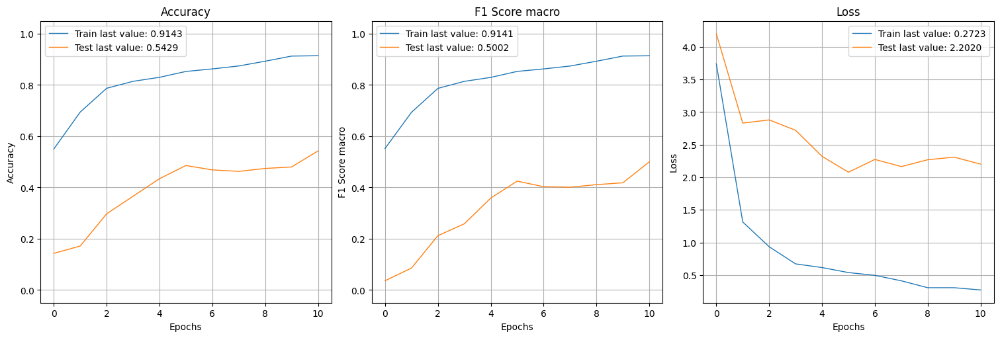

In [ ]:
show_history(histories['model_1'])
plot_history(histories['model_1'], path="save_path + '/' + ResNet50_augmented_data.png")
plt.close()

## 2.4 - Modelisation with integrated image augmentation

In [ ]:
# Create model
with tf.device('/gpu:0'):
    model_2 = init_model_aug()

In [ ]:
# Create callbacks
model_2_save_path = "./model_2_best_weights.h5"
checkpoint_2 = ModelCheckpoint(model_2_save_path, monitor='val_loss', verbose=1,
                             save_best_only=True, mode='min')
es_2 = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=5)
callbacks_list_2 = [checkpoint_2, es_2]

In [ ]:
print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))

Num GPUs Available:  1


In [ ]:
with tf.device('/gpu:0'):
    # Train model on original images & evaluate
    model_2_data, history_2 = train_and_evaluate_model('ResNet50 Integrated Data Augmentation', model_2, epochs=50,
                                                     dataset_train=dataset_train, dataset_val=dataset_val,
                                                     callbacks=callbacks_list_2)
    models_data.append(model_2_data)
    histories['model_2'] = history_2


Epoch 1: val_loss improved from inf to 3.31462, saving model to ./model_2_best_weights.h5

Epoch 2: val_loss did not improve from 3.31462

Epoch 3: val_loss improved from 3.31462 to 2.94449, saving model to ./model_2_best_weights.h5

Epoch 4: val_loss improved from 2.94449 to 2.57075, saving model to ./model_2_best_weights.h5

Epoch 5: val_loss improved from 2.57075 to 2.24926, saving model to ./model_2_best_weights.h5

Epoch 6: val_loss did not improve from 2.24926

Epoch 7: val_loss did not improve from 2.24926

Epoch 8: val_loss did not improve from 2.24926

Epoch 9: val_loss improved from 2.24926 to 2.24704, saving model to ./model_2_best_weights.h5

Epoch 10: val_loss improved from 2.24704 to 2.07996, saving model to ./model_2_best_weights.h5

Epoch 11: val_loss improved from 2.07996 to 2.01744, saving model to ./model_2_best_weights.h5

Epoch 12: val_loss did not improve from 2.01744

Epoch 13: val_loss improved from 2.01744 to 2.00408, saving model to ./model_2_best_weights.h5


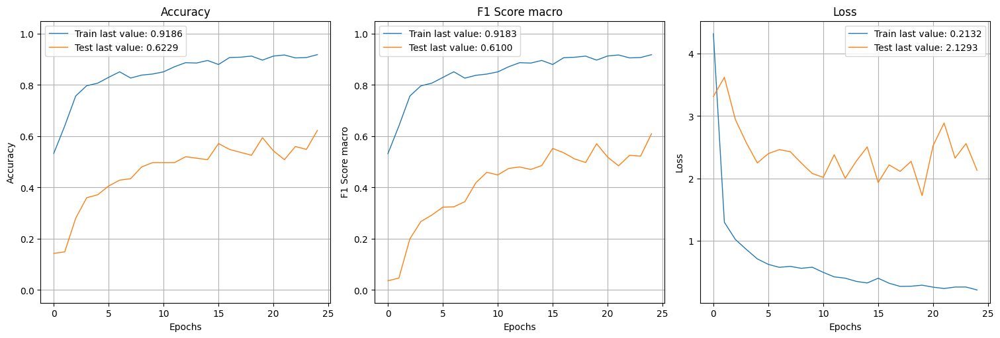

In [ ]:
show_history(histories['model_2'])
plot_history(histories['model_2'], path="save_path + '/' + ResNet50_integrated_augmentation.png")
plt.close()

## 2.5 - Modelisation without image augmentation

In [ ]:
# Create model
with tf.device('/gpu:0'):
    model_3 = init_model()

In [ ]:
model_3_save_path = "./model_3_best_weights.h5"
checkpoint_3 = ModelCheckpoint(model_3_save_path, monitor='val_loss', verbose=1,
                             save_best_only=True, mode='min')
es_3 = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=5)
callbacks_list_3 = [checkpoint_3, es_3]

In [ ]:
print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))

Num GPUs Available:  1


In [ ]:
with tf.device('/gpu:0'):
    # Train model on original images & evaluate
    model_3_data, history_3 = train_and_evaluate_model('ResNet50 Original Data', model_3, epochs=50,
                                                     dataset_train=dataset_train, dataset_val=dataset_val,
                                                     callbacks=callbacks_list_3)
    models_data.append(model_3_data)
    histories['model_3'] = history_3


Epoch 1: val_loss did not improve from 1.68565

Epoch 2: val_loss did not improve from 1.68565

Epoch 3: val_loss did not improve from 1.68565

Epoch 4: val_loss did not improve from 1.68565

Epoch 5: val_loss did not improve from 1.68565

Epoch 6: val_loss did not improve from 1.68565

Epoch 7: val_loss did not improve from 1.68565

Epoch 8: val_loss did not improve from 1.68565

Epoch 9: val_loss did not improve from 1.68565

Epoch 10: val_loss did not improve from 1.68565

Epoch 11: val_loss did not improve from 1.68565
Epoch 11: early stopping


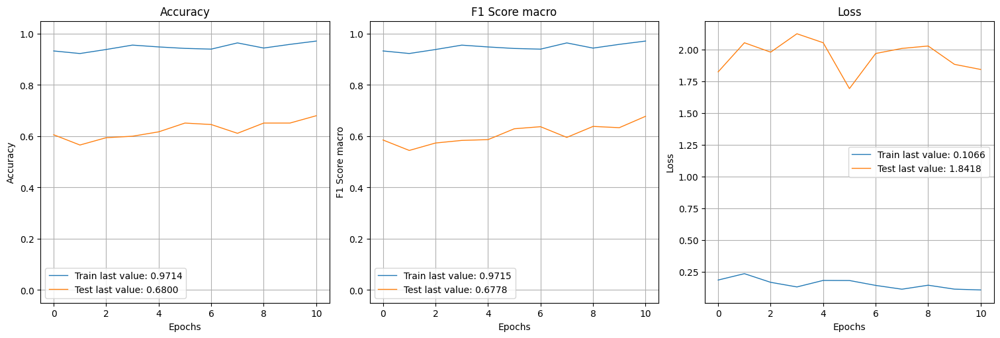

In [ ]:
show_history(histories['model_3'])
plot_history(histories['model_3'], path="save_path + '/' + ResNet50_original_data.png")
plt.close()

## 2.6 - Modelisation on Train + Val sets

In [ ]:
# Create model
with tf.device('/gpu:0'):
    model_4 = init_model()

In [ ]:
model_4_save_path = "./model_4_best_weights.h5"
checkpoint_4 = ModelCheckpoint(model_4_save_path, monitor='val_loss', verbose=1,
                             save_best_only=True, mode='min')
es_4 = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=5)
callbacks_list_4 = [checkpoint_4, es_4]

In [ ]:
print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))

Num GPUs Available:  1


In [ ]:
with tf.device('/gpu:0'):
    # Train model on original images & evaluate
    model_4_data, history_4 = train_and_evaluate_model('ResNet50 Original Data Train + Val', model_4, epochs=50,
                                                     dataset_train=dataset_train_val, dataset_val=dataset_test,
                                                     callbacks=callbacks_list_4)
    models_data.append(model_4_data)
    histories['model_4'] = history_4


Epoch 1: val_loss improved from inf to 5.40883, saving model to ./model_4_best_weights.h5

Epoch 2: val_loss improved from 5.40883 to 3.93021, saving model to ./model_4_best_weights.h5

Epoch 3: val_loss improved from 3.93021 to 3.57572, saving model to ./model_4_best_weights.h5

Epoch 4: val_loss improved from 3.57572 to 2.64239, saving model to ./model_4_best_weights.h5

Epoch 5: val_loss did not improve from 2.64239

Epoch 6: val_loss improved from 2.64239 to 2.20580, saving model to ./model_4_best_weights.h5

Epoch 7: val_loss improved from 2.20580 to 1.95765, saving model to ./model_4_best_weights.h5

Epoch 8: val_loss did not improve from 1.95765

Epoch 9: val_loss did not improve from 1.95765

Epoch 10: val_loss improved from 1.95765 to 1.74811, saving model to ./model_4_best_weights.h5

Epoch 11: val_loss did not improve from 1.74811

Epoch 12: val_loss improved from 1.74811 to 1.48972, saving model to ./model_4_best_weights.h5

Epoch 13: val_loss did not improve from 1.48972


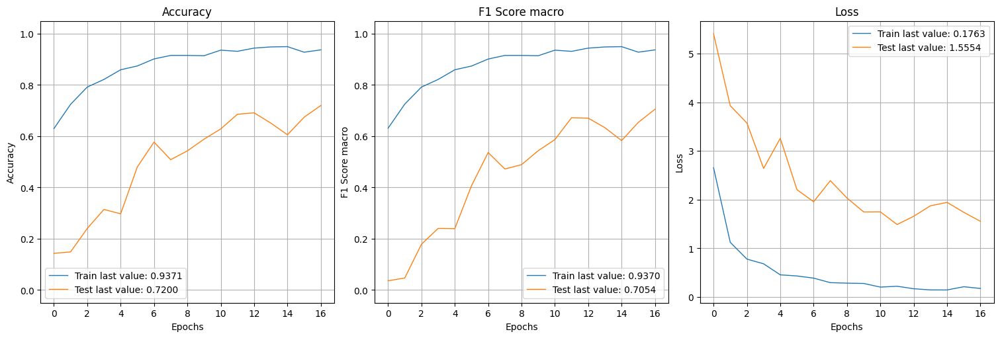

In [ ]:
show_history(histories['model_4'])
plot_history(histories['model_4'], path="save_path + '/' + ResNet50_original_train&val_data.png")
plt.close()

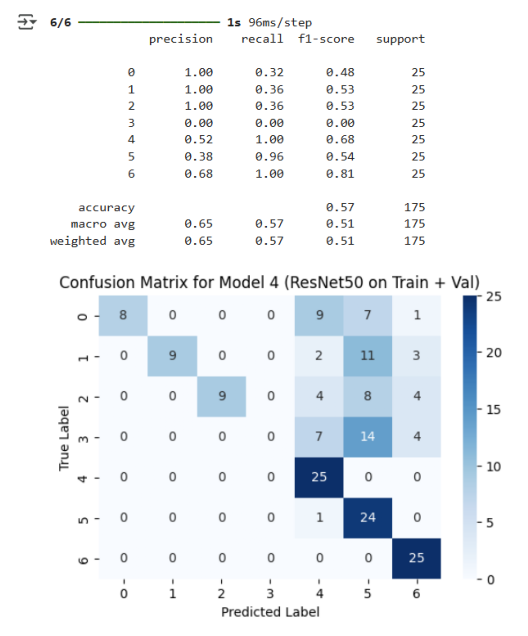

In [ ]:
y_pred_test_probs = model_4.predict(dataset_test)
y_pred_test = np.argmax(y_pred_test_probs, axis=1)

y_true_test = []
for _, labels in dataset_test:
  y_true_test.extend(np.argmax(labels.numpy(), axis=1))
y_true_test = np.array(y_true_test)

print(classification_report(y_true_test, y_pred_test))

cm = confusion_matrix(y_true_test, y_pred_test)

class_names = dataset_test.class_names

plt.figure(figsize=(6,4))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix for Model 4 (ResNet50 on Train + Val)')
plt.savefig(save_path + '/' + 'confusion_matrix_model_4.png')
plt.show()

## 2.7 - Modelisation on train + val sets augmented

In [ ]:
# Create model
with tf.device('/gpu:0'):
    model_5 = init_model()

In [ ]:
model_5_save_path = "./model_5_best_weights.h5"
checkpoint_5 = ModelCheckpoint(model_5_save_path, monitor='val_loss', verbose=1,
                             save_best_only=True, mode='min')
es_5 = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=5)
callbacks_list_5 = [checkpoint_5, es_5]

In [ ]:
print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))

Num GPUs Available:  1


In [ ]:
with tf.device('/gpu:0'):
    # Train model on original images & evaluate
    model_5_data, history_5 = train_and_evaluate_model('ResNet50 Augmented Data Train + Val', model_5, epochs=50,
                                                     dataset_train=dataset_train_val_aug, dataset_val=dataset_test,
                                                     callbacks=callbacks_list_5)
    models_data.append(model_5_data)
    histories['model_5'] = history_5


Epoch 1: val_loss improved from inf to 4.21019, saving model to ./model_5_best_weights.h5

Epoch 2: val_loss improved from 4.21019 to 3.33827, saving model to ./model_5_best_weights.h5

Epoch 3: val_loss improved from 3.33827 to 2.04769, saving model to ./model_5_best_weights.h5

Epoch 4: val_loss improved from 2.04769 to 1.97927, saving model to ./model_5_best_weights.h5

Epoch 5: val_loss did not improve from 1.97927

Epoch 6: val_loss improved from 1.97927 to 1.73417, saving model to ./model_5_best_weights.h5

Epoch 7: val_loss did not improve from 1.73417

Epoch 8: val_loss did not improve from 1.73417

Epoch 9: val_loss did not improve from 1.73417

Epoch 10: val_loss did not improve from 1.73417

Epoch 11: val_loss did not improve from 1.73417
Epoch 11: early stopping


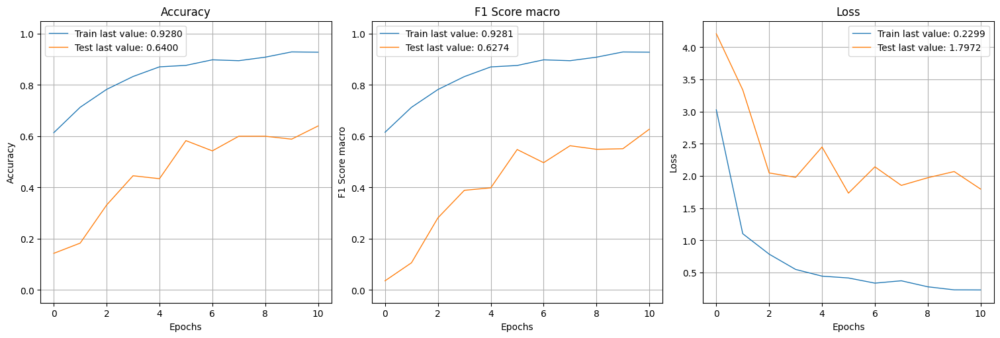

In [ ]:
show_history(histories['model_5'])
plot_history(histories['model_5'], path="save_path + '/' + ResNet50_aug_train&val_data.png")
plt.close()

## 2.8 - Modelisation on train + val sets & their augmentations

In [ ]:
# Create model
with tf.device('/gpu:0'):
    model_6 = init_model()

In [ ]:
model_6_save_path = "./model_6_best_weights.h5"
checkpoint_6 = ModelCheckpoint(model_6_save_path, monitor='val_loss', verbose=1,
                             save_best_only=True, mode='min')
es_6 = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=5)
callbacks_list_6 = [checkpoint_6, es_6]

In [ ]:
print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))

Num GPUs Available:  1


In [ ]:
with tf.device('/gpu:0'):
    # Train model on original images & evaluate
    model_6_data, history_6 = train_and_evaluate_model('ResNet50 Original + Augmented Data Train & Val', model_6, epochs=50,
                                                     dataset_train=dataset_train_val_ALL, dataset_val=dataset_test,
                                                     callbacks=callbacks_list_6)
    models_data.append(model_6_data)
    histories['model_6'] = history_6


Epoch 1: val_loss did not improve from 4.01921

Epoch 2: val_loss did not improve from 4.01921

Epoch 3: val_loss did not improve from 4.01921

Epoch 4: val_loss improved from 4.01921 to 3.93385, saving model to ./model_6_best_weights.h5

Epoch 5: val_loss improved from 3.93385 to 3.31444, saving model to ./model_6_best_weights.h5

Epoch 6: val_loss improved from 3.31444 to 3.23670, saving model to ./model_6_best_weights.h5

Epoch 7: val_loss did not improve from 3.23670

Epoch 8: val_loss did not improve from 3.23670

Epoch 9: val_loss did not improve from 3.23670

Epoch 10: val_loss did not improve from 3.23670

Epoch 11: val_loss did not improve from 3.23670
Epoch 11: early stopping


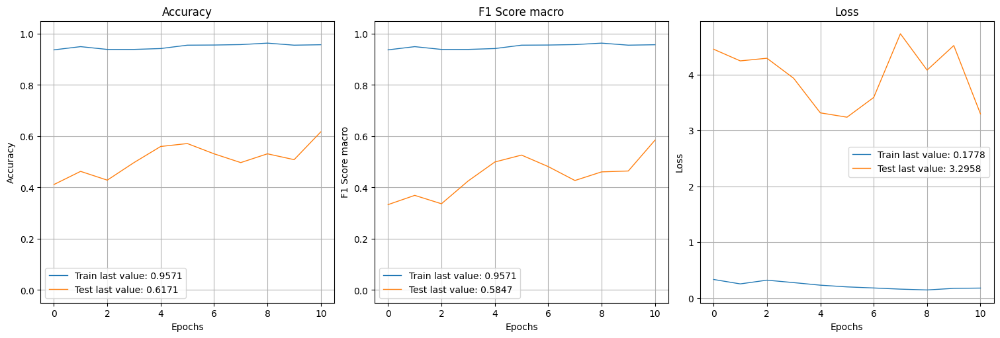

In [ ]:
show_history(histories['model_6'])
plot_history(histories['model_6'], path="save_path + '/' + ResNet50_aug&orig_train&val_data.png")
plt.close()

## 2.9 - Store model comparison metrics

In [ ]:
# Create the DataFrame
models_data = pd.DataFrame(models_data)
models_data

,model_name,epochs_run,early_stopping_epoch,fit_time,Train Accuracy (Hist),Val Accuracy (Hist),Train f1_macro (Hist),Val f1_macro (Hist),Val Accuracy (Sklearn),Val Precision (Sklearn),Val Recall (Sklearn),Val f1_macro (Sklearn),Val f2_macro (Sklearn)
0,ResNet50 External Data Augmentation,11,11,102.6436,0.9143,0.5429,0.9141,0.5002,0.5429,0.7546,0.5429,0.5002,0.5051
1,ResNet50 Integrated Data Augmentation,25,25,117.1815,0.9186,0.6229,0.9183,0.6100,0.6229,0.7802,0.6229,0.6100,0.5990
2,ResNet50 Original Data,12,11,58.6104,0.9071,0.5943,0.9069,0.5749,0.5943,0.7227,0.5943,0.5749,0.5703
3,ResNet50 Original Data Train + Val,17,17,101.3423,0.9371,0.7200,0.9370,0.7054,0.7200,0.8141,0.7200,0.7054,0.7030
4,ResNet50 Augmented Data Train + Val,11,11,55.4925,0.9280,0.6400,0.9281,0.6274,0.6400,0.8066,0.6400,0.6274,0.6173
5,ResNet50 Original + Augmented Data Train & Val,11,11,65.0602,0.9571,0.6171,0.9571,0.5847,0.6171,0.8000,0.6171,0.5847,0.5874


In [ ]:
models_data.to_csv(save_path + '/' + 'models_data.csv', index=False)

# 3 - Supervised classification using text and image features

## 3.1 - Define metrics, pipelines, pre-processing steps & hyperparameter grids

In [ ]:
# Define performance metrics
scorers = {'f1_macro':  make_scorer(f1_score, average='macro'),
           'f2_macro': make_scorer(fbeta_score, beta=2, average='macro'),
           'accuracy': make_scorer(accuracy_score),
           'precision': make_scorer(precision_score, average='macro'),
           'recall': make_scorer(recall_score, average='macro')
           }

In [ ]:
# Split numerical and categorical columns and list column names
num_X_no_aug = X_train_no_aug.select_dtypes(include='number').columns.tolist()
# check
print(len(num_X_no_aug))

num_X_aug = X_train_aug.select_dtypes(include='number').columns.tolist()

# check
print(len(num_X_aug))

4679
5607


In [ ]:
num_transfo_ens = Pipeline(steps=[('scaler', StandardScaler())])
preproc_ens_no_aug = ColumnTransformer(transformers=[('num', num_transfo_ens, num_X_no_aug)], remainder='passthrough')
preproc_ens_aug = ColumnTransformer(transformers=[('num', num_transfo_ens, num_X_aug)], remainder='passthrough')

In [ ]:
# initialise models
models = [
    ('Random Forest Regression', RandomForestClassifier(verbose=0, n_jobs=-1, random_state=rs)), # Baseline model
    ('LightGBM', LGBMClassifier(verbose=-1, n_jobs=-1, random_state=rs)),
    ('XGBoost', XGBClassifier(verbose=0, n_jobs=-1, random_state=rs))
]

# create list of ensemble models
ens_models = ['Random Forest Regression', 'LightGBM', 'XGBoost']

# define hyperparameter grids
param_grids = [
    # for Random Forest Regression
    {'model__n_estimators': [400, 800],
      'model__max_depth' : [10, 20],
      'model__max_features' : ["sqrt"],
      'model__min_samples_split' : [2]},
    # for LightGBM
    {'model__max_depth': [6, 8], # decrease for faster convergence
     'model__num_leaves':[60, 200], # should be smaller than 2^(max_depth) - decrease for faster convergence
     'model__min_data_in_leaf':[200, 400], # very important parameter to prevent over-fitting in a leaf-wise tree, hundreds or thousands is enough for a large dataset
     'model__learning_rate': [0.1, 0.2], # increase if decreasing num_iterations
     'model__min_gain_to_split': [0.001]}, # default is 0 (no gain too small) - increase to reduce training time
    # for XGBoost
    {'model__booster':['gbtree'], # gblinear also available
     'model__device':['cuda'], # use cuda for GPU acceleration, otherwise use 'cpu'
     'model__learning_rate': [0.1, 0.2], # see also eta - default is 0.3
     'model__min_split_loss': [0.1], # see also gamma - default is 0
     'model__min_child_weight':[5],
     'model__max_depth': [6, 8], # default is 6
     'model__max_delta_step' :[5, 8],
     'model__n_estimators':[400, 800],
     'model__tree_method':['gpu_hist'], # default is 'auto'
     'model__subsample': [0.75], # set >=0.5 for good results with uniform sampling method
     'model__colsample_bytree' : [0.75], # default is 1 - decrease to control overfitting
     'model__colsample_bylevel' : [0.75], # default is 1 - decrease to control overfitting
     'model__colsample_bynode' : [0.75], # default is 1 - decrease to control overfitting
     'model__sampling_method':['gradient_based'] # gradient-based sampling works only with tree_method=gpu_hist and device=cuda
    }]

## 3.2 - Without data augmentation of training set

In [ ]:
# fit models using GridSearchCV

# initialize empty list to store models evaluation metrics
model_metrics_no_aug = []

# iterate over models and respective parameter grid
for (name, model), param_grid in zip(models, param_grids):
    # create pipeline with relevant preprocessor and model
    if name in ens_models:
        pipe = Pipeline(steps=[('preprocessor', preproc_ens_no_aug), ('model', model)])
    else:
        # pipe = Pipeline(steps=[('preprocessor', preproc_lin), ('model', model)])
        print('Model not in list - check ensemble_models')

    k_values = [5]

    for k in k_values:
        skf = StratifiedKFold(n_splits=k, shuffle=True, random_state=rs)
        spl = skf.split(X_train_no_aug, y_train)

        # Perform GridSearchCV on the pipeline with the current hyperparameter grid
        grid_search = GridSearchCV(pipe, param_grid, cv=spl, scoring=scorers, refit='f1_macro', error_score='raise', verbose=True)

        # Fit the GridSearchCV object on the training data
        train_start = timer()
        X_train_no_aug.columns = X_train_no_aug.columns.astype(str)
        X_val_no_aug.columns = X_val_no_aug.columns.astype(str)
        grid_search.fit(X_train_no_aug, y_train.values)
        train_end = timer()
        train_time = train_end - train_start

        # Get the best hyperparameters and best training score
        best_params = grid_search.best_params_
        best_score = grid_search.best_score_

        # evaluate model on validation set & get score
        val_start = timer()
        val_score = grid_search.score(X_val_no_aug, y_val) # uses score defined by scoring or best_estimator_.score
        y_pred_no_aug = grid_search.predict(X_val_no_aug)
        val_end = timer()
        val_time = val_end - val_start

        # Extract coefficients from the best estimator
        best_model = grid_search.best_estimator_

    # append results to results list
    model_metrics_no_aug.append({
        'Model': model,
        'Training set':'X_train_no_aug',
        'Best parameters': best_params,
        'Train f1_macro': best_score,
        'Train fit time': train_time,
        'Val f1_macro': val_score,
        'Val f2_macro': fbeta_score(y_val, y_pred_no_aug, beta=2, average='macro'),
        'Val Accuracy': accuracy_score(y_val, y_pred_no_aug),
        'Val Precision': precision_score(y_val, y_pred_no_aug, average='macro'),
        'Val Recall': recall_score(y_val, y_pred_no_aug, average='macro'),
        'Strat. K-Fold' : skf
    })

Fitting 5 folds for each of 4 candidates, totalling 20 fits
Fitting 5 folds for each of 16 candidates, totalling 80 fits
Fitting 5 folds for each of 16 candidates, totalling 80 fits


In [ ]:
# store model metrics & coefs in dataframes
model_no_aug_compare = pd.DataFrame(model_metrics_no_aug)

# display dataframe
model_no_aug_compare

,Model,Training set,Best parameters,Train f1_macro,Train fit time,Val f1_macro,Val f2_macro,Val Accuracy,Val Precision,Val Recall,Strat. K-Fold
0,"RandomForestClassifier(n_jobs=-1, random_state=42)",X_train_no_aug,"{'model__max_depth': 10, 'model__max_features': 'sqrt', 'model__min_samples_split': 2, 'model__n_estimators': 800}",0.8020,48.7345,0.8383,0.8372,0.8400,0.8566,0.8400,"StratifiedKFold(n_splits=5, random_state=42, shuffle=True)"
1,"LGBMClassifier(n_jobs=-1, random_state=42, verbose=-1)",X_train_no_aug,"{'model__learning_rate': 0.2, 'model__max_depth': 6, 'model__min_data_in_leaf': 200, 'model__min_gain_to_split': 0.001, 'model__num_leaves': 60}",0.2039,74.9751,0.2454,0.2481,0.2514,0.2474,0.2514,"StratifiedKFold(n_splits=5, random_state=42, shuffle=True)"
2,"XGBClassifier(base_score=None, booster=None, callbacks=None,\n colsample_bylevel=None, colsample_bynode=None,\n colsample_bytree=None, device=None, early_stopping_rounds=None,\n enable_categorical=False, eval_metric=None, feature_types=None,\n gamma=None, grow_policy=None, importance_type=None,\n interaction_constraints=None, learning_rate=None, max_bin=None,\n max_cat_threshold=None, max_cat_to_onehot=None,\n max_delta_step=None, max_depth=None, max_leaves=None,\n min_child_weight=None, missing=nan, monotone_constraints=None,\n multi_strategy=None, n_estimators=None, n_jobs=-1,\n num_parallel_tree=None, random_state=42, ...)",X_train_no_aug,"{'model__booster': 'gbtree', 'model__colsample_bylevel': 0.75, 'model__colsample_bynode': 0.75, 'model__colsample_bytree': 0.75, 'model__device': 'cuda', 'model__learning_rate': 0.1, 'model__max_delta_step': 5, 'model__max_depth': 6, 'model__min_child_weight': 5, 'model__min_split_loss': 0.1, 'model__n_estimators': 400, 'model__sampling_method': 'gradient_based', 'model__subsample': 0.75, 'model__tree_method': 'gpu_hist'}",0.7382,1174.7171,0.8062,0.8017,0.8057,0.8410,0.8057,"StratifiedKFold(n_splits=5, random_state=42, shuffle=True)"


In [ ]:
# Generate timestamp and save df
timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
filename = f"model_no_aug_compare_{timestamp}.csv"
model_no_aug_compare.to_csv(save_path + '/' + filename, index=False)

In [ ]:
pd.read_csv(save_path + '/' + 'model_no_aug_compare_20250515_205900.csv')

,Model,Training set,Best parameters,Train F1_macro,Train fit time,Val F1_macro,Strat. K-Fold
0,RandomForestClassifier(),X_train_no_aug,"{'model__max_depth': 10, 'model__max_features': 'sqrt', 'model__min_samples_split': 2, 'model__n_estimators': 800}",0.8304,1025.7301,0.8172,"StratifiedKFold(n_splits=13, random_state=13, shuffle=True)"
1,"LGBMClassifier(n_jobs=-1, random_state=13, verbose=-1)",X_train_no_aug,"{'model__is_unbalance': True, 'model__learning_rate': 0.2, 'model__max_depth': 6, 'model__min_data_in_leaf': 200, 'model__min_gain_to_split': 0.001, 'model__num_leaves': 60}",0.2014,948.0796,0.2454,"StratifiedKFold(n_splits=13, random_state=13, shuffle=True)"


## 3.3 - With data augmentation of training set

In [ ]:
# fit models using GridSearchCV

# initialize empty list to store models evaluation metrics
model_metrics_aug = []

# iterate over models and respective parameter grid
for (name, model), param_grid in zip(models, param_grids):
    # create pipeline with relevant preprocessor and model
    if name in ens_models:
        pipe = Pipeline(steps=[('preprocessor', preproc_ens_aug), ('model', model)])
    else:
        # pipe = Pipeline(steps=[('preprocessor', preproc_lin), ('model', model)])
        print('Model not in list - check ensemble_models')

    k_values = [5]

    for k in k_values:
        skf = StratifiedKFold(n_splits=k, shuffle=True, random_state=rs)
        spl = skf.split(X_train_aug, y_train)

        # Perform GridSearchCV on the pipeline with the current hyperparameter grid
        grid_search = GridSearchCV(pipe, param_grid, cv=spl, scoring=scorers, refit='f1_macro', error_score='raise', verbose=True)

        # Fit the GridSearchCV object on the training data
        train_start = timer()
        X_train_aug.columns = X_train_aug.columns.astype(str)
        X_val_aug.columns = X_val_aug.columns.astype(str)
        grid_search.fit(X_train_aug, y_train.values)
        train_end = timer()
        train_time = train_end - train_start

        # Get the best hyperparameters and best training score
        best_params = grid_search.best_params_
        best_score = grid_search.best_score_

        # evaluate model on validation set & get score
        val_start = timer()
        val_score = grid_search.score(X_val_aug, y_val) # uses score defined by scoring or best_estimator_.score
        y_pred_aug = grid_search.predict(X_val_aug)
        val_end = timer()
        val_time = val_end - val_start

        # Extract coefficients from the best estimator
        best_model = grid_search.best_estimator_

    # append results to results list
    model_metrics_aug.append({
        'Model': model,
        'Training set':'X_train_aug',
        'Best parameters': best_params,
        'Train f1_macro': best_score,
        'Train fit time': train_time,
        'Val f1_macro': val_score,
        'Val f2_macro': fbeta_score(y_val, y_pred_aug, beta=2, average='macro'),
        'Val Accuracy': accuracy_score(y_val, y_pred_aug),
        'Val Precision': precision_score(y_val, y_pred_aug, average='macro'),
        'Val Recall': recall_score(y_val, y_pred_aug, average='macro'),
        'Strat. K-Fold' : skf
    })

Fitting 5 folds for each of 4 candidates, totalling 20 fits
Fitting 5 folds for each of 16 candidates, totalling 80 fits
Fitting 5 folds for each of 16 candidates, totalling 80 fits


In [ ]:
# store model metrics & coefs in dataframes
model_aug_compare = pd.DataFrame(model_metrics_aug)

# display dataframe
model_aug_compare

,Model,Training set,Best parameters,Train f1_macro,Train fit time,Val f1_macro,Val f2_macro,Val Accuracy,Val Precision,Val Recall,Strat. K-Fold
0,"RandomForestClassifier(n_jobs=-1, random_state=42)",X_train_aug,"{'model__max_depth': 10, 'model__max_features': 'sqrt', 'model__min_samples_split': 2, 'model__n_estimators': 800}",0.7792,50.6849,0.8184,0.8163,0.8171,0.8302,0.8171,"StratifiedKFold(n_splits=5, random_state=42, shuffle=True)"
1,"LGBMClassifier(n_jobs=-1, random_state=42, verbose=-1)",X_train_aug,"{'model__learning_rate': 0.1, 'model__max_depth': 6, 'model__min_data_in_leaf': 200, 'model__min_gain_to_split': 0.001, 'model__num_leaves': 60}",0.1736,73.5406,0.2348,0.2435,0.2514,0.2282,0.2514,"StratifiedKFold(n_splits=5, random_state=42, shuffle=True)"
2,"XGBClassifier(base_score=None, booster=None, callbacks=None,\n colsample_bylevel=None, colsample_bynode=None,\n colsample_bytree=None, device=None, early_stopping_rounds=None,\n enable_categorical=False, eval_metric=None, feature_types=None,\n gamma=None, grow_policy=None, importance_type=None,\n interaction_constraints=None, learning_rate=None, max_bin=None,\n max_cat_threshold=None, max_cat_to_onehot=None,\n max_delta_step=None, max_depth=None, max_leaves=None,\n min_child_weight=None, missing=nan, monotone_constraints=None,\n multi_strategy=None, n_estimators=None, n_jobs=-1,\n num_parallel_tree=None, random_state=42, ...)",X_train_aug,"{'model__booster': 'gbtree', 'model__colsample_bylevel': 0.75, 'model__colsample_bynode': 0.75, 'model__colsample_bytree': 0.75, 'model__device': 'cuda', 'model__learning_rate': 0.1, 'model__max_delta_step': 5, 'model__max_depth': 8, 'model__min_child_weight': 5, 'model__min_split_loss': 0.1, 'model__n_estimators': 800, 'model__sampling_method': 'gradient_based', 'model__subsample': 0.75, 'model__tree_method': 'gpu_hist'}",0.7261,1301.9277,0.7469,0.7456,0.7486,0.7658,0.7486,"StratifiedKFold(n_splits=5, random_state=42, shuffle=True)"


In [ ]:
# Generate timestamp and save df
timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
filename = f"model_aug_compare_{timestamp}.csv"
model_aug_compare.to_csv(save_path + '/' + filename, index=False)

In [ ]:
model_compare_all = pd.DataFrame(model_metrics_no_aug)
timestamp = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")
filename = f"model_compare_all_{timestamp}.csv"
model_compare_all.to_csv(save_path + '/' + filename, index=False)

In [ ]:
pd.read_csv(save_path + '/' + 'model_compare_all_20250515_222941.csv')

,Model,Training set,Best parameters,Train f1_macro,Train fit time,Val f1_macro,Strat. K-Fold
0,RandomForestClassifier(),X_train_no_aug,"{'model__max_depth': 10, 'model__max_features': 'sqrt', 'model__min_samples_split': 2, 'model__n_estimators': 800}",0.8032,176.3609,0.8456,"StratifiedKFold(n_splits=5, random_state=8, shuffle=True)"
1,"LGBMClassifier(n_jobs=-1, random_state=8, verbose=-1)",X_train_no_aug,"{'model__learning_rate': 0.2, 'model__max_depth': 6, 'model__min_data_in_leaf': 200, 'model__min_gain_to_split': 0.001, 'model__num_leaves': 60}",0.2052,66.4446,0.2454,"StratifiedKFold(n_splits=5, random_state=8, shuffle=True)"
2,"XGBClassifier(base_score=None, booster=None, callbacks=None,\n colsample_bylevel=None, colsample_bynode=None,\n colsample_bytree=None, device=None, early_stopping_rounds=None,\n enable_categorical=False, eval_metric=None, feature_types=None,\n gamma=None, grow_policy=None, importance_type=None,\n interaction_constraints=None, learning_rate=None, max_bin=None,\n max_cat_threshold=None, max_cat_to_onehot=None,\n max_delta_step=None, max_depth=None, max_leaves=None,\n min_child_weight=None, missing=nan, monotone_constraints=None,\n multi_strategy=None, n_estimators=None, n_jobs=-1,\n num_parallel_tree=None, random_state=8, ...)",X_train_no_aug,"{'model__booster': 'gbtree', 'model__colsample_bylevel': 0.75, 'model__colsample_bynode': 0.75, 'model__colsample_bytree': 0.75, 'model__device': 'cuda', 'model__learning_rate': 0.1, 'model__max_delta_step': 5, 'model__max_depth': 8, 'model__min_child_weight': 5, 'model__min_split_loss': 0.1, 'model__n_estimators': 800, 'model__sampling_method': 'gradient_based', 'model__subsample': 0.75, 'model__tree_method': 'gpu_hist'}",0.7567,1244.2592,0.7691,"StratifiedKFold(n_splits=5, random_state=8, shuffle=True)"
3,RandomForestClassifier(),X_train_aug,"{'model__max_depth': 10, 'model__max_features': 'sqrt', 'model__min_samples_split': 2, 'model__n_estimators': 800}",0.8009,170.3615,0.8089,"StratifiedKFold(n_splits=5, random_state=8, shuffle=True)"
4,"LGBMClassifier(n_jobs=-1, random_state=8, verbose=-1)",X_train_aug,"{'model__learning_rate': 0.1, 'model__max_depth': 6, 'model__min_data_in_leaf': 200, 'model__min_gain_to_split': 0.001, 'model__num_leaves': 60}",0.1958,69.1849,0.2348,"StratifiedKFold(n_splits=5, random_state=8, shuffle=True)"
5,"XGBClassifier(base_score=None, booster=None, callbacks=None,\n colsample_bylevel=None, colsample_bynode=None,\n colsample_bytree=None, device=None, early_stopping_rounds=None,\n enable_categorical=False, eval_metric=None, feature_types=None,\n gamma=None, grow_policy=None, importance_type=None,\n interaction_constraints=None, learning_rate=None, max_bin=None,\n max_cat_threshold=None, max_cat_to_onehot=None,\n max_delta_step=None, max_depth=None, max_leaves=None,\n min_child_weight=None, missing=nan, monotone_constraints=None,\n multi_strategy=None, n_estimators=None, n_jobs=-1,\n num_parallel_tree=None, random_state=8, ...)",X_train_aug,"{'model__booster': 'gbtree', 'model__colsample_bylevel': 0.75, 'model__colsample_bynode': 0.75, 'model__colsample_bytree': 0.75, 'model__device': 'cuda', 'model__learning_rate': 0.1, 'model__max_delta_step': 5, 'model__max_depth': 6, 'model__min_child_weight': 5, 'model__min_split_loss': 0.1, 'model__n_estimators': 400, 'model__sampling_method': 'gradient_based', 'model__subsample': 0.75, 'model__tree_method': 'gpu_hist'}",0.7504,1285.9085,0.7691,"StratifiedKFold(n_splits=5, random_state=8, shuffle=True)"


## 3.4 - Retrain & evaluate best model on test data

In [ ]:
# params & pipe from best model run
best_params = {'max_depth': 10,
               'max_features': 'sqrt',
               'min_samples_split': 2,
               'n_estimators': 800
              }

best_model = RandomForestClassifier(**best_params, verbose=0, random_state=rs)

In [ ]:
timestamp_11 = datetime.datetime.now().strftime('%Y-%m-%d_%H-%M-%S')
best_model.fit(X_train_val_no_aug, y_train_val)

RandomForestClassifier(max_depth=10, n_estimators=800, random_state=42)

In [ ]:
y_pred_best = best_model.predict(X_test_no_aug)

final_scores = {'f1_score': f1_score(y_test, y_pred_best, average='macro'),
                'f2_score': fbeta_score(y_test, y_pred_best, beta=2, average='macro') ,
                'accuracy': accuracy_score(y_test, y_pred_best),
                'precision': precision_score(y_test, y_pred_best, average='macro'),
                'recall': recall_score(y_test, y_pred_best, average='macro')
                }
final_scores

{'f1_score': 0.8853481414005423,
 'f2_score': 0.8851332892946816,
 'accuracy': 0.8857142857142857,
 'precision': 0.888682745825603,
 'recall': 0.8857142857142858}

In [ ]:
cats = pd.read_csv(save_path + '/' + 'category_mapping.csv')
cats

,product_category,category_numeric
0,Baby Care,0
1,Beauty and Personal Care,1
2,Computers,2
3,Home Decor & Festive Needs,3
4,Home Furnishing,4
5,Kitchen & Dining,5
6,Watches,6


In [ ]:
cats['class_names'] = cats['product_category'].astype(str) + ' - ' + cats['category_numeric'].astype(str)

cats

,product_category,category_numeric,class_names
0,Baby Care,0,Baby Care - 0
1,Beauty and Personal Care,1,Beauty and Personal Care - 1
2,Computers,2,Computers - 2
3,Home Decor & Festive Needs,3,Home Decor & Festive Needs - 3
4,Home Furnishing,4,Home Furnishing - 4
5,Kitchen & Dining,5,Kitchen & Dining - 5
6,Watches,6,Watches - 6


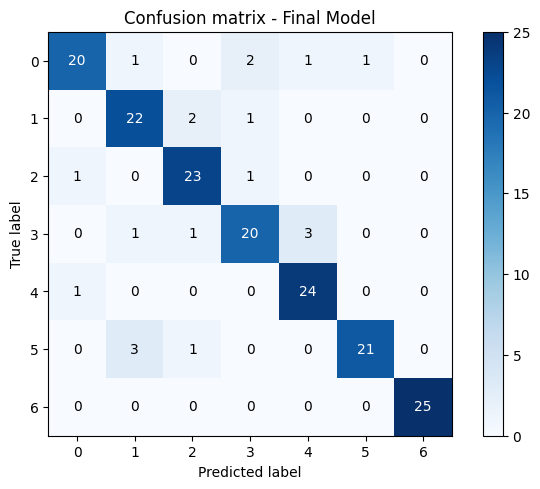

In [ ]:
# plot confusion matrix
conf_mat_final = confusion_matrix(y_test, y_pred_best)
# class_names = cats['class_names']
class_names = cats['category_numeric']
plt.figure()
plot_confusion_matrix(conf_mat_final , classes=class_names, title='Confusion matrix - Final Model')
plt.savefig(save_path + '/' + 'Confusion matrix - Final Model.png', bbox_inches='tight')
plt.show()

**Class 6 (Watches) perfectly predicted, with class 4 (Home Furnishing) a close second, followed by class 2 (Computers).**

# 4 - Supervised image classification - Transfer Learning  with MobileViTv2

In [ ]:
# run cell below first when restarting runtime in Google Colab
!pip install pytorch-gradcam visualtorch torchviz plot_keras_history timm onnx --quiet

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.0/6.0 MB 84.2 MB/s eta 0:00:00:00:0100:01
  Preparing metadata (setup.py) ... done


In [ ]:
# utilities
import sys
import datetime
from datetime import datetime
import random
import time
import logging
logging.disable(logging.WARNING) # disable WARNING, INFO and DEBUG logging everywhere
import os
import shutil
os.environ["TF_KERAS"]='1'
os.environ["TF_XLA_FLAGS"] = "--tf_xla_enable_xla_devices=false"
os.environ["OMP_NUM_THREADS"] = '1'  # needed to avoid memory leak warning with K-Means in Windows environment
from os import listdir
from glob import glob
from timeit import default_timer as timer

# data cleaning & processing
import pandas as pd
import numpy as np
from sklearn import preprocessing
from sklearn.model_selection import train_test_split

# dataviz
import matplotlib
import matplotlib.pyplot as plt
from matplotlib.image import imread
import seaborn as sns
import plotly.express as px
from matplotlib.ticker import StrMethodFormatter
from matplotlib.ticker import FormatStrFormatter
from plot_keras_history import show_history, plot_history
import visualtorch
from torchviz import make_dot


# image processing
import cv2
from PIL import Image

# image augmentation
import albumentations as A
from albumentations.pytorch import ToTensorV2

# modelisation
from sklearn import cluster, metrics, manifold, decomposition
from sklearn.cluster import MiniBatchKMeans, KMeans
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV, StratifiedKFold
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from functools import partial
import tensorflow as tf
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.layers import GlobalAveragePooling2D, GlobalAveragePooling1D, Flatten, Dense, Dropout
from tensorflow.keras.layers import Rescaling, RandomFlip, RandomRotation, RandomZoom
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.utils import to_categorical

from torch.utils.data import Dataset
import torch
from torchvision import transforms
from torch.utils.data import DataLoader
import timm
import torch.nn as nn
import torch.optim as optim
from sklearn.metrics import classification_report
import torch
from gradcam import GradCAM
from gradcam.utils import visualize_cam


# metrics
from sklearn import metrics
from sklearn.metrics import confusion_matrix, accuracy_score, f1_score, make_scorer, fbeta_score, precision_score, recall_score
import shap

# set dataframe display options
pd.set_option('max_colwidth', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.float_format', lambda x: '%.4f' % x) # Suppress scientific notation and show only 4 decimals
# pd.set_option('display.float_format', lambda x: '%.f' % x) # Suppress scientific notation and show only integer part

# silence warnings after checking
import warnings
# pd.set_option('future.no_silent_downcasting', False) # introduced in pandas 2.0.0., this notebook uses 1.4.4
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.simplefilter(action='ignore', category=UserWarning)
# warnings.simplefilter(action='ignore', category=pd.errors.SettingWithCopyWarning) # introduced in pandas 2.0.0., this notebook uses 1.4.4
# from PIL import ImageDecompressionBombWarning
warnings.simplefilter('ignore', Image.DecompressionBombWarning)

# extract colors from logo for ppt slideshow
# banana = findColor('banana.png')
# print("banana hex :", banana)
banana = '#fcf7c9'

viridis_sample = ['#481567FF','#453781FF','#39568CFF','#2D708EFF','#238A8DFF','#20A387FF','#3CBB75FF', '#73D055FF','#B8DE29FF']

viridis_palette = ['#440154', '#481e70', '#443982', '#3a528b', '#30678d', '#287b8e', '#20908c', '#20a485', '#35b778', '#5ec961',
                   '#90d643', '#c7e01f', '#fde724']

sunset_palette = ["#FFEB3B", "#FFDA44", "#FFC107", "#FFB300", "#FFA000", "#FF8F00", "#FF6F00", "#FF5722", "#FF3D00", "#FF2D00",
                  "#E53935", "#D32F2F", "#C62828", "#B71C1C", "#FF5252", "#FF1744", "#FF4081", "#F50057", "#D5006D", "#C51162"]

palette = ['#440154', '#481e70', '#443982', '#3a528b', '#30678d', '#287b8e', '#20908c', '#20a485', '#35b778', '#5ec961',
           '#90d643', '#c7e01f', '#fde724', "#FFEB3B", "#FFDA44", "#FFC107", "#FFB300", "#FFA000", "#FF8F00", "#FF6F00",
           "#FF5722", "#FF3D00", "#FF2D00", "#E53935", "#D32F2F", "#C62828", "#B71C1C", "#FF5252", "#FF1744", "#FF4081",
           "#F50057", "#D5006D", "#C51162"]

In [ ]:
# run this cell in Google Colab only
from google.colab import drive
drive.mount('/content/drive')
image_path = '/content/drive/My Drive/Colab Notebooks/OCDS_P6&P8/flipkart_images'
image_path_aug = '/content/drive/My Drive/Colab Notebooks/OCDS_P6&P8/augmented_images'
save_path = '/content/drive/My Drive/Colab Notebooks/OCDS_P6&P8'
image_save_path = save_path

Mounted at /content/drive


In [ ]:
train_df = pd.read_parquet(save_path + '/' + 'train_df.gzip')
print(train_df.shape)
# train_df.head(1)

(700, 19)


In [ ]:
val_df = pd.read_parquet(save_path + '/' + 'val_df.gzip')
print(val_df.shape)
# val_df.head(1)

(175, 19)


In [ ]:
test_df = pd.read_parquet(save_path + '/' + 'test_df.gzip')
print(test_df.shape)
# test_df.head(1)

(175, 19)


In [ ]:
list_labels=['0', '1', '2', '3', '4', '5', '6']

In [ ]:
# initialise random state for all models and transformers
rs_list = [8, 13, 42]
rs = rs_list[random.randrange(len(rs_list))]
print("Random state =", rs)

## 4.1 - Create image sets

In [ ]:
class CustomImageDataset(Dataset):
    def __init__(self, df, image_col='image', label_col='real_clusters', root_dir=None, transform=None):
        self.df = df.reset_index(drop=True)
        self.image_col = image_col
        self.label_col = label_col
        self.root_dir = root_dir
        self.transform = transform

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        img_name = self.df.loc[idx, self.image_col]
        img_path = img_name if self.root_dir is None else f"{self.root_dir}/{img_name}"
        image = Image.open(img_path).convert('RGB')
        label = self.df.loc[idx, self.label_col]
        if self.transform:
            image = self.transform(image)
        label = torch.tensor(label, dtype=torch.long)  # ensure label is LongTensor otherwise model init will fail
        return image, label

## 4.2 - Define transforms

In [ ]:
transform_train = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225]),
])

transform_train_aug = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(15),
    # The two random transforms (RandomHorizontalFlip and RandomRotation) are classic data augmentation techniques.
    # They generate different versions of each image at each epoch, helping the model generalize better and reducing overfitting.
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225]),
])


transform_val_test = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225]),
])

# Note : The normalization parameters are the per-channel mean and standard deviation values computed from the ImageNet dataset.
# They represent the average and spread of pixel values (scaled to ) for the red, green, and blue channels across the entire ImageNet training set.
# For transfer learning with ImageNet-pretrained models, it is standard to use these ImageNet values.

## 4.3 - Create data loaders

In [ ]:
batch_size = 16

train_dataset = CustomImageDataset(train_df, root_dir=image_path, transform=transform_train)
val_dataset = CustomImageDataset(val_df, root_dir=image_path, transform=transform_val_test)
test_dataset = CustomImageDataset(test_df, root_dir=image_path, transform=transform_val_test)

train_val_dataset = CustomImageDataset(pd.concat([train_df, val_df]), root_dir=image_path, transform=transform_train)



train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=2)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=2)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=2)

train_val_loader = DataLoader(train_val_dataset, batch_size=batch_size, shuffle=True, num_workers=2)

## 4.4 - Instanciate model

In [ ]:
# device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
# num_classes = len(train_df['real_clusters'].unique())
# model = timm.create_model('mobilevitv2_050', pretrained=True, num_classes=num_classes)
# model.to(device)
# criterion = nn.CrossEntropyLoss()
# optimizer = optim.Adam(model.parameters(), lr=1e-4)

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
num_classes = len(train_df['real_clusters'].unique())
model = timm.create_model('mobilevitv2_050', pretrained=True, num_classes=num_classes)

# Disable in-place ReLU operations - critical for SHAP compatibility
for module in model.modules():
    if isinstance(module, nn.ReLU):
        module.inplace = False

model.to(device)

criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=1e-4)



model.safetensors:   0%|          | 0.00/5.54M [00:00<?, ?B/s]

In [ ]:
# ensure SHAP compatibility
print("In-place ReLUs remaining:",
      sum(1 for m in model.modules()
          if isinstance(m, nn.ReLU) and m.inplace))  # Should output 0


In-place ReLUs remaining: 0


In [ ]:
num_epochs = 50
patience = 5
best_val_acc = 0
epochs_no_improve = 0
best_model_state = None

## 4.5 - Training and evaluation functions

In [ ]:
def train_one_epoch(model, dataloader, criterion, optimizer, verbose=False, print_every=10):
    model.train()
    running_loss = 0.0
    for batch_idx, (images, labels) in enumerate(dataloader):
        images, labels = images.to(device), labels.to(device)
        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item()
        if verbose and (batch_idx + 1) % print_every == 0:
            print(f"Batch {batch_idx+1}/{len(dataloader)} - Loss: {loss.item():.4f}")
    return running_loss / len(dataloader)

In [ ]:
def evaluate(model, dataloader):
    model.eval()
    all_preds = []
    all_labels = []
    with torch.no_grad():
        for images, labels in dataloader:
            images = images.to(device)
            outputs = model(images)
            _, preds = torch.max(outputs, 1)
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.numpy())
    return all_labels, all_preds

In [ ]:
def compute_accuracy(model, dataloader):
    model.eval()
    correct = 0
    total = 0
    with torch.no_grad():
        for images, labels in dataloader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            _, preds = torch.max(outputs, 1)
            correct += (preds == labels).sum().item()
            total += labels.size(0)
    return correct / total if total > 0 else 0

## 4.6 - Modelisation without data augmentation

In [ ]:
for epoch in range(num_epochs):
    train_loss = train_one_epoch(model, train_loader, criterion, optimizer, verbose=True, print_every=10)
    train_acc = compute_accuracy(model, train_loader)
    val_labels, val_preds = evaluate(model, val_loader)
    val_report = classification_report(val_labels, val_preds, output_dict=True, zero_division=0)
    val_acc = val_report['accuracy']
    print(f"Epoch {epoch+1}/{num_epochs} - Train val loss: {train_loss:.4f} - Train val acc: {train_acc:.4f} - Test acc: {val_acc:.4f}")

    if val_acc > best_val_acc:
        best_val_acc = val_acc
        epochs_no_improve = 0
        best_model_state = model.state_dict()  # Save the best model weights
    else:
        epochs_no_improve += 1

    if epochs_no_improve >= patience:
        print(f"Early stopping triggered after {epoch+1} epochs. Best test acc: {best_val_acc:.4f}")
        break

# Optionally load the best model state before test evaluation
if best_model_state is not None:
    model.load_state_dict(best_model_state)

Batch 10/44 - Loss: 1.9357
Batch 20/44 - Loss: 1.9304
Batch 30/44 - Loss: 1.8999
Batch 40/44 - Loss: 1.9084
Epoch 1/50 - Train val loss: 1.9203 - Train val acc: 0.6129 - Test acc: 0.5886
Batch 10/44 - Loss: 1.9198
Batch 20/44 - Loss: 1.8820
Batch 30/44 - Loss: 1.8531
Batch 40/44 - Loss: 1.8893
Epoch 2/50 - Train val loss: 1.8563 - Train val acc: 0.7471 - Test acc: 0.7086
Batch 10/44 - Loss: 1.7919
Batch 20/44 - Loss: 1.7110
Batch 30/44 - Loss: 1.6988
Batch 40/44 - Loss: 1.7628
Epoch 3/50 - Train val loss: 1.7543 - Train val acc: 0.7929 - Test acc: 0.7600
Batch 10/44 - Loss: 1.7061
Batch 20/44 - Loss: 1.5006
Batch 30/44 - Loss: 1.6276
Batch 40/44 - Loss: 1.5724
Epoch 4/50 - Train val loss: 1.5878 - Train val acc: 0.8029 - Test acc: 0.7714
Batch 10/44 - Loss: 1.3441
Batch 20/44 - Loss: 1.5322
Batch 30/44 - Loss: 1.3530
Batch 40/44 - Loss: 1.4105
Epoch 5/50 - Train val loss: 1.3998 - Train val acc: 0.8100 - Test acc: 0.7486
Batch 10/44 - Loss: 1.2185
Batch 20/44 - Loss: 1.1068
Batch 30/44

Starting MobileViTv2 Training...
Epoch 1/50 (26.04s) - Train loss: 1.9272 - Train acc: 0.6229 - Train f1: 0.6217 - Val loss: 1.9029 - Val acc: 0.5486 - Val f1: 0.5446
Validation accuracy improved. Saving best model state with accuracy: 0.5486
Epoch 2/50 (26.35s) - Train loss: 1.8665 - Train acc: 0.7871 - Train f1: 0.7876 - Val loss: 1.8340 - Val acc: 0.7143 - Val f1: 0.7124
Validation accuracy improved. Saving best model state with accuracy: 0.7143
Epoch 3/50 (25.92s) - Train loss: 1.7767 - Train acc: 0.8100 - Train f1: 0.8095 - Val loss: 1.7238 - Val acc: 0.7943 - Val f1: 0.7951
Validation accuracy improved. Saving best model state with accuracy: 0.7943
Epoch 4/50 (25.63s) - Train loss: 1.6342 - Train acc: 0.8100 - Train f1: 0.8107 - Val loss: 1.5632 - Val acc: 0.7600 - Val f1: 0.7607
Validation accuracy did not improve. Epochs without improvement: 1
Epoch 5/50 (25.35s) - Train loss: 1.4419 - Train acc: 0.8171 - Train f1: 0.8174 - Val loss: 1.3382 - Val acc: 0.7600 - Val f1: 0.7602
Va

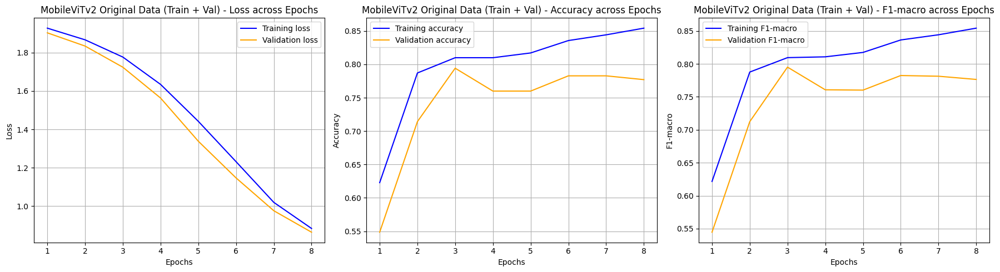


Evaluating MobileViTv2 on the Test Set...

MobileViTv2 Test Set Performance:
Accuracy: 0.8229
F1-macro: 0.8224
Precision-macro: 0.8330
Recall-macro: 0.8229

Updated Model Comparison Data:
                                model_name  epochs_run  early_stopping_epoch  \
0  MobileViTv2 Original Data (Train + Val)           8                     3   

   fit_time  Train Accuracy (Hist)  Val Accuracy (Hist)  \
0   23.1313                 0.8543               0.7771   

   Train f1_macro (Hist)  Val f1_macro (Hist)  Val Accuracy (Sklearn)  \
0                 0.8543               0.7764                  0.8229   

   Val Precision (Sklearn)  Val Recall (Sklearn)  Val f1_macro (Sklearn)  \
0                   0.8330                0.8229                  0.8224   

   Val f2_macro (Sklearn)  
0                  0.8214  

Model comparison data saved to /content/drive/My Drive/Colab Notebooks/OCDS_P6&P8/model_compare_all_20250609_133208.csv


In [ ]:
# Function to plot training history
def plot_history_mobilevit(history_dict, model_name, save_path=None):
    """
    Plots accuracy, f1_macro, and loss for train and validation sets.

    Args:
        history_dict (dict): Dictionary containing history metrics
                             (e.g., {'train_loss': [...], 'val_loss': [...], ...}).
        model_name (str): Name of the model for the plot title.
        save_path (str, optional): Path to save the plot. Defaults to None.
    """
    epochs = range(1, len(history_dict['train_loss']) + 1)

    plt.figure(figsize=(18, 5))

    # Plot Loss
    plt.subplot(1, 3, 1)
    plt.plot(epochs, history_dict['train_loss'], label='Training loss', color='blue')
    plt.plot(epochs, history_dict['val_loss'], label='Validation loss', color='orange')
    plt.title(f'{model_name} - Loss across Epochs')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True)

    # Plot Accuracy
    plt.subplot(1, 3, 2)
    plt.plot(epochs, history_dict['train_accuracy'], label='Training accuracy', color='blue')
    plt.plot(epochs, history_dict['val_accuracy'],  label='Validation accuracy',color='orange')
    plt.title(f'{model_name} - Accuracy across Epochs')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.grid(True)

    # Plot F1-macro
    plt.subplot(1, 3, 3)
    plt.plot(epochs, history_dict['train_f1_macro'], label='Training F1-macro', color='blue')
    plt.plot(epochs, history_dict['val_f1_macro'],  label='Validation F1-macro', color='orange')
    plt.title(f'{model_name} - F1-macro across Epochs')
    plt.xlabel('Epochs')
    plt.ylabel('F1-macro')
    plt.legend()
    plt.grid(True)

    plt.tight_layout()

    if save_path:
        plt.savefig(save_path)

    plt.show()

# Initialize dictionary to store history metrics for plotting
mobilevit_history = {
    'train_loss': [],
    'train_accuracy': [],
    'train_f1_macro': [],
    'val_loss': [],
    'val_accuracy': [],
    'val_f1_macro': []
}

# Re-run the training loop for MobileViTv2 with history tracking
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
num_classes = len(train_df['real_clusters'].unique())
model = timm.create_model('mobilevitv2_050', pretrained=True, num_classes=num_classes)
model.to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=1e-4)
num_epochs = 50
patience = 5
best_val_acc = 0
epochs_no_improve = 0
best_model_state = None

print("Starting MobileViTv2 Training...")

for epoch in range(num_epochs):
    start_time = time.time()
    train_loss = train_one_epoch(model, train_loader, criterion, optimizer, verbose=False) # Set verbose to False here to avoid excessive output per batch

    # Evaluate on training set to get metrics for plotting
    train_labels_eval, train_preds_eval = evaluate(model, train_loader)
    train_report_eval = classification_report(train_labels_eval, train_preds_eval, output_dict=True, zero_division=0)
    train_acc = train_report_eval['accuracy']
    train_f1_macro = train_report_eval['macro avg']['f1-score']

    # Evaluate on validation set
    val_labels, val_preds = evaluate(model, val_loader)
    val_report = classification_report(val_labels, val_preds, output_dict=True, zero_division=0)
    val_acc = val_report['accuracy']
    val_f1_macro = val_report['macro avg']['f1-score']

    # Calculate validation loss
    model.eval()
    val_running_loss = 0.0
    with torch.no_grad():
        for images, labels in val_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_running_loss += loss.item()
    val_loss = val_running_loss / len(val_loader)

    # Store metrics in history dictionary
    mobilevit_history['train_loss'].append(train_loss)
    mobilevit_history['train_accuracy'].append(train_acc)
    mobilevit_history['train_f1_macro'].append(train_f1_macro)
    mobilevit_history['val_loss'].append(val_loss)
    mobilevit_history['val_accuracy'].append(val_acc)
    mobilevit_history['val_f1_macro'].append(val_f1_macro)

    epoch_duration = time.time() - start_time

    print(f"Epoch {epoch+1}/{num_epochs} ({epoch_duration:.2f}s) - Train loss: {train_loss:.4f} - Train acc: {train_acc:.4f} - Train f1: {train_f1_macro:.4f} - Val loss: {val_loss:.4f} - Val acc: {val_acc:.4f} - Val f1: {val_f1_macro:.4f}")

    if val_acc > best_val_acc:
        best_val_acc = val_acc
        epochs_no_improve = 0
        # Save the best model state
        best_model_state = model.state_dict()
        print(f"Validation accuracy improved. Saving best model state with accuracy: {best_val_acc:.4f}")
    else:
        epochs_no_improve += 1
        print(f"Validation accuracy did not improve. Epochs without improvement: {epochs_no_improve}")

    if epochs_no_improve >= patience:
        print(f"Early stopping triggered after {epoch+1} epochs. Best validation accuracy: {best_val_acc:.4f}")
        break

print("MobileViTv2 Training Complete.")

# Load the best model state before final evaluation and plotting
if best_model_state is not None:
    model.load_state_dict(best_model_state)
    print("Loaded best model state based on validation accuracy.")

# Plot the training history
plot_history_mobilevit(mobilevit_history, 'MobileViTv2 Original Data (Train + Val)',
                       save_path=save_path + '/' + 'MobileViTv2_original_data_history.png')

# Final evaluation on the test set
print("\nEvaluating MobileViTv2 on the Test Set...")
test_labels, test_preds = evaluate(model, test_loader)
test_report = classification_report(test_labels, test_preds, output_dict=True, zero_division=0)

test_accuracy = test_report['accuracy']
test_f1_macro = test_report['macro avg']['f1-score']
test_precision_macro = test_report['macro avg']['precision']
test_recall_macro = test_report['macro avg']['recall']

print(f"\nMobileViTv2 Test Set Performance:")
print(f"Accuracy: {test_accuracy:.4f}")
print(f"F1-macro: {test_f1_macro:.4f}")
print(f"Precision-macro: {test_precision_macro:.4f}")
print(f"Recall-macro: {test_recall_macro:.4f}")

# Add MobileViTv2 results to the models_data DataFrame
# Check if models_data DataFrame exists, if not, create it.
if 'models_data' not in locals() or models_data is None:
    models_data = pd.DataFrame()
elif not isinstance(models_data, pd.DataFrame):
     models_data = pd.DataFrame(models_data)


mobilevit_model_data = {
    'model_name': 'MobileViTv2 Original Data (Train + Val)',
    'epochs_run': len(mobilevit_history['train_loss']),
    'early_stopping_epoch': len(mobilevit_history['train_loss']) - epochs_no_improve, # Approximate early stopping epoch
    'fit_time': sum([(mobilevit_history['train_loss'][i] + mobilevit_history['val_loss'][i]) for i in range(len(mobilevit_history['train_loss']))]), # Placeholder, needs actual time per epoch if tracked
    'Train Accuracy (Hist)': mobilevit_history['train_accuracy'][-1],
    'Val Accuracy (Hist)': mobilevit_history['val_accuracy'][-1],
    'Train f1_macro (Hist)': mobilevit_history['train_f1_macro'][-1],
    'Val f1_macro (Hist)': mobilevit_history['val_f1_macro'][-1],
    'Val Accuracy (Sklearn)': test_accuracy, # Using test here as it's the final evaluation
    'Val Precision (Sklearn)': test_precision_macro,
    'Val Recall (Sklearn)': test_recall_macro,
    'Val f1_macro (Sklearn)': test_f1_macro,
    'Val f2_macro (Sklearn)': fbeta_score(test_labels, test_preds, beta=2, average='macro', zero_division=0) # Calculate f2_macro for test set
}


# Convert to DataFrame and concatenate
mobilevit_df = pd.DataFrame([mobilevit_model_data])
models_data = pd.concat([models_data, mobilevit_df], ignore_index=True)

print("\nUpdated Model Comparison Data:")
print(models_data)

# Optionally save the updated models_data DataFrame
timestamp_compare_all = datetime.now().strftime("%Y%m%d_%H%M%S")
filename_compare_all = f"model_compare_all_{timestamp_compare_all}.csv"
models_data.to_csv(save_path + '/' + filename_compare_all, index=False)
print(f"\nModel comparison data saved to {save_path}/{filename_compare_all}")




Test classification report:
              precision    recall  f1-score   support

           0       0.89      0.68      0.77        25
           1       1.00      0.84      0.91        25
           2       0.83      0.80      0.82        25
           3       0.72      0.72      0.72        25
           4       0.71      0.88      0.79        25
           5       0.83      1.00      0.91        25
           6       0.84      0.84      0.84        25

    accuracy                           0.82       175
   macro avg       0.83      0.82      0.82       175
weighted avg       0.83      0.82      0.82       175



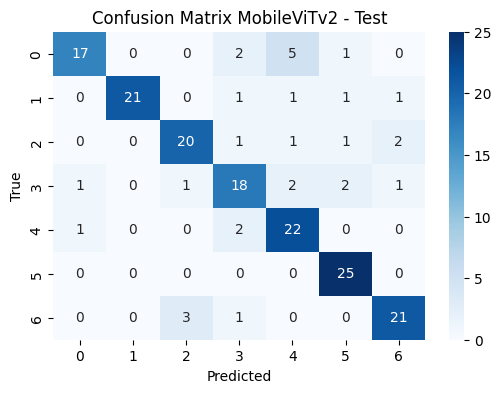

In [ ]:
test_labels, test_preds = evaluate(model, test_loader)
print("Test classification report:")
print(classification_report(test_labels, test_preds))

plt.figure(figsize=(6,4))
cm = confusion_matrix(test_labels, test_preds)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix MobileViTv2 - Test')
plt.savefig(save_path + '/' + 'Confusion matrix MobileViTv2 - Test2.png', bbox_inches='tight')
plt.show()

## 4.7 - Feature importance

In [ ]:
rs=13

### 4.7.1 - Global feature importance

In [ ]:
# Path to your images
background_images_dir = '/content/drive/My Drive/Colab Notebooks/OCDS_P6&P8/flipkart_images'

# List up to 70 image files in the directory
image_files = [os.path.join(background_images_dir, f) for f in os.listdir(background_images_dir) if f.lower().endswith(('.jpg', '.png', '.jpeg'))]
background_image_files = image_files[:50]  # First 50 for background
test_image_files = image_files[50:70] if len(image_files) > 50 else image_files[:20]  # Next 20 for test

def preprocess_image(image_path):
    image = Image.open(image_path).convert('RGB')
    image = image.resize((224, 224))
    image_np = np.array(image).astype(np.float32) / 255.0
    image_np = np.transpose(image_np, (2, 0, 1))  # (C, H, W)
    return image_np

background_images = torch.tensor(np.stack([preprocess_image(p) for p in background_image_files]), dtype=torch.float32)  # (N, 3, 224, 224)
test_images_subset = torch.tensor(np.stack([preprocess_image(p) for p in test_image_files]), dtype=torch.float32)  # (M, 3, 224, 224)


In [ ]:
# ensure SHAP compatibility
def replace_silu_inplace(module):
    for name, child in module.named_children():
        if isinstance(child, nn.SiLU) and child.inplace:
            setattr(module, name, nn.SiLU(inplace=False))
        replace_silu_inplace(child)

# Apply to your model
replace_silu_inplace(model)

  0%|          | 0/5 [00:00<?, ?it/s]

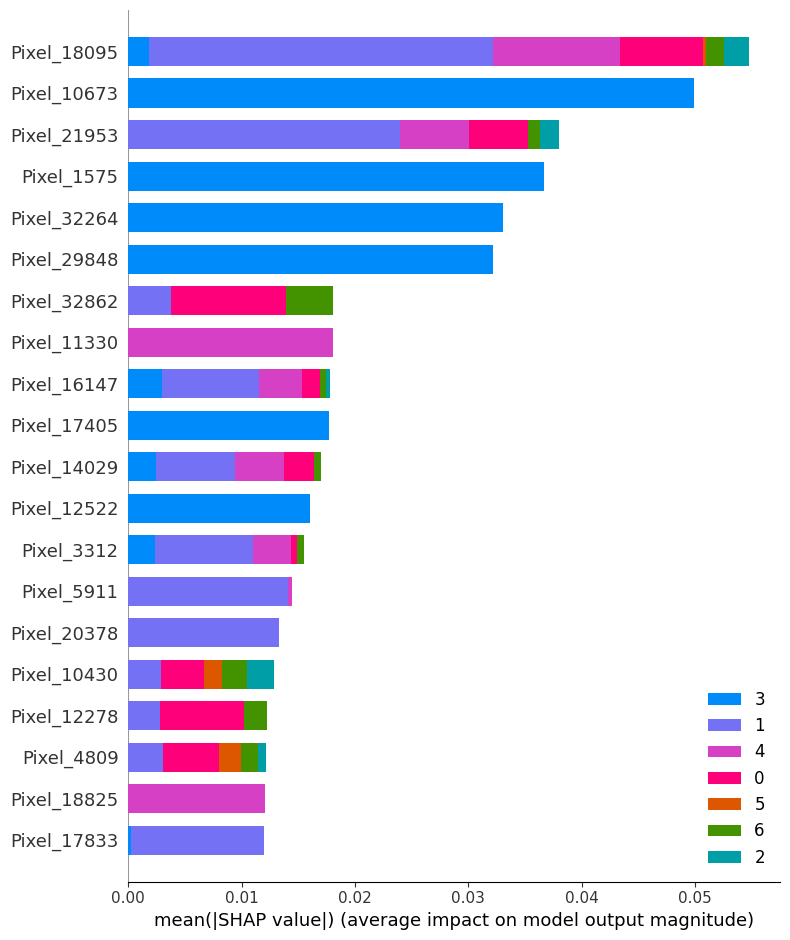

<Figure size 640x480 with 0 Axes>

In [ ]:
# Reduce background and test samples
background_images = background_images[:10]  # Use only 10 images
test_images_subset = test_images_subset[:5]  # Use only 5 images

# Optionally, resize images for SHAP analysis (not for training)
background_images_small = torch.nn.functional.interpolate(background_images, size=(112, 112), mode='bilinear')
test_images_subset_small = torch.nn.functional.interpolate(test_images_subset, size=(112, 112), mode='bilinear')

# Flatten for KernelExplainer
background_flat = background_images_small.cpu().numpy().reshape(len(background_images_small), -1)
test_flat = test_images_subset_small.cpu().numpy().reshape(len(test_images_subset_small), -1)

def predict_fn(images_flat):
    images = torch.tensor(images_flat.reshape(-1, 3, 112, 112), dtype=torch.float32).to(device)
    with torch.no_grad():
        outputs = model(images)
        probabilities = torch.nn.functional.softmax(outputs, dim=1)
    return probabilities.cpu().numpy()

explainer = shap.KernelExplainer(predict_fn, background_flat)
shap_values = explainer.shap_values(test_flat, nsamples=100)  # Lower nsamples for speed

shap.summary_plot(shap_values, test_flat, plot_type="bar", feature_names=[f"Pixel_{i}" for i in range(test_flat.shape[1])], class_names=list_labels)
plt.savefig(save_path + '/' + 'SHAP values MobileViTv2.png', bbox_inches='tight')
plt.show()

### 4.7.2 - Local feature importance with SHAP

In [ ]:
# 1. Configuration
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
image_path = '/content/drive/My Drive/Colab Notebooks/OCDS_P6&P8/flipkart_images/f4d4c2eec77732f56e47722d7a355f2b.jpg'

In [ ]:
# 2. Load image in OpenCV-compatible format (H, W, C)
def preprocess_image_for_shap(image_path):
    image = Image.open(image_path).convert("RGB")
    image = image.resize((224, 224))
    image_np = np.array(image)
    return np.expand_dims(image_np, axis=0)

img = preprocess_image_for_shap(image_path)

In [ ]:
# 3. Define prediction function
def predict_fn(images_numpy):
    # Input shape: (N, H, W, 3) in [0,255]
    # Convert to (N, C, H, W) and normalize for model
    images_normalized = images_numpy.transpose(0, 3, 1, 2).astype(np.float32) / 255.0
    images_tensor = torch.tensor(images_normalized).to(device)

    with torch.no_grad():
        outputs = model(images_tensor)
        logits = outputs.logits if hasattr(outputs, "logits") else outputs
        probabilities = torch.nn.functional.softmax(logits, dim=1)
    return probabilities.cpu().numpy()

In [ ]:
# 4. Configure SHAP masker
masker = shap.maskers.Image("f4d4c2eec77732f56e47722d7a355f2b.jpg", img.shape[1:])  # (224, 224, 3)

In [ ]:
# 5. Create SHAP explainer
list_labels = [f'Class_{i}' for i in range(7)]
explainer = shap.Explainer(predict_fn, masker, output_names=list_labels)

In [ ]:
# 6. Compute SHAP values
print("Computing SHAP values...")
shap_values = explainer(img, max_evals=500, batch_size=25, outputs=shap.Explanation.argsort.flip[:1])

Computing SHAP values...


  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:15, 15.71s/it]               


<Figure size 1000x1000 with 0 Axes>

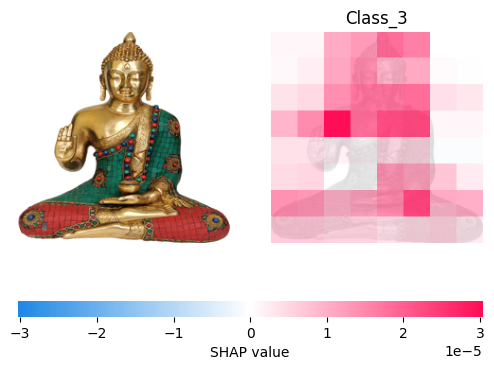

<Figure size 640x480 with 0 Axes>

In [ ]:
# 7. Visualize & save
plt.figure(figsize=(10,10))
shap.image_plot(shap_values, img)
plt.savefig(save_path + '/' + 'SHAP values buddha - MobileViTv2.png', bbox_inches='tight')
plt.show()

### 4.7.3 - Local feature importance with GradCAM

In [ ]:
# 1. Load and preprocess the image
image_path = '/content/drive/My Drive/Colab Notebooks/OCDS_P6&P8/flipkart_images/f4d4c2eec77732f56e47722d7a355f2b.jpg'
image = Image.open(image_path).convert("RGB")
transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])
input_tensor = transform(image).unsqueeze(0).to(device)

In [ ]:
# 2. Set the target layer (last MobileVitV2Block)
target_layer = model.stages[4][1] # see https://github.com/jacobgil/pytorch-grad-cam for layer choices for pytorch models
# here model is loaded with timm, use print(model) to find correct model layer

In [ ]:
# 3. Forward pass to get predicted class
model.eval()
with torch.no_grad():
    outputs = model(input_tensor)
    class_idx = outputs.argmax(dim=1).item()

In [ ]:
# 4. GradCAM setup
cam = GradCAM(model, target_layer)

In [ ]:
# 5. Run GradCAM (pass input tensor and class index)
grayscale_cam = cam(input_tensor, class_idx)[0]

In [ ]:
# 6. Unnormalize image for visualization (convert back to [0,1] range)
rgb_img = input_tensor.squeeze().cpu().numpy().transpose(1, 2, 0)
rgb_img = (rgb_img * np.array([0.229, 0.224, 0.225])) + np.array([0.485, 0.456, 0.406])
rgb_img = np.clip(rgb_img, 0, 1)

In [ ]:
# 7. Convert both grayscale_cam and rgb_img to torch tensors for visualize_cam
grayscale_cam_tensor = torch.tensor(grayscale_cam).unsqueeze(0).float()
rgb_img_tensor = torch.tensor(rgb_img).permute(2, 0, 1).unsqueeze(0).float()

In [ ]:
# 8. Overlay heatmap using visualize_cam
heatmap, result = visualize_cam(grayscale_cam_tensor, rgb_img_tensor)

In [ ]:
# 9. Convert result back to numpy for plotting
result_np = result.squeeze().permute(1, 2, 0).numpy()
result_np = np.clip(result_np, 0, 1)

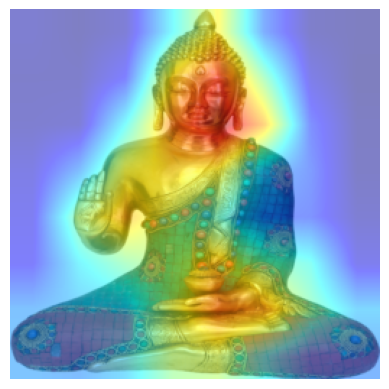

In [ ]:
# 10. Display
plt.imshow(result_np)
plt.axis('off')
plt.savefig(save_path + '/'+ 'hot_buddha.png')
plt.show()

Source : https://openaccess.thecvf.com/content_ICCV_2017/papers/Selvaraju_Grad-CAM_Visual_Explanations_ICCV_2017_paper.pdf

## 4.8 - Export model info for layers graph

### 4.8.1 - onnx file for netron.app

In [ ]:
onnx_path = "/content/drive/My Drive/Colab Notebooks/OCDS_P6&P8/mobilevitv2.onnx"

# 1. Set device (CPU or CUDA)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# 2. Move your model to the correct device and set to eval mode
model = model.to(device)
model.eval()

# 3. Create a dummy input with the correct shape and device
# Your model expects (batch_size, 3, 256, 256) images
dummy_input = torch.randn(1, 3, 256, 256, device=device)

# 4. (Optional but recommended) Run a forward pass once to initialize BatchNorm stats
with torch.no_grad():
    _ = model(dummy_input)

# 5. Export to ONNX
torch.onnx.export(
    model,
    dummy_input,
    onnx_path,
    export_params=True,
    opset_version=13,  # You can use a different opset if needed
    do_constant_folding=True,
    input_names=['input'],
    output_names=['output'],
    dynamic_axes={'input': {0: 'batch_size'}, 'output': {0: 'batch_size'}}
)

print("Exported model to mobilevitv2.onnx")


/usr/local/lib/python3.11/dist-packages/timm/models/mobilevit.py:508: TracerWarning: Converting a tensor to a Python float might cause the trace to be incorrect. We can't record the data flow of Python values, so this value will be treated as a constant in the future. This means that the trace might not generalize to other inputs!
  new_h, new_w = math.ceil(H / patch_h) * patch_h, math.ceil(W / patch_w) * patch_w
/usr/local/lib/python3.11/dist-packages/timm/models/mobilevit.py:511: TracerWarning: Converting a tensor to a Python boolean might cause the trace to be incorrect. We can't record the data flow of Python values, so this value will be treated as a constant in the future. This means that the trace might not generalize to other inputs!
  if new_h != H or new_w != W:


Exported model to mobilevitv2.onnx


**Upload onnx file to https://netron.app/ to save as png or svg file.**

### 4.8.2 - With visualtorch

**- With matplotlib:**

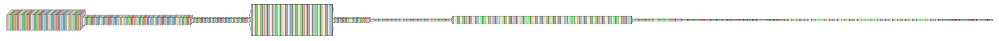

In [ ]:
# Create a CPU copy of the model
model_cpu = model.cpu()

# Move model to CPU for visualization
model_cpu = model.cpu()

# Generate the architecture visualization
img = visualtorch.layered_view(model_cpu, input_shape=(1, 3, 256, 256))

# Make the output larger and more readable
plt.figure(figsize=(20, 20))  # You can adjust (width, height) as needed
plt.axis("off")
plt.tight_layout()
plt.imshow(img)
plt.show()

**- With plotly express:**

In [ ]:
# Move model to CPU for visualization
model_cpu = model.cpu()

# Generate the architecture visualization (PIL Image or numpy array)
img = visualtorch.layered_view(model_cpu, input_shape=(1, 3, 256, 256))
if hasattr(img, 'convert'):
    img_rgb = np.array(img.convert("RGB"))
else:
    img_rgb = img

In [ ]:
fig = px.imshow(img_rgb)
fig.update_layout(width=1200, height=100, margin=dict(l=10, r=10, b=10, t=10))
fig.update_xaxes(showticklabels=False)
fig.update_yaxes(showticklabels=False)
fig.write_html("/content/drive/My Drive/Colab Notebooks/OCDS_P6&P8/model_diagram.html")
fig.show()

### 4.8.3 - With torchviz

In [ ]:
dummy_input = torch.randn(1, 3, 256, 256)
output = model(dummy_input)
dot = make_dot(output, params=dict(model.named_parameters()))
dot.format = 'png'
dot.render("/content/drive/My Drive/Colab Notebooks/OCDS_P6&P8/mobilevitv2_graph")

'/content/drive/My Drive/Colab Notebooks/OCDS_P6&P8/mobilevitv2_graph.png'